# GBI strategies with the essential goal of 80%

In [1]:
import numpy as np
import numpy_financial as npf
import pandas as pd
import math
from scipy.stats import norm
import matplotlib.pyplot as plt
%matplotlib inline
import functions as fun
%load_ext autoreload
%autoreload 2

## 1. Goals and data

Let's assume that an investor will invest the same amount of money every year during the period of 40 years. At the time of retirement he wants to have no less than 90% or 80% of all the money he invested with the probability of 1 (essential goal). For example, if yearly contrubution is 6 800 francs, in 40 years investor's account should not be lower than 217 600 francs if the goal is equal to 80% of all non-portfolio income (272 000 francs * 0.8) or 244 800 francs if it's 90% (272 000 francs * 0.9) 

Plus, the investor has another goal: at the end of the investment horizon he wants to receive 500 000 francs in addition to the first sum. This second goal is not essential, as investor cannot and doesn't want to secure it with the probability of 1. However, this goal is still important, and the investor is interested in implementing a strategy that would give him the highest possible probability of achieving this goal.

To test strategies that will be discussed in this notebook, we will need two assets:
- risky asset: to calibrate parameters of this asset, data for SPI for the past 30 years was taken; based on it, average annualized return and volatility were computed; then this parameters were paste into Monte Carlo engine to simulate 1 000 scenarios for 40 years;
- safe asset: as currently interest rates in Switzerland are negative, cash was considered a risk-free asset; we assume that a cash account for pillar 3a pays a preferential rate of 0.05% per year, however, for investments made outside of the pillar 3a, cash rate is 0%. This will be important when we test unconstrained (not related to the pillar 3a strategies) and constrained strategies (related to the pillar 3a).

All the data is monthly and rebalancing takes place on a monthly basis.

In this notebook strategies with the essential goal of 80% are tested.

In [2]:
# Yearly contribution (in thousands)
c = 6.8

In [3]:
# All non-portfolio income invested over 40 years
init_cap = 40*c

In [4]:
# Maximum drawdown for drawdown strategies
maxdd = 0.2

In [5]:
# Essential goal equal to 80% of all non-portfolo income
ess_goal = 40*c*(1-maxdd)

In [6]:
# Important goal that we want to achieve (in thousands)
imp_goal = 500

In [7]:
# Probability of a second, important, goal
prob_1 = 0.9
prob_2 = 0.8

In [8]:
multipliers = np.arange(1, 11, 1).tolist()

In [9]:
n_scen = 1000

In [10]:
np.random.seed(0)
prices = fun.gbm(n_years=40, n_scenarios=n_scen, mu=0.0942, sigma=0.1567, steps_per_year=12, s_0=1)
rets_eq = prices.pct_change().dropna()
rets_eq.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.032999,0.048221,-0.011254,0.012587,0.018166,0.016964,0.032312,-0.074391,0.005619,0.018663,...,0.068584,-0.025621,0.067341,-0.006782,0.016799,0.012272,0.071248,0.015017,-0.043804,-0.051452
2,-0.061492,-0.069592,0.009937,-0.035502,0.004194,-0.023989,-0.027017,-0.013901,0.039677,0.049880,...,-0.007555,-0.051102,0.028964,0.015138,0.022327,0.101902,-0.033200,-0.000853,-0.046999,0.004204
3,0.079922,0.033576,0.002671,0.019233,-0.046924,-0.009961,0.011706,0.012347,-0.061388,0.022670,...,-0.058572,0.033927,0.010804,-0.027140,0.025716,-0.014944,0.088349,0.006467,0.079190,-0.028917
4,0.035595,0.091250,0.020113,0.059258,-0.070784,0.039838,0.009225,0.042455,0.047099,-0.094212,...,-0.018087,0.027070,-0.004421,-0.023071,-0.061697,0.003264,0.041626,0.049882,0.018228,0.026596
5,0.021860,-0.025509,-0.061673,-0.017584,-0.064505,0.045142,0.120553,0.053622,-0.004872,0.008606,...,0.038710,0.007343,0.068681,-0.029763,-0.010605,-0.052349,0.023800,-0.016481,0.025648,0.020811


In [11]:
zeros = np.zeros(481)
zeros[:480:12] = 1
index = np.arange(0, n_scen, 1).tolist()
income = pd.DataFrame(data=zeros, index=range(1, 482))
income = income[np.repeat(income.columns.values, n_scen)].set_axis(index, axis='columns')
income = income*c
income

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,...,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
477,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
478,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
479,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
480,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## 2. Goal-based investment strategies

### 2.1. Strategies LIQ (liquid wealth)

Here and in what follows, strategies are named as in the book "Goal-based Investing: Theory And Practice" by R. Deguest, L. Martellini and V. Milhau, however, they are not exactly the same as described in the book, as we had to substitute bonds with cash and this affected the strategies. 

Strategies LIQ imply the following:
-  first 32 years all the contributions (non-portfolio income) are invested into cash (40 years * 0.8); starting from the 33 year, the amount equal to the investor's essential goal is invested into the risk-free asset, and all the remaining contributions - into the risky asset and/or risk-free asset depending on the existing constraints (for example, in case of the pillar 3a, no more than 50% can be allocated to equities)
- this should be the most expensive strategies, as they have a high opportunity cost: first 32 years, all the income is invested in the risk-free asset, meaning that the part, invested in the risky asset is only equal to the income generated by the portfolio itself.

### 2.1.1. Unconstrained LIQ strategy 

In this and following sections contraint means that no more than 50% of portfolio value can be allocated to equities. Plus, for unconstrained strategies, cash rate is equal to 0%.

In [12]:
cashrate = 0
monthly_cashreturn = (1+cashrate)**(1/12) - 1
rets_cash = pd.DataFrame(data=monthly_cashreturn, index=rets_eq.index, columns=rets_eq.columns)
rets_cash.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [13]:
# For essential goal of 90%:
# goal_liq = pd.read_excel('Data.xlsx', 'Weights cash 1 90%', index_col=0) 

# For essential goal of 80%:
goal_liq = pd.read_excel('Data.xlsx', 'Weights cash 1 80%', index_col=0)

index = np.arange(0, n_scen, 1).tolist()
goal_liq = goal_liq[np.repeat(goal_liq.columns.values, n_scen)].set_axis(index, axis='columns')
goal_liq = goal_liq*c
goal_liq

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,...,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8
2,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,...,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8
3,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,...,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8
4,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,...,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8
5,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,...,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
476,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,...,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6
477,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,...,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6
478,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,...,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6
479,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,...,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6


In [14]:
psp_max=1
acc_value_liq, w_liq = fun.acc_value_10multipliers(rets_eq, rets_cash, income, goal_liq, multipliers, psp_max=psp_max)
stats_table_liq = fun.statistics_table(acc_value_liq, goal_liq, imp_goal, prob_1, prob_2, c)
stats_table_liq

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0050,0.0111,0.0159,0.0185,0.0200,0.0208,0.0212,0.0215,0.0217,0.0218
Min. final account value,252.6010,238.0360,228.4910,222.8750,219.8410,218.3240,215.3500,212.9340,212.1650,211.4980
Mean final account value,302.7390,354.2180,405.7600,435.4710,452.9960,463.3930,470.0270,474.4510,477.9300,480.1880
Max. final account value,435.5630,919.0940,1152.2320,1269.2020,1290.0700,1296.6750,1344.5010,1470.4150,1632.5770,1673.5410
Final account value volatility,25.2750,87.3160,136.2790,158.3860,171.4670,179.9010,185.4420,190.0100,195.0030,198.6690
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0010,0.0040,0.0090,0.0130
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,2.2500,1.4170,1.1190,1.3970
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,2.2500,4.6660,5.4350,6.1020
Expected drawdown,0.0410,0.1080,0.1570,0.1770,0.1860,0.1920,0.1950,0.1970,0.1980,0.1990
Worst drawdown,0.1310,0.3710,0.4210,0.4200,0.4270,0.4500,0.4480,0.4540,0.4580,0.4580


### 2.1.2. Constrained LIQ strategy 

For constrained strategies, cash rate is equal to 0.05% per year.

In [15]:
cashrate = 0.0005
monthly_cashreturn = (1+cashrate)**(1/12) - 1
rets_cash = pd.DataFrame(data=monthly_cashreturn, index=rets_eq.index, columns=rets_eq.columns)
rets_cash.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042
2,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042
3,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042
4,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042
5,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042


In [16]:
psp_max=0.5
acc_value_liq_c, w_liq_c = fun.acc_value_10multipliers(rets_eq, rets_cash, income, goal_liq, multipliers, psp_max=psp_max)
stats_table_liq_c = fun.statistics_table(acc_value_liq_c, goal_liq, imp_goal, prob_1, prob_2, c)
stats_table_liq_c

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0072,0.0181,0.0254,0.0289,0.0306,0.0311,0.0310,0.0304,0.0296,0.0287
Min. final account value,256.9650,244.6250,240.8960,237.8750,232.9160,229.3120,226.5580,218.7010,218.1100,217.7680
Mean final account value,318.0520,416.2880,504.1690,554.2530,580.5470,591.3590,591.2760,586.1140,576.6750,566.3000
Max. final account value,489.2350,942.3300,1262.6660,1508.0830,1619.7560,1663.1650,1716.8250,1757.1780,1791.3080,1799.2350
Final account value volatility,31.9120,110.6120,173.9480,207.3130,227.3890,238.5660,245.1520,249.0130,251.8400,252.9030
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.0470,0.1040,0.1240,0.1330,0.1360,0.1380,0.1380,0.1370,0.1360,0.1330
Worst drawdown,0.1430,0.2720,0.3100,0.3260,0.3320,0.3330,0.3330,0.3330,0.3330,0.3320


### 2.1.3. Constrained LIQ strategy and saved taxes

Let's assume that investing into the pillar 3a allows to save taxes in the amount equal to 20% of the invested sum. For example, if the investor invests every year 6 800 francs into the pillar 3a, annually he saves 1 360 francs (6 800 francs * 0.2). This saved sum can be invested into the risky assets to increase the probability of attaining the important goal. Let's check whether it gives a significant improvement.

In [17]:
zeros = np.zeros(481)
zeros[:480:12] = 0.2
index = np.arange(0, n_scen, 1).tolist()
income_taxes = pd.DataFrame(data=zeros, index=range(1, 482))
income_taxes = income_taxes[np.repeat(income_taxes.columns.values, n_scen)].set_axis(index, axis='columns')
income_taxes = income_taxes*c
income_taxes

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,...,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
5,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
477,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
478,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
479,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
480,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [18]:
acc_value_taxes = fun.fixedmix_allocation(rets_eq, rets_cash, 1, income_taxes)
acc_value_taxes.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,1.40488,1.42558,1.3447,1.37712,1.38471,1.38307,1.40394,1.25883,1.36764,1.38538,...,1.45327,1.32516,1.45158,1.35078,1.38285,1.37669,1.4569,1.38042,1.30043,1.29002
2,1.31849,1.32637,1.35806,1.32823,1.39051,1.34989,1.36601,1.24133,1.42191,1.45448,...,1.44229,1.25744,1.49363,1.37122,1.41372,1.51698,1.40853,1.37924,1.23931,1.29545
3,1.42387,1.37091,1.36168,1.35377,1.32527,1.33645,1.38201,1.25666,1.33462,1.48746,...,1.35782,1.3001,1.50976,1.33401,1.45008,1.49431,1.53297,1.38816,1.33745,1.25799
4,1.47455,1.496,1.38907,1.43399,1.23146,1.38969,1.39475,1.31001,1.39748,1.34732,...,1.33326,1.33529,1.50309,1.30323,1.36061,1.49919,1.59678,1.45741,1.36183,1.29144
5,1.50678,1.45784,1.3034,1.40878,1.15202,1.45242,1.5629,1.38025,1.39067,1.35892,...,1.38487,1.3451,1.60632,1.26444,1.34618,1.4207,1.63479,1.43339,1.39676,1.31832


In [19]:
acc_value_liq_ct = []
for m in multipliers:
    acc = acc_value_liq_c[m-1] + acc_value_taxes
    acc_value_liq_ct.append(acc)

In [20]:
stats_table_liq_ct = fun.statistics_table(acc_value_liq_ct, goal_liq, imp_goal, prob_1, prob_2, c)
stats_table_liq_ct

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0487,0.0519,0.0547,0.0562,0.0570,0.0573,0.0572,0.0571,0.0568,0.0564
Min. final account value,336.7520,326.1850,316.2380,308.6070,303.6490,300.0440,297.2900,295.1380,293.4780,292.0520
Mean final account value,957.0130,1055.2490,1143.1310,1193.2150,1219.5080,1230.3210,1230.2370,1225.0760,1215.6360,1205.2620
Max. final account value,4242.4320,4785.3650,5076.6430,5322.0590,5433.7330,5477.1420,5530.8020,5571.1550,5605.2850,5613.2120
Final account value volatility,557.6190,641.9580,705.8710,737.0670,754.7490,763.0610,766.2860,766.0400,762.8840,758.5920
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.1720,0.1930,0.2020,0.2070,0.2090,0.2090,0.2090,0.2090,0.2080,0.2060
Worst drawdown,0.4560,0.4880,0.4850,0.4840,0.4790,0.4780,0.4790,0.4790,0.4790,0.4790


### 2.1.4. LIQ strategies graphically 

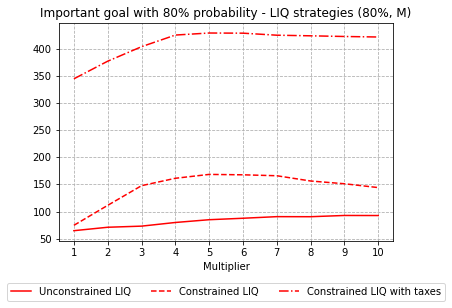

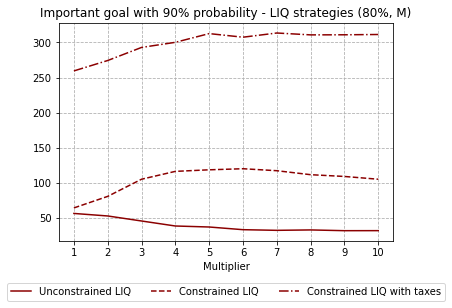

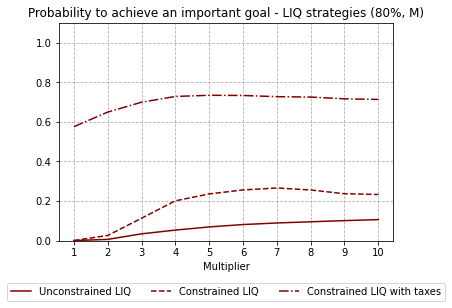

In [21]:
legend = ['Unconstrained LIQ', 'Constrained LIQ', 'Constrained LIQ with taxes']
titles = ['Important goal with 80% probability - LIQ strategies (80%, M)', 
          'Important goal with 90% probability - LIQ strategies (80%, M)',
         'Probability to achieve an important goal - LIQ strategies (80%, M)']
colors = ['r', 'darkred', 'maroon']
statuses = [1, 2, 3]

for color, title, status in zip(colors, titles, statuses):
    fun.plot(stats_table_liq, stats_table_liq_c, stats_table_liq_ct, color, title, legend, status)   

### 2.2. Strategies INC-ZER (zero reinvestment rate)

This group of strategies consists of the following:
-  first 8 years all the contributions (non-portfolio income) are invested into equities (40 years - (40 years * 0.8)) with regard to the existing constraint (in case it is applied) 
- starting from the 9 year, contributions are invested into cash, while the excess wealth (if any) - into the risky asset
- these strategies should be cheaper than the first ones, as they have a lower opportunity cost: first 8 years, all the income is invested in the risky asset.

### 2.2.1. Unconstrained INC-ZER strategy 

In [22]:
cashrate = 0
monthly_cashreturn = (1+cashrate)**(1/12) - 1
rets_cash = pd.DataFrame(data=monthly_cashreturn, index=rets_eq.index, columns=rets_eq.columns)
rets_cash.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [23]:
# For essential goal of 90%:
# goal_zer = pd.read_excel('Data.xlsx', 'Weights cash 2 90%', index_col=0) 

# For essential goal of 80%:
goal_zer = pd.read_excel('Data.xlsx', 'Weights cash 2 80%', index_col=0)

index = np.arange(0, n_scen, 1).tolist()
goal_zer = goal_zer[np.repeat(goal_zer.columns.values, n_scen)].set_axis(index, axis='columns')
goal_zer = goal_zer*c
goal_zer.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [24]:
psp_max=1
acc_value_zer, w_zer = fun.acc_value_10multipliers(rets_eq, rets_cash, income, goal_zer, multipliers, psp_max=psp_max)
stats_table_zer = fun.statistics_table(acc_value_zer, goal_zer, imp_goal, prob_1, prob_2, c)
stats_table_zer

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0698,0.0879,0.0882,0.0882,0.0882,0.0882,0.0882,0.0881,0.0881,0.0881
Min. final account value,268.6760,246.4790,228.8560,220.5290,218.0940,217.6390,217.6020,217.4520,217.2730,217.1920
Mean final account value,1956.8890,3181.5960,3191.3890,3192.5800,3192.8520,3192.8120,3192.7360,3192.3720,3192.3200,3192.3300
Max. final account value,15378.2700,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740
Final account value volatility,1748.5500,2688.4360,2684.3200,2684.2340,2684.1260,2684.2120,2684.3390,2684.7520,2684.8460,2684.8610
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0010,0.0010,0.0020
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1480,0.3270,0.2110
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1480,0.3270,0.4080
Expected drawdown,0.2760,0.3450,0.3460,0.3460,0.3460,0.3460,0.3460,0.3460,0.3460,0.3460
Worst drawdown,0.5480,0.6300,0.6300,0.6300,0.6300,0.6300,0.6300,0.6300,0.6300,0.6300


### 2.2.2. Constrained INC-ZER strategy 

In [25]:
cashrate = 0.0005
monthly_cashreturn = (1+cashrate)**(1/12) - 1
rets_cash = pd.DataFrame(data=monthly_cashreturn, index=rets_eq.index, columns=rets_eq.columns)
rets_cash.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042
2,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042
3,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042
4,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042
5,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042


In [26]:
psp_max=0.5
acc_value_zer_c, w_zer_c = fun.acc_value_10multipliers(rets_eq, rets_cash, income, goal_zer, multipliers, psp_max=psp_max)
stats_table_zer_c = fun.statistics_table(acc_value_zer_c, goal_zer, imp_goal, prob_1, prob_2, c)
stats_table_zer_c

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0460,0.0464,0.0464,0.0464,0.0464,0.0464,0.0464,0.0464,0.0464,0.0464
Min. final account value,277.0140,270.6260,280.2750,286.2330,283.8380,270.6340,252.7610,232.4150,225.0260,224.9010
Mean final account value,834.2830,839.1650,839.2600,839.2780,839.2890,839.2810,839.2670,839.2480,839.2420,839.2420
Max. final account value,2037.6820,2037.6820,2037.6820,2037.6820,2037.6820,2037.6820,2037.6820,2037.6820,2037.6820,2037.6820
Final account value volatility,293.2060,289.2580,289.1130,289.0830,289.0630,289.0800,289.1080,289.1470,289.1600,289.1610
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.1650,0.1660,0.1660,0.1660,0.1660,0.1660,0.1660,0.1660,0.1660,0.1660
Worst drawdown,0.3500,0.3500,0.3500,0.3500,0.3500,0.3500,0.3500,0.3500,0.3500,0.3500


### 2.2.3. Constrained INC-ZER strategy and saved taxes

In [27]:
acc_value_zer_ct = []
for m in multipliers:
    acc = acc_value_zer_c[m-1] + acc_value_taxes
    acc_value_zer_ct.append(acc)

In [28]:
stats_table_zer_ct = fun.statistics_table(acc_value_zer_ct, goal_zer, imp_goal, prob_1, prob_2, c)
stats_table_zer_ct

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0653,0.0655,0.0655,0.0655,0.0655,0.0655,0.0655,0.0655,0.0655,0.0655
Min. final account value,337.6470,327.0950,336.7450,342.7020,350.2190,349.4080,331.5350,311.1890,303.7990,303.6740
Mean final account value,1473.2450,1478.1270,1478.2220,1478.2390,1478.2510,1478.2420,1478.2290,1478.2100,1478.2040,1478.2040
Max. final account value,5880.7170,5880.7170,5880.7170,5880.7170,5880.7170,5880.7170,5880.7170,5880.7170,5880.7170,5880.7170
Final account value volatility,821.5800,818.0910,817.9810,817.9580,817.9430,817.9550,817.9740,818.0010,818.0100,818.0100
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.2200,0.2210,0.2210,0.2210,0.2210,0.2210,0.2210,0.2210,0.2210,0.2210
Worst drawdown,0.4600,0.4600,0.4600,0.4600,0.4600,0.4600,0.4600,0.4600,0.4600,0.4600


### 2.2.4. INC-ZER strategies graphically

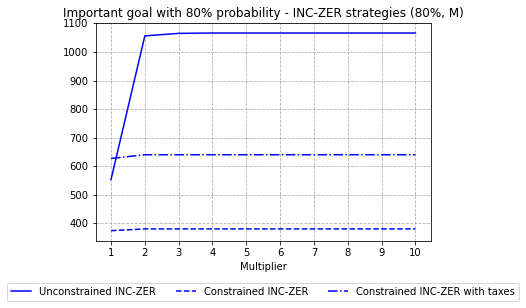

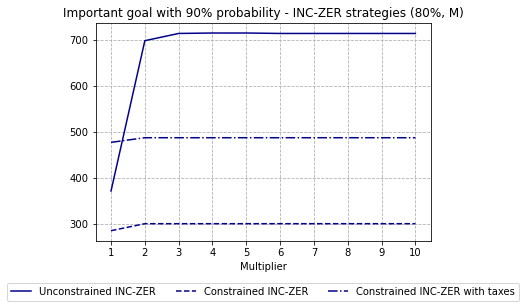

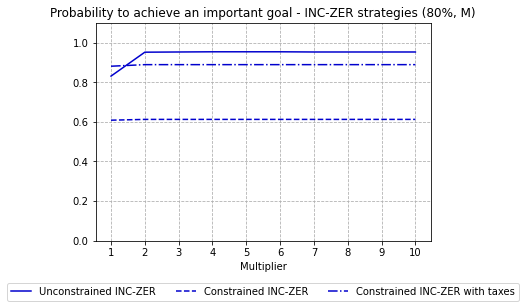

In [29]:
legend = ['Unconstrained INC-ZER', 'Constrained INC-ZER', 'Constrained INC-ZER with taxes']
titles = ['Important goal with 80% probability - INC-ZER strategies (80%, M)', 
          'Important goal with 90% probability - INC-ZER strategies (80%, M)',
         'Probability to achieve an important goal - INC-ZER strategies (80%, M)']
colors = ['b', 'darkblue', 'mediumblue']
statuses = [1, 2, 3]

for color, title, status in zip(colors, titles, statuses):
    fun.plot(stats_table_zer, stats_table_zer_c, stats_table_zer_ct, color, title, legend, status)

### 2.3. Strategies INC-FWD ("forward" rates)

According to this group of srategies:
-  first 8 years all the contributions (non-portfolio income) are invested into equities (40 years - (40 years * 0.8)) with regard to the existing constraint (in case it is applied); this part of the strategy is the same as the first part of the strategy INC-ZER
- starting from the 9 year, part of the contributions are invested into cash, while the excess wealth (if any) - into the risky asset; what part of yearly contributions is invested into cash depends on the cash rate that we assume to be non-negative and unchangeable during the whole investment period (for the pillar 3a)
- more precisely, knowing the cash rate, we can "discount" our contributions, the discounted part is invested into risk-free assets
- these strategies should be even cheaper than the second ones, as they allow to allocate a bigger part of our income to equities.

### 2.3.1. Unconstrained INC-FWD strategy 

In [30]:
cashrate = 0
monthly_cashreturn = (1+cashrate)**(1/12) - 1
rets_cash = pd.DataFrame(data=monthly_cashreturn, index=rets_eq.index, columns=rets_eq.columns)
rets_cash.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [31]:
ones = np.ones(480)
index = np.arange(0, n_scen, 1).tolist()
df_cash = pd.DataFrame(data=ones, index=range(1, 481))
df_cash = df_cash[np.repeat(df_cash.columns.values, n_scen)].set_axis(index, axis='columns')
df_cash.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
5,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [32]:
psp_max=1
acc_value_fwd, w_fwd = fun.acc_value_10multipliers_2(rets_eq, rets_cash, income, goal_zer, df_cash, multipliers, psp_max=psp_max)
stats_table_fwd = fun.statistics_table(acc_value_fwd, goal_zer, imp_goal, prob_1, prob_2, c)
stats_table_fwd

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0698,0.0879,0.0882,0.0882,0.0882,0.0882,0.0882,0.0881,0.0881,0.0881
Min. final account value,268.6760,246.4790,228.8560,220.5290,218.0940,217.6390,217.6020,217.4520,217.2730,217.1920
Mean final account value,1956.8890,3181.5960,3191.3890,3192.5800,3192.8520,3192.8120,3192.7360,3192.3720,3192.3200,3192.3300
Max. final account value,15378.2700,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740
Final account value volatility,1748.5500,2688.4360,2684.3200,2684.2340,2684.1260,2684.2120,2684.3390,2684.7520,2684.8460,2684.8610
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0010,0.0010,0.0020
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1480,0.3270,0.2110
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.1480,0.3270,0.4080
Expected drawdown,0.2760,0.3450,0.3460,0.3460,0.3460,0.3460,0.3460,0.3460,0.3460,0.3460
Worst drawdown,0.5480,0.6300,0.6300,0.6300,0.6300,0.6300,0.6300,0.6300,0.6300,0.6300


### 2.3.2. Constrained INC-FWD strategy 

In [33]:
cashrate = 0.0005
monthly_cashreturn = (1+cashrate)**(1/12) - 1
rets_cash = pd.DataFrame(data=monthly_cashreturn, index=rets_eq.index, columns=rets_eq.columns)
rets_cash.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042
2,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042
3,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042
4,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042
5,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042


In [34]:
index = np.arange(0, n_scen, 1).tolist()
df = pd.read_excel('Data.xlsx', 'DF for cash account', index_col=[0])
df_cash = df[np.repeat(df.columns.values, n_scen)].set_axis(index, axis='columns')
df_cash.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.980244,0.980244,0.980244,0.980244,0.980244,0.980244,0.980244,0.980244,0.980244,0.980244,...,0.980244,0.980244,0.980244,0.980244,0.980244,0.980244,0.980244,0.980244,0.980244,0.980244
2,0.980285,0.980285,0.980285,0.980285,0.980285,0.980285,0.980285,0.980285,0.980285,0.980285,...,0.980285,0.980285,0.980285,0.980285,0.980285,0.980285,0.980285,0.980285,0.980285,0.980285
3,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,...,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326
4,0.980367,0.980367,0.980367,0.980367,0.980367,0.980367,0.980367,0.980367,0.980367,0.980367,...,0.980367,0.980367,0.980367,0.980367,0.980367,0.980367,0.980367,0.980367,0.980367,0.980367
5,0.980408,0.980408,0.980408,0.980408,0.980408,0.980408,0.980408,0.980408,0.980408,0.980408,...,0.980408,0.980408,0.980408,0.980408,0.980408,0.980408,0.980408,0.980408,0.980408,0.980408


In [35]:
psp_max=0.5
acc_value_fwd_c, w_fwd_c = fun.acc_value_10multipliers_2(rets_eq, rets_cash, income, goal_zer, df_cash, multipliers, psp_max=psp_max)
stats_table_fwd_c = fun.statistics_table(acc_value_fwd_c, goal_zer, imp_goal, prob_1, prob_2, c)
stats_table_fwd_c

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0461,0.0464,0.0464,0.0464,0.0464,0.0464,0.0464,0.0464,0.0464,0.0464
Min. final account value,276.6390,270.4530,280.4090,287.4520,290.1290,282.2570,265.0790,231.2960,218.8220,218.0710
Mean final account value,834.6220,839.1720,839.2630,839.2860,839.2980,839.2950,839.2810,839.2490,839.2370,839.2380
Max. final account value,2037.6820,2037.6820,2037.6820,2037.6820,2037.6820,2037.6820,2037.6820,2037.6820,2037.6820,2037.6820
Final account value volatility,293.0120,289.2500,289.1070,289.0680,289.0460,289.0520,289.0810,289.1470,289.1720,289.1710
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.1650,0.1660,0.1660,0.1660,0.1660,0.1660,0.1660,0.1660,0.1660,0.1660
Worst drawdown,0.3500,0.3500,0.3500,0.3500,0.3500,0.3500,0.3500,0.3500,0.3500,0.3500


### 2.3.3. Constrained INC-FWD strategy and saved taxes 

In [36]:
acc_value_fwd_ct = []
for m in multipliers:
    acc = acc_value_fwd_c[m-1] + acc_value_taxes
    acc_value_fwd_ct.append(acc)

In [37]:
stats_table_fwd_ct = fun.statistics_table(acc_value_fwd_ct, goal_zer, imp_goal, prob_1, prob_2, c)
stats_table_fwd_ct

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0653,0.0655,0.0655,0.0655,0.0655,0.0655,0.0655,0.0655,0.0655,0.0655
Min. final account value,337.3520,326.9230,336.8790,343.9220,350.6980,351.2500,343.8530,310.0690,297.5950,296.8440
Mean final account value,1473.5840,1478.1330,1478.2250,1478.2480,1478.2600,1478.2570,1478.2420,1478.2110,1478.1990,1478.1990
Max. final account value,5880.7170,5880.7170,5880.7170,5880.7170,5880.7170,5880.7170,5880.7170,5880.7170,5880.7170,5880.7170
Final account value volatility,821.3970,818.0850,817.9760,817.9470,817.9310,817.9350,817.9560,818.0000,818.0170,818.0170
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.2200,0.2210,0.2210,0.2210,0.2210,0.2210,0.2210,0.2210,0.2210,0.2210
Worst drawdown,0.4600,0.4600,0.4600,0.4600,0.4600,0.4600,0.4600,0.4600,0.4600,0.4600


### 2.3.4. INC-FWD strategies graphically

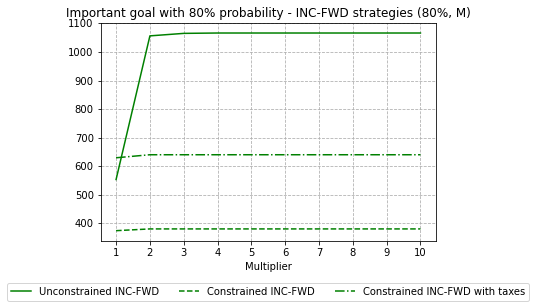

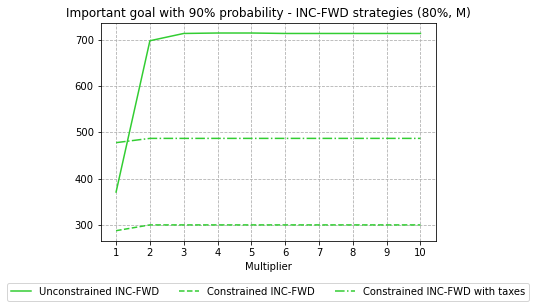

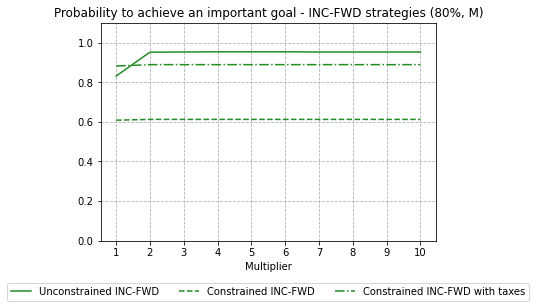

In [38]:
legend = ['Unconstrained INC-FWD', 'Constrained INC-FWD', 'Constrained INC-FWD with taxes']
titles = ['Important goal with 80% probability - INC-FWD strategies (80%, M)', 
          'Important goal with 90% probability - INC-FWD strategies (80%, M)',
         'Probability to achieve an important goal - INC-FWD strategies (80%, M)']
colors = ['g', 'limegreen', 'forestgreen']
statuses = [1, 2, 3]

for color, title, status in zip(colors, titles, statuses):
    fun.plot(stats_table_fwd, stats_table_fwd_c, stats_table_fwd_ct, color, title, legend, status)

### 2.4. Drawdown constraint strategies

As it can be seen from above, although almost all presented strategies (with only few exceptions) secured the essential goal with the probability of 1 and some of them even gave good results for the important goal, the drawdowns were quite substantial. Taking into account that our essential goal is 80% of all the invested non-portfilio capital, it makes sense to test strategies with an imposed drawdown constraint of 20% and see whether they can still help to achieve our goals while protecting the investor from drawdowns.

### 2.4.1. Unconstrained drawdown strategy

In [39]:
cashrate = 0
monthly_cashreturn = (1+cashrate)**(1/12) - 1
rets_cash = pd.DataFrame(data=monthly_cashreturn, index=rets_eq.index, columns=rets_eq.columns)
rets_cash.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [40]:
psp_max=1
acc_value_dd, w_dd = fun.acc_value_10multipliers_dd(rets_eq, rets_cash, income, maxdd, multipliers, psp_max=psp_max)

In [41]:
stats_table_dd = fun.statistics_table(acc_value_dd, goal_zer, imp_goal, prob_1, prob_2, c)
stats_table_dd

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0183,0.0340,0.0466,0.0560,0.0623,0.0645,0.0654,0.0655,0.0654,0.0651
Min. final account value,284.3740,295.1140,303.8430,301.2060,283.2560,278.7910,270.7620,257.6930,241.6870,227.4010
Mean final account value,406.2420,602.0060,857.1120,1151.6040,1445.1410,1579.7000,1640.0340,1656.8190,1662.7410,1663.0180
Max. final account value,564.8710,1207.7400,2506.1130,4915.2500,8892.0140,9823.9220,10711.1070,11746.3270,12412.5380,12679.0380
Final account value volatility,48.2250,151.3820,338.8730,630.4280,1014.4370,1210.2030,1310.0950,1352.1690,1401.1320,1454.7910
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.0530,0.1010,0.1390,0.1650,0.1820,0.1900,0.1950,0.1990,0.2030,0.2060
Worst drawdown,0.0970,0.1570,0.1860,0.1960,0.2060,0.2350,0.2410,0.2590,0.2770,0.2950


### 2.4.2. Constrained drawdown strategy

In [42]:
cashrate = 0.0005
monthly_cashreturn = (1+cashrate)**(1/12) - 1
rets_cash = pd.DataFrame(data=monthly_cashreturn, index=rets_eq.index, columns=rets_eq.columns)
rets_cash.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042
2,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042
3,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042
4,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042
5,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,...,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042,0.000042


In [43]:
psp_max=0.5
acc_value_dd_c, w_dd_c = fun.acc_value_10multipliers_dd(rets_eq, rets_cash, income, maxdd, multipliers, psp_max=psp_max)

In [44]:
stats_table_dd_c = fun.statistics_table(acc_value_dd_c, goal_zer, imp_goal, prob_1, prob_2, c)
stats_table_dd_c

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0187,0.0344,0.0437,0.0451,0.0455,0.0457,0.0458,0.0458,0.0459,0.0459
Min. final account value,286.7840,297.1690,300.2280,292.8070,294.2360,290.7410,286.2830,282.2410,280.2100,277.1800
Mean final account value,410.0750,607.0540,782.4480,813.4730,822.1950,825.5840,827.2010,828.1220,828.6360,828.9320
Max. final account value,570.4670,1218.5460,1923.5440,2001.6150,2017.1350,2030.6960,2032.4570,2034.2320,2037.6820,2037.6820
Final account value volatility,48.7690,152.8290,268.2920,283.9710,286.9530,287.7070,287.9890,287.9930,287.9680,287.8800
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.0530,0.1010,0.1350,0.1480,0.1540,0.1570,0.1580,0.1590,0.1600,0.1600
Worst drawdown,0.0960,0.1570,0.1840,0.1930,0.1970,0.1990,0.2030,0.2100,0.2150,0.2220


### 4.2.3. Constrained drawdown strategy and saved taxes

In [45]:
psp_max=1
acc_value_dd_t, w_dd_t = fun.acc_value_10multipliers_dd(rets_eq, rets_cash, income_taxes, maxdd, multipliers, psp_max=psp_max)

In [46]:
acc_value_dd_ct = []
for m in multipliers:
    acc = acc_value_dd_c[m-1] + acc_value_dd_t[m-1]
    acc_value_dd_ct.append(acc)

In [47]:
stats_table_dd_ct = fun.statistics_table(acc_value_dd_ct, goal_zer, imp_goal, prob_1, prob_2, c)
stats_table_dd_ct

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0266,0.0419,0.0515,0.0545,0.0565,0.0573,0.0576,0.0578,0.0578,0.0578
Min. final account value,344.1400,356.6020,361.3760,356.0250,359.0670,360.7210,356.6660,351.8180,347.9960,343.1400
Mean final account value,492.0900,728.4650,955.1490,1045.3950,1113.2980,1144.0080,1158.1190,1162.7510,1164.5770,1164.9970
Max. final account value,684.5600,1462.2550,2401.3630,2991.2900,3806.5720,3994.3280,4172.6750,4379.8840,4514.4350,4566.5680
Final account value volatility,58.5230,183.3940,336.3470,408.4380,483.2680,520.5380,538.1010,543.1850,548.5840,555.4650
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.0530,0.1010,0.1350,0.1510,0.1580,0.1620,0.1640,0.1650,0.1660,0.1670
Worst drawdown,0.0960,0.1570,0.1840,0.1930,0.1970,0.1990,0.2030,0.2060,0.2080,0.2110


### 2.4.4. Drawdown strategies graphically

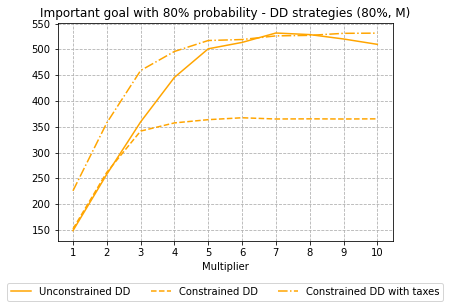

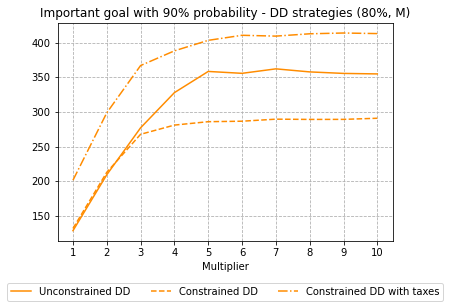

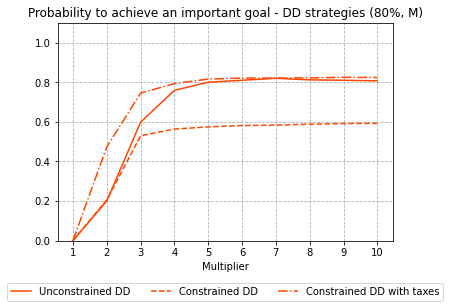

In [48]:
legend = ['Unconstrained DD', 'Constrained DD', 'Constrained DD with taxes']
titles = ['Important goal with 80% probability - DD strategies (80%, M)', 
          'Important goal with 90% probability - DD strategies (80%, M)',
         'Probability to achieve an important goal - DD strategies (80%, M)']
colors = ['orange', 'darkorange', 'orangered']
statuses = [1, 2, 3]

for color, title, status in zip(colors, titles, statuses):
    fun.plot(stats_table_dd, stats_table_dd_c, stats_table_dd_ct, color, title, legend, status)

### 2.5. All GBI strategies graphically

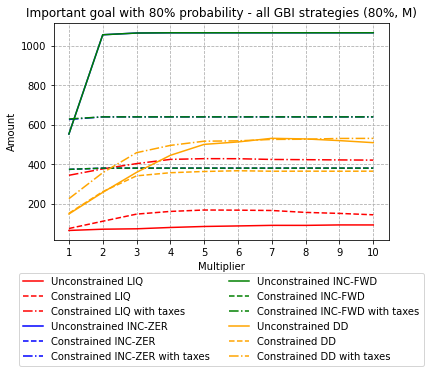

In [49]:
plt.title('Important goal with 80% probability - all GBI strategies (80%, M)')
plt.xlabel('Multiplier')
plt.ylabel('Amount')
plt.grid(ls='--')
plt.plot(multipliers, stats_table_liq.iloc[-1], color = 'r')
plt.plot(multipliers, stats_table_liq_c.iloc[-1], color = 'r', ls='--')
plt.plot(multipliers, stats_table_liq_ct.iloc[-1], color = 'r', ls='-.')
plt.plot(multipliers, stats_table_zer.iloc[-1], color = 'b')
plt.plot(multipliers, stats_table_zer_c.iloc[-1], color = 'b', ls='--')
plt.plot(multipliers, stats_table_zer_ct.iloc[-1], color = 'b', ls='-.')
plt.plot(multipliers, stats_table_fwd.iloc[-1], color = 'g')
plt.plot(multipliers, stats_table_fwd_c.iloc[-1], color = 'g', ls='--')
plt.plot(multipliers, stats_table_fwd_ct.iloc[-1], color = 'g', ls='-.')
plt.plot(multipliers, stats_table_dd.iloc[-1], color = 'orange')
plt.plot(multipliers, stats_table_dd_c.iloc[-1], color = 'orange', ls='--')
plt.plot(multipliers, stats_table_dd_ct.iloc[-1], color = 'orange', ls='-.')
legend = ['Unconstrained LIQ', 'Constrained LIQ', 'Constrained LIQ with taxes', 
          'Unconstrained INC-ZER', 'Constrained INC-ZER', 'Constrained INC-ZER with taxes', 
          'Unconstrained INC-FWD', 'Constrained INC-FWD', 'Constrained INC-FWD with taxes',
          'Unconstrained DD', 'Constrained DD', 'Constrained DD with taxes']
plt.legend(legend, loc="lower center", bbox_to_anchor=(0.5, -0.6), ncol=2)
plt.xticks(multipliers)
plt.show()

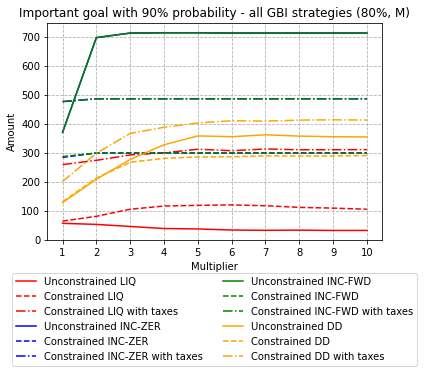

In [50]:
m = 2
plt.title('Important goal with 90% probability - all GBI strategies (80%, M)')
plt.xlabel('Multiplier')
plt.ylabel('Amount')
plt.grid(ls='--')
plt.plot(multipliers, stats_table_liq.iloc[-m], color = 'r')
plt.plot(multipliers, stats_table_liq_c.iloc[-m], color = 'r', ls='--')
plt.plot(multipliers, stats_table_liq_ct.iloc[-m], color = 'r', ls='-.')
plt.plot(multipliers, stats_table_zer.iloc[-m], color = 'b')
plt.plot(multipliers, stats_table_zer_c.iloc[-m], color = 'b', ls='--')
plt.plot(multipliers, stats_table_zer_ct.iloc[-m], color = 'b', ls='-.')
plt.plot(multipliers, stats_table_fwd.iloc[-m], color = 'g')
plt.plot(multipliers, stats_table_fwd_c.iloc[-m], color = 'g', ls='--')
plt.plot(multipliers, stats_table_fwd_ct.iloc[-m], color = 'g', ls='-.')
plt.plot(multipliers, stats_table_dd.iloc[-m], color = 'orange')
plt.plot(multipliers, stats_table_dd_c.iloc[-m], color = 'orange', ls='--')
plt.plot(multipliers, stats_table_dd_ct.iloc[-m], color = 'orange', ls='-.')
legend = ['Unconstrained LIQ', 'Constrained LIQ', 'Constrained LIQ with taxes', 
          'Unconstrained INC-ZER', 'Constrained INC-ZER', 'Constrained INC-ZER with taxes', 
          'Unconstrained INC-FWD', 'Constrained INC-FWD', 'Constrained INC-FWD with taxes',
          'Unconstrained DD', 'Constrained DD', 'Constrained DD with taxes']
plt.legend(legend, loc="lower center", bbox_to_anchor=(0.5, -0.6), ncol=2)
plt.xticks(multipliers)
plt.show()

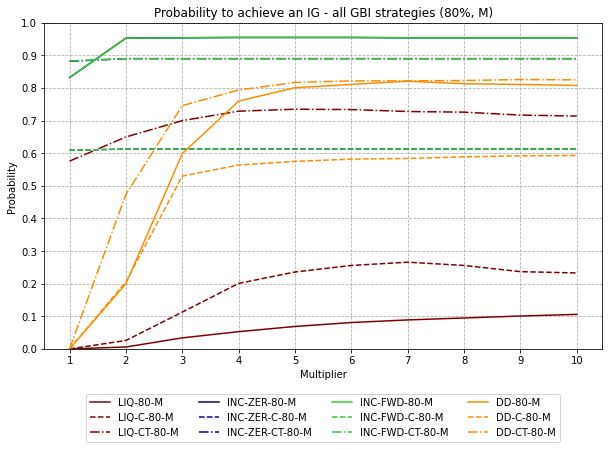

In [51]:
n = -3
plt.figure(figsize=(10, 6))
plt.title('Probability to achieve an IG - all GBI strategies (80%, M)')
plt.xlabel('Multiplier')
plt.ylabel('Probability')
plt.grid(ls='--')
plt.plot(multipliers, stats_table_liq.iloc[n], color = 'maroon')
plt.plot(multipliers, stats_table_liq_c.iloc[n], color = 'maroon', ls='--')
plt.plot(multipliers, stats_table_liq_ct.iloc[n], color = 'maroon', ls='-.')
plt.plot(multipliers, stats_table_zer.iloc[n], color = 'darkblue')
plt.plot(multipliers, stats_table_zer_c.iloc[n], color = 'darkblue', ls='--')
plt.plot(multipliers, stats_table_zer_ct.iloc[n], color = 'darkblue', ls='-.')
plt.plot(multipliers, stats_table_fwd.iloc[n], color = 'limegreen')
plt.plot(multipliers, stats_table_fwd_c.iloc[n], color = 'limegreen', ls='--')
plt.plot(multipliers, stats_table_fwd_ct.iloc[n], color = 'limegreen', ls='-.')
plt.plot(multipliers, stats_table_dd.iloc[n], color = 'darkorange')
plt.plot(multipliers, stats_table_dd_c.iloc[n], color = 'darkorange', ls='--')
plt.plot(multipliers, stats_table_dd_ct.iloc[n], color = 'darkorange', ls='-.')
legend = ['LIQ-80-M', 'LIQ-C-80-M', 'LIQ-CT-80-M', 
          'INC-ZER-80-M', 'INC-ZER-C-80-M', 'INC-ZER-CT-80-M', 
          'INC-FWD-80-M', 'INC-FWD-C-80-M', 'INC-FWD-CT-80-M',
          'DD-80-M', 'DD-C-80-M', 'DD-CT-80-M']
plt.legend(legend, loc="lower center", bbox_to_anchor=(0.5, -0.3), ncol=4)
plt.xticks(multipliers)
probas = np.arange(0, 1.1, 0.1).tolist()
plt.yticks(probas)
plt.ylim(0, 1)
plt.show()

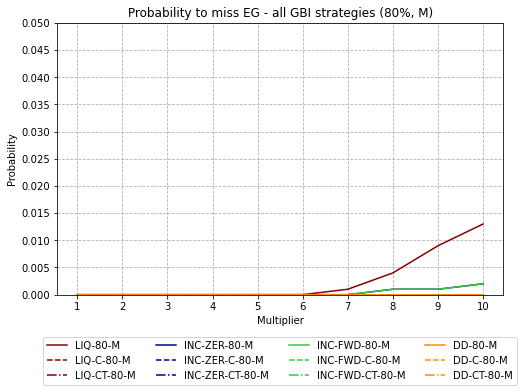

In [52]:
n = -8

plt.figure(figsize=(8, 5))
plt.title('Probability to miss EG - all GBI strategies (80%, M)')
plt.xlabel('Multiplier')
plt.ylabel('Probability')
plt.grid(ls='--')
plt.plot(multipliers, stats_table_liq.iloc[n], color = 'maroon')
plt.plot(multipliers, stats_table_liq_c.iloc[n], color = 'maroon', ls='--')
plt.plot(multipliers, stats_table_liq_ct.iloc[n], color = 'maroon', ls='-.')
plt.plot(multipliers, stats_table_zer.iloc[n], color = 'darkblue')
plt.plot(multipliers, stats_table_zer_c.iloc[n], color = 'darkblue', ls='--')
plt.plot(multipliers, stats_table_zer_ct.iloc[n], color = 'darkblue', ls='-.')
plt.plot(multipliers, stats_table_fwd.iloc[n], color = 'limegreen')
plt.plot(multipliers, stats_table_fwd_c.iloc[n], color = 'limegreen', ls='--')
plt.plot(multipliers, stats_table_fwd_ct.iloc[n], color = 'limegreen', ls='-.')
plt.plot(multipliers, stats_table_dd.iloc[n], color = 'darkorange')
plt.plot(multipliers, stats_table_dd_c.iloc[n], color = 'darkorange', ls='--')
plt.plot(multipliers, stats_table_dd_ct.iloc[n], color = 'darkorange', ls='-.')
legend = ['LIQ-80-M', 'LIQ-C-80-M', 'LIQ-CT-80-M', 
          'INC-ZER-80-M', 'INC-ZER-C-80-M', 'INC-ZER-CT-80-M', 
          'INC-FWD-80-M', 'INC-FWD-C-80-M', 'INC-FWD-CT-80-M',
          'DD-80-M', 'DD-C-80-M', 'DD-CT-80-M']
plt.legend(legend, loc="lower center", bbox_to_anchor=(0.5, -0.35), ncol=4)
plt.xticks(multipliers)
probas = np.arange(0, 0.051, 0.005).tolist()
plt.yticks(probas)
plt.ylim(0, 0.05)
plt.show()

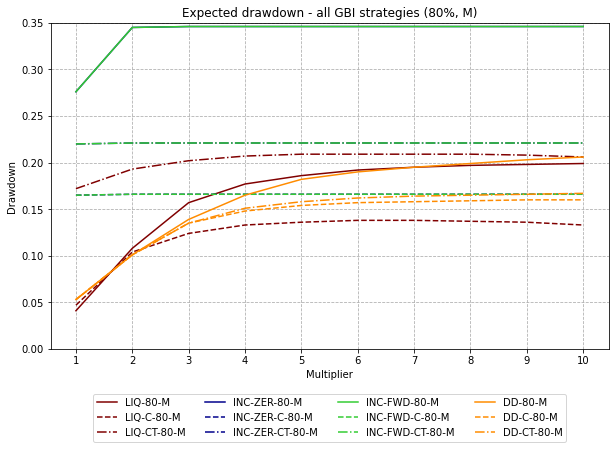

In [53]:
n = -5
plt.figure(figsize=(10, 6))
plt.title('Expected drawdown - all GBI strategies (80%, M)')
plt.xlabel('Multiplier')
plt.ylabel('Drawdown')
plt.grid(ls='--')
plt.plot(multipliers, stats_table_liq.iloc[n], color = 'maroon')
plt.plot(multipliers, stats_table_liq_c.iloc[n], color = 'maroon', ls='--')
plt.plot(multipliers, stats_table_liq_ct.iloc[n], color = 'maroon', ls='-.')
plt.plot(multipliers, stats_table_zer.iloc[n], color = 'darkblue')
plt.plot(multipliers, stats_table_zer_c.iloc[n], color = 'darkblue', ls='--')
plt.plot(multipliers, stats_table_zer_ct.iloc[n], color = 'darkblue', ls='-.')
plt.plot(multipliers, stats_table_fwd.iloc[n], color = 'limegreen')
plt.plot(multipliers, stats_table_fwd_c.iloc[n], color = 'limegreen', ls='--')
plt.plot(multipliers, stats_table_fwd_ct.iloc[n], color = 'limegreen', ls='-.')
plt.plot(multipliers, stats_table_dd.iloc[n], color = 'darkorange')
plt.plot(multipliers, stats_table_dd_c.iloc[n], color = 'darkorange', ls='--')
plt.plot(multipliers, stats_table_dd_ct.iloc[n], color = 'darkorange', ls='-.')
legend = ['LIQ-80-M', 'LIQ-C-80-M', 'LIQ-CT-80-M', 
          'INC-ZER-80-M', 'INC-ZER-C-80-M', 'INC-ZER-CT-80-M', 
          'INC-FWD-80-M', 'INC-FWD-C-80-M', 'INC-FWD-CT-80-M',
          'DD-80-M', 'DD-C-80-M', 'DD-CT-80-M']
plt.legend(legend, loc="lower center", bbox_to_anchor=(0.5, -0.3), ncol=4)
plt.xticks(multipliers)
plt.ylim(0, 0.35)
plt.show()

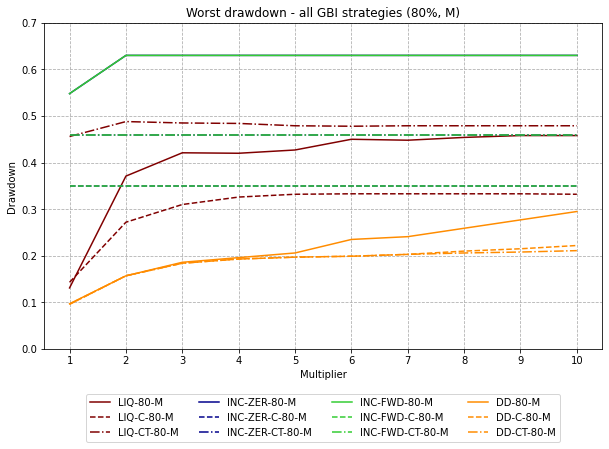

In [54]:
n = -4
plt.figure(figsize=(10, 6))
plt.title('Worst drawdown - all GBI strategies (80%, M)')
plt.xlabel('Multiplier')
plt.ylabel('Drawdown')
plt.grid(ls='--')
plt.plot(multipliers, stats_table_liq.iloc[n], color = 'maroon')
plt.plot(multipliers, stats_table_liq_c.iloc[n], color = 'maroon', ls='--')
plt.plot(multipliers, stats_table_liq_ct.iloc[n], color = 'maroon', ls='-.')
plt.plot(multipliers, stats_table_zer.iloc[n], color = 'darkblue')
plt.plot(multipliers, stats_table_zer_c.iloc[n], color = 'darkblue', ls='--')
plt.plot(multipliers, stats_table_zer_ct.iloc[n], color = 'darkblue', ls='-.')
plt.plot(multipliers, stats_table_fwd.iloc[n], color = 'limegreen')
plt.plot(multipliers, stats_table_fwd_c.iloc[n], color = 'limegreen', ls='--')
plt.plot(multipliers, stats_table_fwd_ct.iloc[n], color = 'limegreen', ls='-.')
plt.plot(multipliers, stats_table_dd.iloc[n], color = 'darkorange')
plt.plot(multipliers, stats_table_dd_c.iloc[n], color = 'darkorange', ls='--')
plt.plot(multipliers, stats_table_dd_ct.iloc[n], color = 'darkorange', ls='-.')
legend = ['LIQ-80-M', 'LIQ-C-80-M', 'LIQ-CT-80-M', 
          'INC-ZER-80-M', 'INC-ZER-C-80-M', 'INC-ZER-CT-80-M', 
          'INC-FWD-80-M', 'INC-FWD-C-80-M', 'INC-FWD-CT-80-M',
          'DD-80-M', 'DD-C-80-M', 'DD-CT-80-M']
plt.legend(legend, loc="lower center", bbox_to_anchor=(0.5, -0.3), ncol=4)
plt.xticks(multipliers)
plt.ylim(0, 0.7)
plt.show()

## 3. Strategies with quarterly rebalancing

### 3.1. Data

In [55]:
np.random.seed(0)
prices = fun.gbm(n_years=40, n_scenarios=n_scen, mu=0.0942, sigma=0.1567, steps_per_year=12, s_0=1)
index_to_delete_1 = np.arange(1, 481, 3).tolist()
index_to_delete_2 = np.arange(2, 481, 3).tolist()
index_to_delete = index_to_delete_1 + index_to_delete_2
prices_2 = prices.drop(index_to_delete_1, axis=0, inplace=False)
prices_q = prices_2.drop(index_to_delete_2, axis=0, inplace=False)
index = np.arange(1, 161, 1).tolist()
rets_eq_q = prices_q.pct_change().dropna().set_axis(index, axis='rows')
rets_eq_q.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.046961,0.008020,0.001239,-0.004579,-0.025540,-0.017319,0.016181,-0.075989,-0.018664,0.093719,...,-0.001606,-0.044045,0.110121,-0.019111,0.066232,0.098756,0.127185,0.020709,-0.016582,-0.075009
2,0.164316,0.027532,-0.030322,0.042332,-0.070204,0.082446,0.073968,0.024765,0.051932,-0.026749,...,-0.013799,0.052300,0.017954,0.001284,-0.088812,0.011442,0.088747,-0.006239,0.003763,0.013471
3,0.111324,0.076123,-0.035153,-0.008033,-0.094972,0.133677,-0.176256,0.021986,-0.107294,0.006950,...,-0.044622,-0.105434,0.110145,0.209784,0.131357,-0.084378,-0.004141,0.000096,-0.038633,0.120196
4,0.060943,0.000885,0.073721,0.052869,0.057316,0.073429,0.181794,-0.001673,-0.004304,-0.066133,...,0.056517,0.093253,0.046847,0.085587,-0.047545,-0.024734,0.105589,-0.066513,0.063801,-0.083884
5,0.069033,-0.027866,0.136688,0.138528,0.117298,0.045362,0.008500,0.053317,-0.153266,0.031864,...,0.197629,0.115399,0.024395,-0.059951,0.027175,-0.019058,0.259398,0.176822,0.077497,-0.005810


In [56]:
zeros = np.zeros(161)
zeros[:160:4] = 1
index = np.arange(0, n_scen, 1).tolist()
income_q = pd.DataFrame(data=zeros, index=range(1, 162))
income_q = income_q[np.repeat(income_q.columns.values, n_scen)].set_axis(index, axis='columns')
income_q = income_q*c
income_q

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,...,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,...,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,...,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8
158,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
159,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
160,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### 3.2. Unconstrained LIQ strategy (quarterly rebalancing)

In [57]:
cashrate = 0
q_cashreturn = (1+cashrate)**(1/4) - 1
rets_cash_q = pd.DataFrame(data=q_cashreturn, index=rets_eq_q.index, columns=rets_eq_q.columns)
rets_cash_q.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [58]:
# For essential goal of 90%:
# goal_liq_q = pd.read_excel('Data.xlsx', 'Weights cash 1 90% quart', index_col=0)

# For essential goal of 80%:
goal_liq_q = pd.read_excel('Data.xlsx', 'Weights cash 1 80% quart', index_col=0)

index = np.arange(0, n_scen, 1).tolist()
goal_liq_q = goal_liq_q[np.repeat(goal_liq_q.columns.values, n_scen)].set_axis(index, axis='columns')
goal_liq_q = goal_liq_q*c
goal_liq_q

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,...,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8
2,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,...,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8
3,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,...,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8
4,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,...,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8,6.8
5,13.6,13.6,13.6,13.6,13.6,13.6,13.6,13.6,13.6,13.6,...,13.6,13.6,13.6,13.6,13.6,13.6,13.6,13.6,13.6,13.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,...,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6
157,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,...,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6
158,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,...,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6
159,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,...,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6


In [59]:
psp_max=1
acc_value_liq_quart, w_liq_quart = fun.acc_value_10multipliers(rets_eq_q, rets_cash_q, income_q, goal_liq_q, multipliers, psp_max=psp_max)
stats_table_liq_q = fun.statistics_table(acc_value_liq_quart, goal_liq_q, imp_goal, prob_1, prob_2, c)
stats_table_liq_q

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0050,0.0110,0.0159,0.0186,0.0200,0.0208,0.0213,0.0215,0.0219,0.0221
Min. final account value,252.6010,237.0920,226.9360,221.4100,212.3850,217.4080,212.2720,211.5770,208.9990,206.4670
Mean final account value,302.7390,353.5120,404.7600,435.1560,452.7590,463.4540,470.6450,475.1250,479.4280,483.0600
Max. final account value,435.5630,904.5370,1147.8550,1301.7640,1362.3240,1373.7040,1402.3600,1442.3220,1510.7430,1574.1580
Final account value volatility,25.2750,85.7110,134.4060,156.9380,170.6680,179.8470,186.2120,191.5200,195.3870,198.7650
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0010,0.0020,0.0140,0.0190,0.0200,0.0240
Expected shortfall,0.0000,0.0000,0.0000,0.0000,5.2150,0.1850,1.1280,2.4630,3.3460,3.0040
Worst shortfall,0.0000,0.0000,0.0000,0.0000,5.2150,0.1920,5.3280,6.0230,8.6010,11.1330
Expected drawdown,0.0310,0.0860,0.1300,0.1490,0.1580,0.1640,0.1680,0.1700,0.1720,0.1730
Worst drawdown,0.1230,0.3570,0.4180,0.4200,0.4200,0.4380,0.4470,0.4520,0.4550,0.4580


### 3.3. Constrained LIQ strategy (quarterly rebalancing)

In [60]:
cashrate = 0.0005
q_cashreturn = (1+cashrate)**(1/4) - 1
rets_cash_q = pd.DataFrame(data=q_cashreturn, index=rets_eq_q.index, columns=rets_eq_q.columns)
rets_cash_q.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125
2,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125
3,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125
4,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125
5,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125


In [61]:
psp_max=0.5
acc_value_liq_quart_c, w_liq_quart_c = fun.acc_value_10multipliers(rets_eq_q, rets_cash_q, income_q, goal_liq_q, multipliers, psp_max=psp_max)
stats_table_liq_q_c = fun.statistics_table(acc_value_liq_quart_c, goal_liq_q, imp_goal, prob_1, prob_2, c)
stats_table_liq_q_c

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0072,0.0179,0.0252,0.0288,0.0303,0.0304,0.0297,0.0290,0.0284,0.0281
Min. final account value,256.9450,244.7040,240.2970,239.9460,237.7290,229.9030,227.1220,212.5360,214.3670,216.2500
Mean final account value,317.9310,414.7630,501.7570,552.3700,577.1050,583.1230,577.8150,572.5990,566.3950,563.7510
Max. final account value,487.5020,939.7310,1268.7050,1513.6330,1634.5450,1690.0610,1739.9810,1794.6460,1802.0180,1802.6360
Final account value volatility,31.8340,109.2630,172.5870,207.1340,229.1020,243.0690,252.1070,260.5270,263.9830,265.8070
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0010,0.0020,0.0020
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,5.0640,3.1430,0.9550
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,5.0640,3.2330,1.3500
Expected drawdown,0.0360,0.0870,0.1060,0.1160,0.1190,0.1190,0.1180,0.1170,0.1170,0.1170
Worst drawdown,0.1350,0.2640,0.3120,0.3190,0.3220,0.3160,0.3120,0.3130,0.3110,0.2870


### 3.4. Constrained LIQ strategy and saved taxes (quarterly rebalancing)

In [62]:
zeros = np.zeros(161)
zeros[:160:4] = 0.2
index = np.arange(0, n_scen, 1).tolist()
income_taxes_q = pd.DataFrame(data=zeros, index=range(1, 162))
income_taxes_q = income_taxes_q[np.repeat(income_taxes_q.columns.values, n_scen)].set_axis(index, axis='columns')
income_taxes_q = income_taxes_q*c
income_taxes_q

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,...,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
5,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,...,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,...,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36,1.36
158,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
159,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
160,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [63]:
acc_value_taxes_q = fun.fixedmix_allocation(rets_eq_q, rets_cash_q, 1, income_taxes_q)
acc_value_taxes_q.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,1.42387,1.37091,1.36168,1.35377,1.32527,1.33645,1.38201,1.25666,1.33462,1.48746,...,1.35782,1.3001,1.50976,1.33401,1.45008,1.49431,1.53297,1.38816,1.33745,1.25799
2,1.65783,1.40865,1.3204,1.41108,1.23223,1.44663,1.48423,1.28778,1.40393,1.44767,...,1.33908,1.36809,1.53687,1.33572,1.32129,1.51141,1.66902,1.3795,1.34248,1.27493
3,1.84239,1.51588,1.27398,1.39974,1.1152,1.64001,1.22263,1.31609,1.25329,1.45773,...,1.27933,1.22385,1.70615,1.61593,1.49485,1.38388,1.66211,1.37964,1.29062,1.42818
4,1.95467,1.51722,1.3679,1.47375,1.17912,1.76044,1.44489,1.31389,1.2479,1.36133,...,1.35163,1.33798,1.78608,1.75424,1.42378,1.34965,1.83761,1.28787,1.37296,1.30838
5,3.54349,2.79705,3.10077,3.2263,2.83695,3.26198,2.82873,2.81645,2.2082,2.80804,...,3.24753,3.00932,3.22283,2.92753,2.85943,2.65801,4.02706,3.11608,2.94476,2.65287


In [64]:
acc_value_liq_quart_ct = []
for m in multipliers:
    acc = acc_value_liq_quart_c[m-1] + acc_value_taxes_q
    acc_value_liq_quart_ct.append(acc)

In [65]:
stats_table_liq_q_ct = fun.statistics_table(acc_value_liq_quart_ct, goal_liq_q, imp_goal, prob_1, prob_2, c)
stats_table_liq_q_ct

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0487,0.0519,0.0546,0.0562,0.0569,0.057,0.0568,0.0566,0.0564,0.0563
Min. final account value,336.7470,326.9360,317.6760,310.6780,308.9940,311.589,313.3840,313.2550,312.9190,312.6910
Mean final account value,956.8930,1053.7250,1140.7190,1191.3320,1216.0660,1222.084,1216.7770,1211.5610,1205.3560,1202.7130
Max. final account value,4241.7080,4782.7660,5098.5030,5327.6100,5448.5220,5504.038,5553.9580,5608.6230,5615.9950,5616.6130
Final account value volatility,557.5030,640.3250,704.2870,736.4520,754.8410,762.487,764.0220,766.0270,762.7180,758.8450
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.1520,0.1710,0.1810,0.1860,0.1870,0.187,0.1870,0.1860,0.1850,0.1850
Worst drawdown,0.4350,0.4680,0.4740,0.4680,0.4660,0.471,0.4790,0.4430,0.4420,0.4410


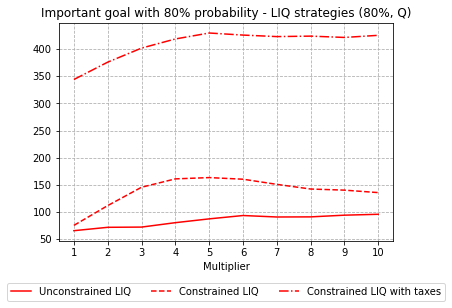

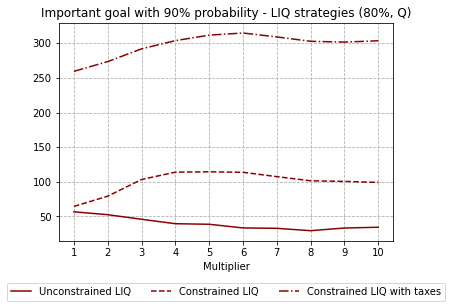

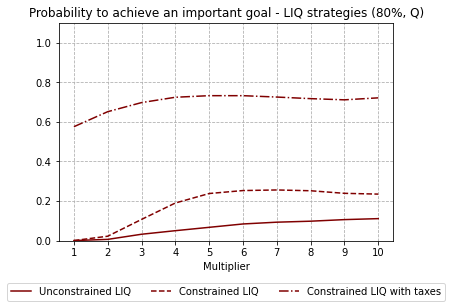

In [66]:
legend = ['Unconstrained LIQ', 'Constrained LIQ', 'Constrained LIQ with taxes']
titles = ['Important goal with 80% probability - LIQ strategies (80%, Q)', 
          'Important goal with 90% probability - LIQ strategies (80%, Q)',
         'Probability to achieve an important goal - LIQ strategies (80%, Q)']
colors = ['r', 'darkred', 'maroon']
statuses = [1, 2, 3]

for color, title, status in zip(colors, titles, statuses):
    fun.plot(stats_table_liq_q, stats_table_liq_q_c, stats_table_liq_q_ct, color, title, legend, status)

### 3.5. Unconstrained INC-ZER strategy (quarterly rebalancing)

In [67]:
cashrate = 0
q_cashreturn = (1+cashrate)**(1/4) - 1
rets_cash_q = pd.DataFrame(data=q_cashreturn, index=rets_eq_q.index, columns=rets_eq_q.columns)
rets_cash_q.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [68]:
# For essential goal of 90%:
# goal_zer_q = pd.read_excel('Data.xlsx', 'Weights cash 2 90% quart', index_col=0)

# For essential goal of 80%:
goal_zer_q = pd.read_excel('Data.xlsx', 'Weights cash 2 80% quart', index_col=0)

index = np.arange(0, n_scen, 1).tolist()
goal_zer_q = goal_zer_q[np.repeat(goal_zer_q.columns.values, n_scen)].set_axis(index, axis='columns')
goal_zer_q = goal_zer_q*c
goal_zer_q

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,210.8,210.8,210.8,210.8,210.8,210.8,210.8,210.8,210.8,210.8,...,210.8,210.8,210.8,210.8,210.8,210.8,210.8,210.8,210.8,210.8
157,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,...,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6
158,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,...,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6
159,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,...,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6,217.6


In [69]:
psp_max=1
acc_value_zer_quart, w_zer_quart = fun.acc_value_10multipliers(rets_eq_q, rets_cash_q, income_q, goal_zer_q, multipliers, psp_max=psp_max)
stats_table_zer_q = fun.statistics_table(acc_value_zer_quart, goal_zer_q, imp_goal, prob_1, prob_2, c)
stats_table_zer_q

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0698,0.0879,0.0882,0.0882,0.0882,0.0882,0.0882,0.0881,0.0881,0.0881
Min. final account value,268.8830,245.4060,228.6610,220.2320,217.9790,217.5970,215.9720,217.1890,216.2830,215.4900
Mean final account value,1955.9490,3181.2870,3191.6360,3192.9440,3193.1510,3193.0050,3192.8980,3192.3010,3192.3580,3192.3840
Max. final account value,15374.9230,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740
Final account value volatility,1747.2760,2688.3790,2684.2040,2683.9280,2683.8220,2684.0440,2684.1740,2684.8320,2684.8410,2684.8290
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0010,0.0020,0.0040,0.0040,0.0040
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0030,0.8270,0.1920,0.8880,1.5440
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0030,1.6280,0.4110,1.3170,2.1100
Expected drawdown,0.2510,0.3200,0.3210,0.3210,0.3220,0.3220,0.3220,0.3220,0.3220,0.3220
Worst drawdown,0.5380,0.6130,0.6130,0.6130,0.6130,0.6130,0.6130,0.6130,0.6130,0.6130


### 3.6. Constrained INC-ZER strategy (quarterly rebalancing)

In [70]:
cashrate = 0.0005
q_cashreturn = (1+cashrate)**(1/4) - 1
rets_cash_q = pd.DataFrame(data=q_cashreturn, index=rets_eq_q.index, columns=rets_eq_q.columns)
rets_cash_q.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125
2,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125
3,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125
4,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125
5,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125


In [71]:
psp_max=0.5
acc_value_zer_quart_c, w_zer_quart_c = fun.acc_value_10multipliers(rets_eq_q, rets_cash_q, income_q, goal_zer_q, multipliers, psp_max=psp_max)
stats_table_zer_q_c = fun.statistics_table(acc_value_zer_quart_c, goal_zer_q, imp_goal, prob_1, prob_2, c)
stats_table_zer_q_c

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0462,0.0466,0.0466,0.0466,0.0466,0.0466,0.0466,0.0466,0.0466,0.0466
Min. final account value,276.7420,273.5840,277.6410,273.1180,268.7210,246.8100,228.0030,223.9320,224.5160,224.9630
Mean final account value,838.2230,843.2230,843.2950,843.3030,843.3230,843.3040,843.2860,843.2820,843.2830,843.2840
Max. final account value,2079.9840,2079.9840,2079.9840,2079.9840,2079.9840,2079.9840,2079.9840,2079.9840,2079.9840,2079.9840
Final account value volatility,297.3410,293.3760,293.2670,293.2580,293.2230,293.2610,293.2990,293.3070,293.3050,293.3040
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.1470,0.1480,0.1480,0.1490,0.1490,0.1480,0.1480,0.1480,0.1480,0.1480
Worst drawdown,0.3370,0.3370,0.3370,0.3370,0.3370,0.3370,0.3370,0.3370,0.3370,0.3370


### 3.7. Constrained INC-ZER strategy and saved taxes (quarterly rebalancing)

In [72]:
acc_value_zer_quart_ct = []
for m in multipliers:
    acc = acc_value_zer_quart_c[m-1] + acc_value_taxes_q
    acc_value_zer_quart_ct.append(acc)

In [73]:
stats_table_zer_q_ct = fun.statistics_table(acc_value_zer_quart_ct, goal_zer_q, imp_goal, prob_1, prob_2, c)
stats_table_zer_q_ct

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0654,0.0656,0.0656,0.0656,0.0656,0.0656,0.0656,0.0656,0.0656,0.0656
Min. final account value,337.9260,332.9690,342.1240,346.7720,347.4940,325.5830,306.7770,302.7060,303.2900,303.7360
Mean final account value,1477.1850,1482.1850,1482.2570,1482.2650,1482.2840,1482.2660,1482.2480,1482.2440,1482.2450,1482.2450
Max. final account value,5923.0190,5923.0190,5923.0190,5923.0190,5923.0190,5923.0190,5923.0190,5923.0190,5923.0190,5923.0190
Final account value volatility,825.8560,822.3320,822.2490,822.2400,822.2150,822.2410,822.2660,822.2720,822.2710,822.2700
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.2000,0.2000,0.2000,0.2000,0.2000,0.2000,0.2000,0.2000,0.2000,0.2000
Worst drawdown,0.4480,0.4480,0.4480,0.4480,0.4480,0.4480,0.4480,0.4480,0.4480,0.4480


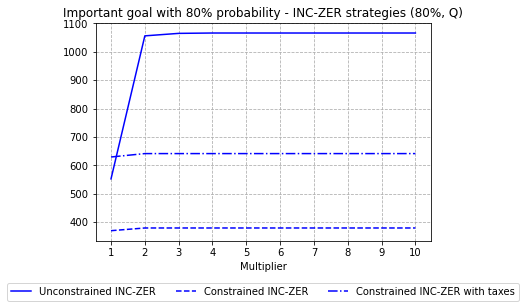

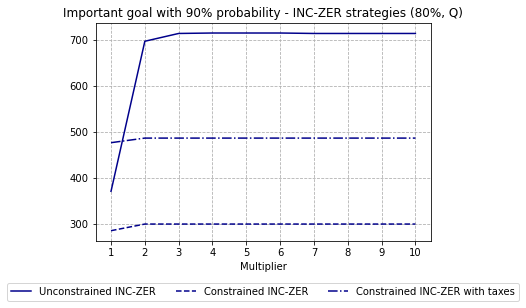

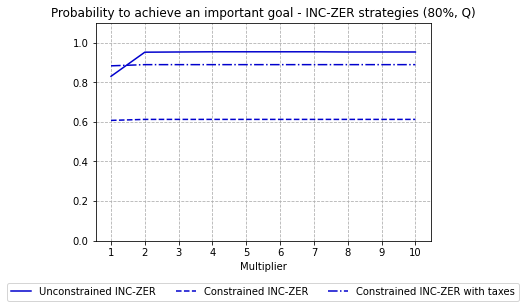

In [74]:
legend = ['Unconstrained INC-ZER', 'Constrained INC-ZER', 'Constrained INC-ZER with taxes']
titles = ['Important goal with 80% probability - INC-ZER strategies (80%, Q)', 
          'Important goal with 90% probability - INC-ZER strategies (80%, Q)',
         'Probability to achieve an important goal - INC-ZER strategies (80%, Q)']
colors = ['b', 'darkblue', 'mediumblue']
statuses = [1, 2, 3]

for color, title, status in zip(colors, titles, statuses):
    fun.plot(stats_table_zer_q, stats_table_zer_q_c, stats_table_zer_q_ct, color, title, legend, status)

### 3.8. Unconstrained INC-FWD strategy (quarterly rebalancing)

In [75]:
cashrate = 0
q_cashreturn = (1+cashrate)**(1/4) - 1
rets_cash_q = pd.DataFrame(data=q_cashreturn, index=rets_eq_q.index, columns=rets_eq_q.columns)
rets_cash_q.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [76]:
ones = np.ones(160)
index = np.arange(0, n_scen, 1).tolist()
df_cash_q = pd.DataFrame(data=ones, index=range(1, 161))
df_cash_q = df_cash_q[np.repeat(df_cash_q.columns.values, n_scen)].set_axis(index, axis='columns')
df_cash_q.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
5,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [77]:
psp_max=1
acc_value_fwd_q, w_fwd_q = fun.acc_value_10multipliers_2(rets_eq_q, rets_cash_q, income_q, goal_zer_q, df_cash_q, multipliers, psp_max=psp_max)
stats_table_fwd_q = fun.statistics_table(acc_value_fwd_q, goal_zer_q, imp_goal, prob_1, prob_2, c)
stats_table_fwd_q

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0698,0.0879,0.0882,0.0882,0.0882,0.0882,0.0882,0.0881,0.0881,0.0881
Min. final account value,268.8830,245.4060,228.6610,220.2320,217.9790,217.5970,215.9720,217.1890,216.2830,215.4900
Mean final account value,1955.9490,3181.2870,3191.6360,3192.9440,3193.1510,3193.0050,3192.8980,3192.3010,3192.3580,3192.3840
Max. final account value,15374.9230,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740,19215.1740
Final account value volatility,1747.2760,2688.3790,2684.2040,2683.9280,2683.8220,2684.0440,2684.1740,2684.8320,2684.8410,2684.8290
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0010,0.0020,0.0040,0.0040,0.0040
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0030,0.8270,0.1920,0.8880,1.5440
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0030,1.6280,0.4110,1.3170,2.1100
Expected drawdown,0.2510,0.3200,0.3210,0.3210,0.3220,0.3220,0.3220,0.3220,0.3220,0.3220
Worst drawdown,0.5380,0.6130,0.6130,0.6130,0.6130,0.6130,0.6130,0.6130,0.6130,0.6130


### 3.9. Constrained INC-FWD strategy (quarterly rebalancing)

In [78]:
cashrate = 0.0005
q_cashreturn = (1+cashrate)**(1/4) - 1
rets_cash_q = pd.DataFrame(data=q_cashreturn, index=rets_eq_q.index, columns=rets_eq_q.columns)
rets_cash_q.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125
2,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125
3,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125
4,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125
5,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125


In [79]:
index = np.arange(0, n_scen, 1).tolist()
df = pd.read_excel('Data.xlsx', 'DF for cash account quart', index_col=[0])
df_cash_q = df[np.repeat(df.columns.values, n_scen)].set_axis(index, axis='columns')
df_cash_q.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,...,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326,0.980326
2,0.980449,0.980449,0.980449,0.980449,0.980449,0.980449,0.980449,0.980449,0.980449,0.980449,...,0.980449,0.980449,0.980449,0.980449,0.980449,0.980449,0.980449,0.980449,0.980449,0.980449
3,0.980571,0.980571,0.980571,0.980571,0.980571,0.980571,0.980571,0.980571,0.980571,0.980571,...,0.980571,0.980571,0.980571,0.980571,0.980571,0.980571,0.980571,0.980571,0.980571,0.980571
4,0.980694,0.980694,0.980694,0.980694,0.980694,0.980694,0.980694,0.980694,0.980694,0.980694,...,0.980694,0.980694,0.980694,0.980694,0.980694,0.980694,0.980694,0.980694,0.980694,0.980694
5,0.980816,0.980816,0.980816,0.980816,0.980816,0.980816,0.980816,0.980816,0.980816,0.980816,...,0.980816,0.980816,0.980816,0.980816,0.980816,0.980816,0.980816,0.980816,0.980816,0.980816


In [80]:
psp_max=0.5
acc_value_fwd_q_c, w_fwd_q_c = fun.acc_value_10multipliers_2(rets_eq_q, rets_cash_q, income_q, goal_zer_q, df_cash_q, multipliers, psp_max=psp_max)
stats_table_fwd_q_c = fun.statistics_table(acc_value_fwd_q_c, goal_zer_q, imp_goal, prob_1, prob_2, c)
stats_table_fwd_q_c

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0462,0.0466,0.0466,0.0466,0.0466,0.0466,0.0466,0.0466,0.0466,0.0466
Min. final account value,276.3350,273.4170,279.8010,277.5490,269.8770,244.0940,223.8640,218.0590,217.8740,217.9960
Mean final account value,838.5580,843.2280,843.2980,843.3090,843.3270,843.3020,843.2820,843.2770,843.2770,843.2780
Max. final account value,2079.9840,2079.9840,2079.9840,2079.9840,2079.9840,2079.9840,2079.9840,2079.9840,2079.9840,2079.9840
Final account value volatility,297.1560,293.3720,293.2620,293.2460,293.2160,293.2650,293.3070,293.3180,293.3180,293.3170
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.1480,0.1480,0.1480,0.1490,0.1490,0.1480,0.1480,0.1480,0.1480,0.1480
Worst drawdown,0.3370,0.3370,0.3370,0.3370,0.3370,0.3370,0.3370,0.3370,0.3370,0.3370


### 3.10. Constrained INC-FWD strategy and saved taxes (quarterly rebalancing)

In [81]:
acc_value_fwd_q_ct = []
for m in multipliers:
    acc = acc_value_fwd_q_c[m-1] + acc_value_taxes_q
    acc_value_fwd_q_ct.append(acc)

In [82]:
stats_table_fwd_q_ct = fun.statistics_table(acc_value_fwd_q_ct, goal_zer_q, imp_goal, prob_1, prob_2, c)
stats_table_fwd_q_ct

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0654,0.0656,0.0656,0.0656,0.0656,0.0656,0.0656,0.0656,0.0656,0.0656
Min. final account value,337.7180,332.7530,342.2500,347.2030,348.6510,322.8670,302.6380,296.8330,296.6480,296.7690
Mean final account value,1477.5190,1482.1900,1482.2600,1482.2710,1482.2880,1482.2640,1482.2440,1482.2390,1482.2390,1482.2400
Max. final account value,5923.0190,5923.0190,5923.0190,5923.0190,5923.0190,5923.0190,5923.0190,5923.0190,5923.0190,5923.0190
Final account value volatility,825.6800,822.3280,822.2450,822.2320,822.2090,822.2430,822.2720,822.2800,822.2800,822.2780
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.2000,0.2000,0.2000,0.2000,0.2000,0.2000,0.2000,0.2000,0.2000,0.2000
Worst drawdown,0.4480,0.4480,0.4480,0.4480,0.4480,0.4480,0.4480,0.4480,0.4480,0.4480


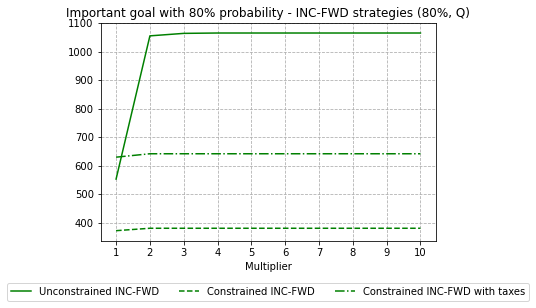

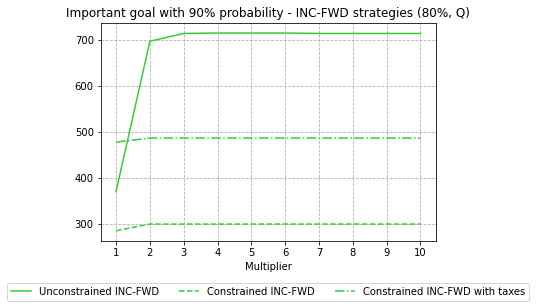

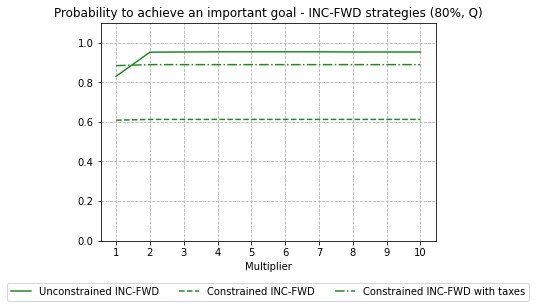

In [83]:
legend = ['Unconstrained INC-FWD', 'Constrained INC-FWD', 'Constrained INC-FWD with taxes']
titles = ['Important goal with 80% probability - INC-FWD strategies (80%, Q)', 
          'Important goal with 90% probability - INC-FWD strategies (80%, Q)',
         'Probability to achieve an important goal - INC-FWD strategies (80%, Q)']
colors = ['g', 'limegreen', 'forestgreen']
statuses = [1, 2, 3]

for color, title, status in zip(colors, titles, statuses):
    fun.plot(stats_table_fwd_q, stats_table_fwd_q_c, stats_table_fwd_q_ct, color, title, legend, status)

### 3.11. Unconstrained drawdown strategy (quarterly rebalancing)

In [84]:
cashrate = 0
q_cashreturn = (1+cashrate)**(1/4) - 1
rets_cash_q = pd.DataFrame(data=q_cashreturn, index=rets_eq_q.index, columns=rets_eq_q.columns)
rets_cash_q.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [85]:
psp_max=1
acc_value_dd_q, w_dd_q = fun.acc_value_10multipliers_dd(rets_eq_q, rets_cash_q, income_q, maxdd, multipliers, psp_max=psp_max)
stats_table_dd_q = fun.statistics_table(acc_value_dd_q, goal_zer_q, imp_goal, prob_1, prob_2, c)
stats_table_dd_q

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0186,0.0350,0.0484,0.0585,0.0650,0.0668,0.0672,0.0672,0.0673,0.0672
Min. final account value,284.5660,297.0100,313.0670,313.7660,304.3150,299.2800,296.8310,270.9010,250.0030,236.8680
Mean final account value,409.3800,617.1250,901.2950,1246.9600,1597.7600,1710.8120,1757.6100,1770.8290,1789.2620,1794.2270
Max. final account value,576.1550,1252.8030,2619.2010,5248.6190,9597.5970,11214.1590,11844.7560,11564.4940,12961.6610,13797.0060
Final account value volatility,49.7420,160.3230,372.7070,723.0050,1204.8300,1360.8370,1455.6380,1487.5370,1541.0730,1570.4330
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.0460,0.0940,0.1350,0.1650,0.1870,0.1980,0.2060,0.2120,0.2170,0.2210
Worst drawdown,0.0930,0.1550,0.1860,0.2110,0.2600,0.2750,0.2840,0.3010,0.3240,0.3530


### 3.12. Constrained drawdown strategy (quarterly rebalancing)

In [86]:
cashrate = 0.0005
q_cashreturn = (1+cashrate)**(1/4) - 1
rets_cash_q = pd.DataFrame(data=q_cashreturn, index=rets_eq_q.index, columns=rets_eq_q.columns)
rets_cash_q.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
1,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125
2,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125
3,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125
4,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125
5,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,...,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125,0.000125


In [87]:
psp_max=0.5
acc_value_dd_q_c, w_dd_q_c = fun.acc_value_10multipliers_dd(rets_eq_q, rets_cash_q, income_q, maxdd, multipliers, psp_max=psp_max)
stats_table_dd_q_c = fun.statistics_table(acc_value_dd_q_c, goal_zer_q, imp_goal, prob_1, prob_2, c)
stats_table_dd_q_c

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0190,0.0353,0.0444,0.0456,0.0459,0.0460,0.0461,0.0461,0.0461,0.0461
Min. final account value,286.9650,299.0520,298.1790,291.7260,286.2380,285.2580,284.3620,282.8430,281.9500,280.8990
Mean final account value,413.2180,622.2070,798.6020,823.3730,829.9680,832.8940,834.4390,835.2740,835.5910,835.5930
Max. final account value,581.8220,1263.8690,1977.3360,2068.8640,2073.2450,2073.2450,2073.2450,2079.9840,2079.9840,2079.9840
Final account value volatility,50.2950,161.8100,278.3000,289.4290,291.5610,292.4170,293.1110,293.2640,293.4410,293.6030
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.0450,0.0940,0.1270,0.1380,0.1420,0.1430,0.1440,0.1450,0.1450,0.1450
Worst drawdown,0.0920,0.1550,0.1840,0.1940,0.2030,0.2050,0.2150,0.2260,0.2330,0.2340


### 3.13. Constrained drawdown strategy and saved taxes (quarterly rebalancing)

In [88]:
psp_max=1

acc_value_dd_t_q, w_dd_t_q = fun.acc_value_10multipliers_dd(rets_eq_q, rets_cash_q, income_taxes_q, maxdd, multipliers, psp_max=psp_max)

acc_value_dd_q_ct = []
for m in multipliers:
    acc = acc_value_dd_q_c[m-1] + acc_value_dd_t_q[m-1]
    acc_value_dd_q_ct.append(acc)

stats_table_dd_q_ct = fun.statistics_table(acc_value_dd_q_ct, goal_zer_q, imp_goal, prob_1, prob_2, c)
stats_table_dd_q_ct

,GBI m=1,GBI m=2,GBI m=3,GBI m=4,GBI m=5,GBI m=6,GBI m=7,GBI m=8,GBI m=9,GBI m=10
IRR,0.0270,0.0428,0.0524,0.0555,0.0575,0.0582,0.0585,0.0586,0.0587,0.0587
Min. final account value,344.3580,358.8620,361.1690,360.1210,362.5580,363.8810,364.4960,363.4040,363.2470,363.1910
Mean final account value,495.8620,746.6490,980.1540,1074.4030,1151.7910,1177.7930,1189.0270,1192.4780,1196.4510,1198.0870
Max. final account value,698.1860,1516.6430,2504.5480,3080.3360,3942.9600,4267.5530,4396.1410,4348.0470,4625.9910,4784.2570
Final account value volatility,60.3540,194.1720,353.0750,431.6990,522.8800,551.2530,565.5590,566.1030,573.2790,576.1930
Probability of breach,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Worst shortfall,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Expected drawdown,0.0450,0.0940,0.1280,0.1420,0.1490,0.1530,0.1550,0.1560,0.1580,0.1590
Worst drawdown,0.0920,0.1550,0.1840,0.1940,0.2010,0.2050,0.2160,0.2220,0.2270,0.2350


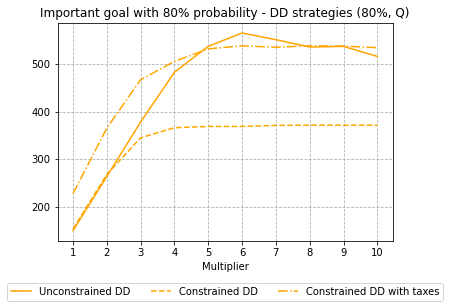

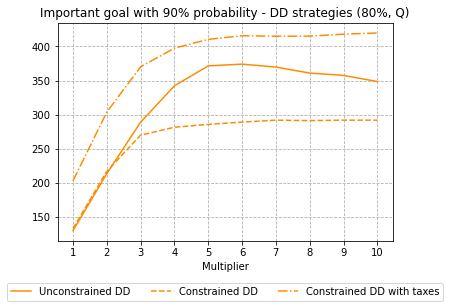

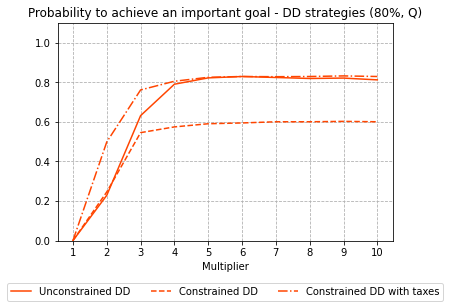

In [89]:
legend = ['Unconstrained DD', 'Constrained DD', 'Constrained DD with taxes']
titles = ['Important goal with 80% probability - DD strategies (80%, Q)', 
          'Important goal with 90% probability - DD strategies (80%, Q)',
         'Probability to achieve an important goal - DD strategies (80%, Q)']
colors = ['orange', 'darkorange', 'orangered']
statuses = [1, 2, 3]

for color, title, status in zip(colors, titles, statuses):
    fun.plot(stats_table_dd_q, stats_table_dd_q_c, stats_table_dd_q_ct, color, title, legend, status)

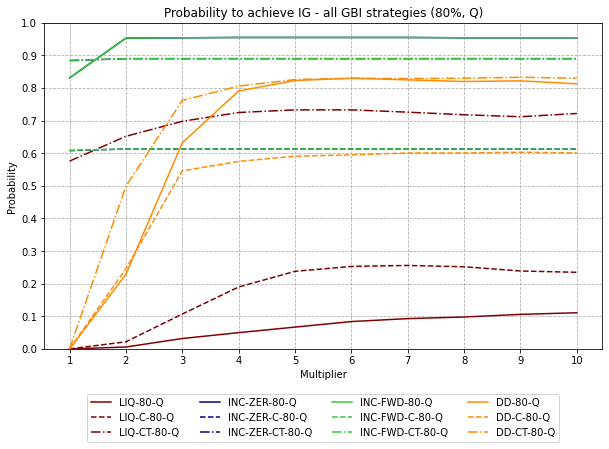

In [90]:
n = -3

plt.figure(figsize=(10, 6))
plt.title('Probability to achieve IG - all GBI strategies (80%, Q)')
plt.xlabel('Multiplier')
plt.ylabel('Probability')
plt.grid(ls='--')
plt.plot(multipliers, stats_table_liq_q.iloc[n], color = 'maroon')
plt.plot(multipliers, stats_table_liq_q_c.iloc[n], color = 'maroon', ls='--')
plt.plot(multipliers, stats_table_liq_q_ct.iloc[n], color = 'maroon', ls='-.')
plt.plot(multipliers, stats_table_zer_q.iloc[n], color = 'darkblue')
plt.plot(multipliers, stats_table_zer_q_c.iloc[n], color = 'darkblue', ls='--')
plt.plot(multipliers, stats_table_zer_q_ct.iloc[n], color = 'darkblue', ls='-.')
plt.plot(multipliers, stats_table_fwd_q.iloc[n], color = 'limegreen')
plt.plot(multipliers, stats_table_fwd_q_c.iloc[n], color = 'limegreen', ls='--')
plt.plot(multipliers, stats_table_fwd_q_ct.iloc[n], color = 'limegreen', ls='-.')
plt.plot(multipliers, stats_table_dd_q.iloc[n], color = 'darkorange')
plt.plot(multipliers, stats_table_dd_q_c.iloc[n], color = 'darkorange', ls='--')
plt.plot(multipliers, stats_table_dd_q_ct.iloc[n], color = 'darkorange', ls='-.')
legend = ['LIQ-80-Q', 'LIQ-C-80-Q', 'LIQ-CT-80-Q', 
          'INC-ZER-80-Q', 'INC-ZER-C-80-Q', 'INC-ZER-CT-80-Q', 
          'INC-FWD-80-Q', 'INC-FWD-C-80-Q', 'INC-FWD-CT-80-Q',
          'DD-80-Q', 'DD-C-80-Q', 'DD-CT-80-Q']
plt.legend(legend, loc="lower center", bbox_to_anchor=(0.5, -0.3), ncol=4)
plt.xticks(multipliers)
probas = np.arange(0, 1.1, 0.1).tolist()
plt.yticks(probas)
plt.ylim(0, 1)
plt.show()

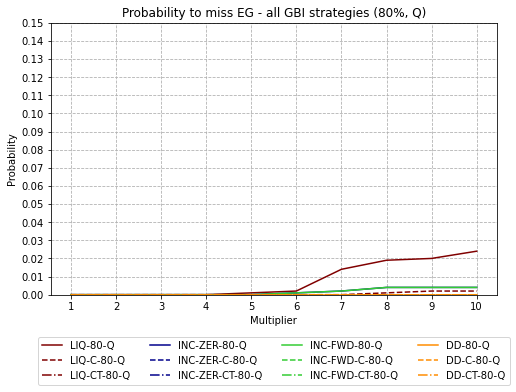

In [91]:
n = -8

plt.figure(figsize=(8, 5))
plt.title('Probability to miss EG - all GBI strategies (80%, Q)')
plt.xlabel('Multiplier')
plt.ylabel('Probability')
plt.grid(ls='--')
plt.plot(multipliers, stats_table_liq_q.iloc[n], color = 'maroon')
plt.plot(multipliers, stats_table_liq_q_c.iloc[n], color = 'maroon', ls='--')
plt.plot(multipliers, stats_table_liq_q_ct.iloc[n], color = 'maroon', ls='-.')
plt.plot(multipliers, stats_table_zer_q.iloc[n], color = 'darkblue')
plt.plot(multipliers, stats_table_zer_q_c.iloc[n], color = 'darkblue', ls='--')
plt.plot(multipliers, stats_table_zer_q_ct.iloc[n], color = 'darkblue', ls='-.')
plt.plot(multipliers, stats_table_fwd_q.iloc[n], color = 'limegreen')
plt.plot(multipliers, stats_table_fwd_q_c.iloc[n], color = 'limegreen', ls='--')
plt.plot(multipliers, stats_table_fwd_q_ct.iloc[n], color = 'limegreen', ls='-.')
plt.plot(multipliers, stats_table_dd_q.iloc[n], color = 'darkorange')
plt.plot(multipliers, stats_table_dd_q_c.iloc[n], color = 'darkorange', ls='--')
plt.plot(multipliers, stats_table_dd_q_ct.iloc[n], color = 'darkorange', ls='-.')
legend = ['LIQ-80-Q', 'LIQ-C-80-Q', 'LIQ-CT-80-Q', 
          'INC-ZER-80-Q', 'INC-ZER-C-80-Q', 'INC-ZER-CT-80-Q', 
          'INC-FWD-80-Q', 'INC-FWD-C-80-Q', 'INC-FWD-CT-80-Q',
          'DD-80-Q', 'DD-C-80-Q', 'DD-CT-80-Q']
plt.legend(legend, loc="lower center", bbox_to_anchor=(0.5, -0.35), ncol=4)
plt.xticks(multipliers)
probas = np.arange(0, 0.16, 0.01).tolist()
plt.yticks(probas)
plt.ylim(0, 0.15)
plt.show()

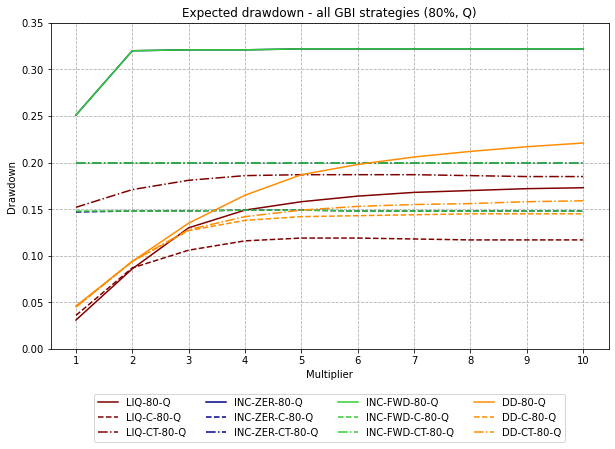

In [92]:
n = -5

plt.figure(figsize=(10, 6))
plt.title('Expected drawdown - all GBI strategies (80%, Q)')
plt.xlabel('Multiplier')
plt.ylabel('Drawdown')
plt.grid(ls='--')
plt.plot(multipliers, stats_table_liq_q.iloc[n], color = 'maroon')
plt.plot(multipliers, stats_table_liq_q_c.iloc[n], color = 'maroon', ls='--')
plt.plot(multipliers, stats_table_liq_q_ct.iloc[n], color = 'maroon', ls='-.')
plt.plot(multipliers, stats_table_zer_q.iloc[n], color = 'darkblue')
plt.plot(multipliers, stats_table_zer_q_c.iloc[n], color = 'darkblue', ls='--')
plt.plot(multipliers, stats_table_zer_q_ct.iloc[n], color = 'darkblue', ls='-.')
plt.plot(multipliers, stats_table_fwd_q.iloc[n], color = 'limegreen')
plt.plot(multipliers, stats_table_fwd_q_c.iloc[n], color = 'limegreen', ls='--')
plt.plot(multipliers, stats_table_fwd_q_ct.iloc[n], color = 'limegreen', ls='-.')
plt.plot(multipliers, stats_table_dd_q.iloc[n], color = 'darkorange')
plt.plot(multipliers, stats_table_dd_q_c.iloc[n], color = 'darkorange', ls='--')
plt.plot(multipliers, stats_table_dd_q_ct.iloc[n], color = 'darkorange', ls='-.')
legend = ['LIQ-80-Q', 'LIQ-C-80-Q', 'LIQ-CT-80-Q', 
          'INC-ZER-80-Q', 'INC-ZER-C-80-Q', 'INC-ZER-CT-80-Q', 
          'INC-FWD-80-Q', 'INC-FWD-C-80-Q', 'INC-FWD-CT-80-Q',
          'DD-80-Q', 'DD-C-80-Q', 'DD-CT-80-Q']
plt.legend(legend, loc="lower center", bbox_to_anchor=(0.5, -0.3), ncol=4)
plt.xticks(multipliers)
plt.ylim(0, 0.35)
plt.show()

## 4. Graphs (distritubuions and evolution of wealth)

LIQ strategies

In [93]:
multipliers_2 = [1, 3, 5, 7, 10]

Unconstrained LIQ

In [94]:
color = ['pink', 'crimson']

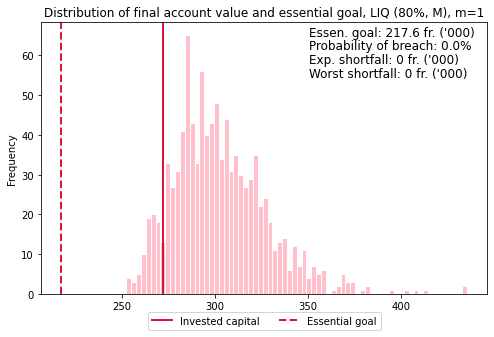

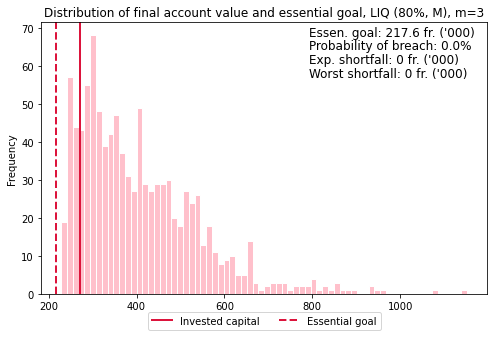

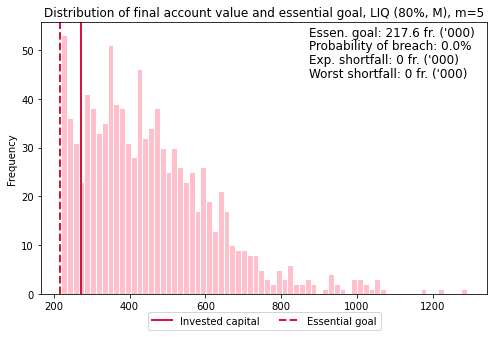

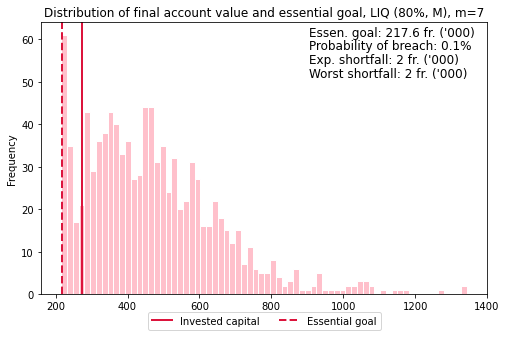

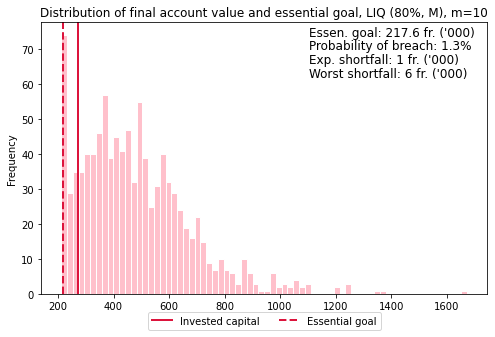

In [95]:
for m in multipliers_2:
    title = 'Distribution of final account value and essential goal, LIQ (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_liq, stats_table_liq, m, color, goal_zer, imp_goal, title, init_cap, ess=True)

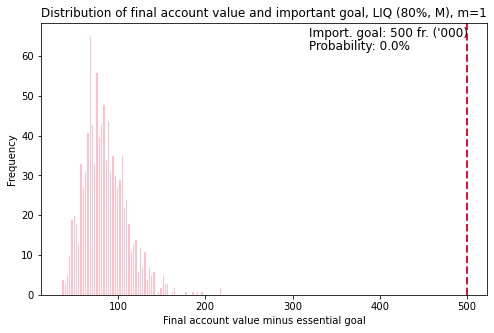

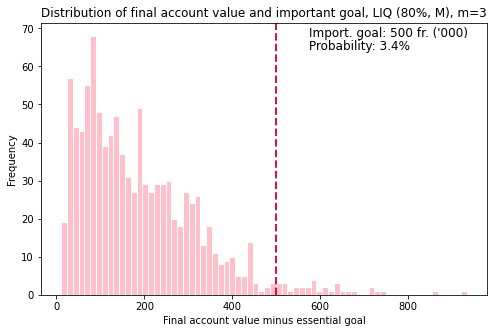

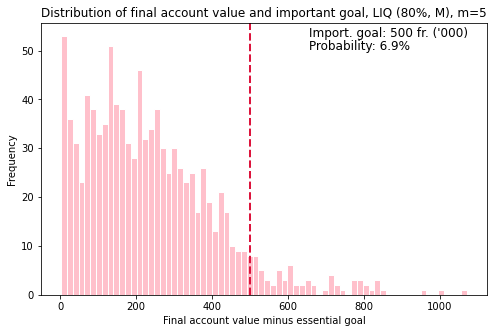

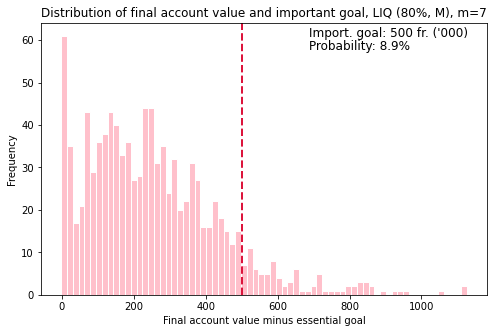

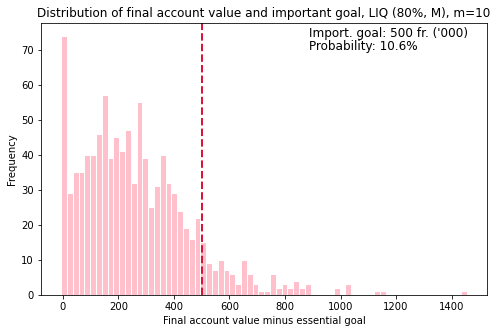

In [96]:
for m in multipliers_2:
    title = 'Distribution of final account value and important goal, LIQ (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_liq, stats_table_liq, m, color, goal_zer, imp_goal, title, init_cap, ess=False)

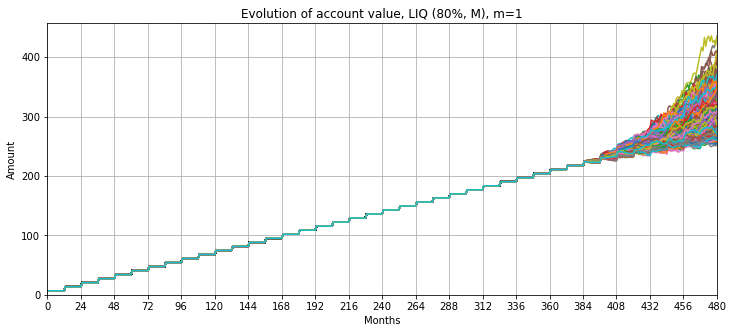

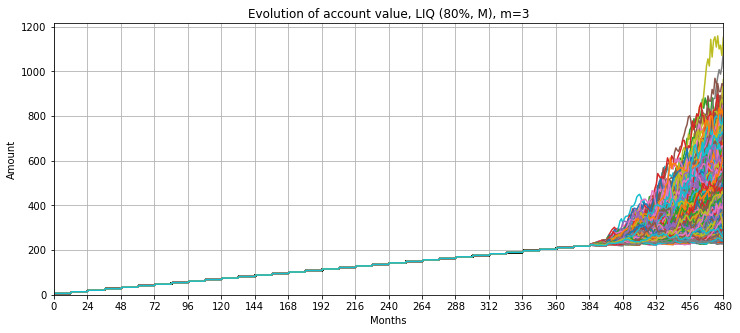

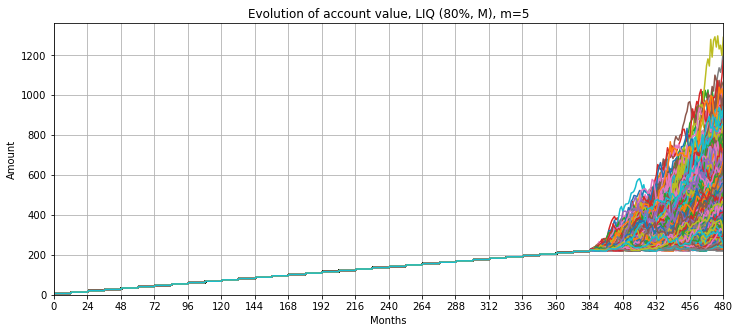

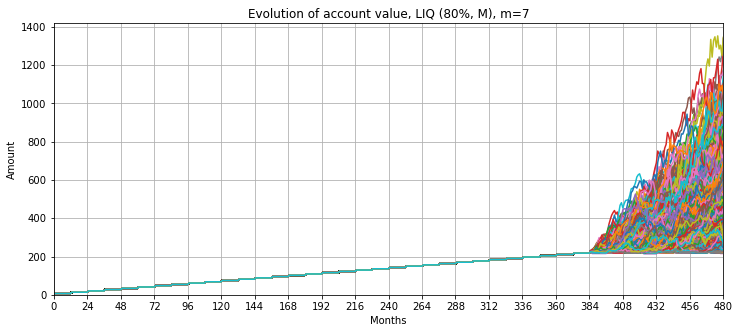

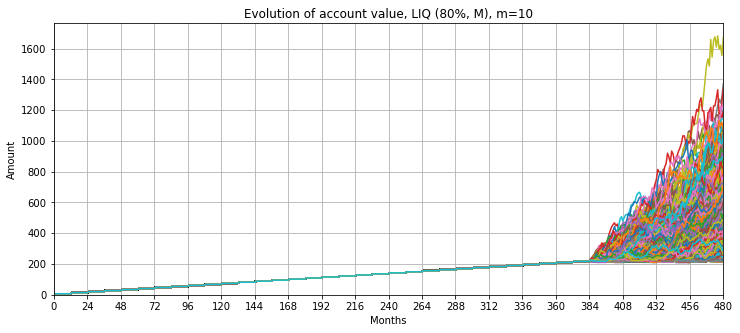

In [97]:
for m in multipliers_2:
    title = 'Evolution of account value, LIQ (80%, M), m=' + str(m)
    fun.plot_evolution(acc_value_liq, m, title) 

Constrained LIQ

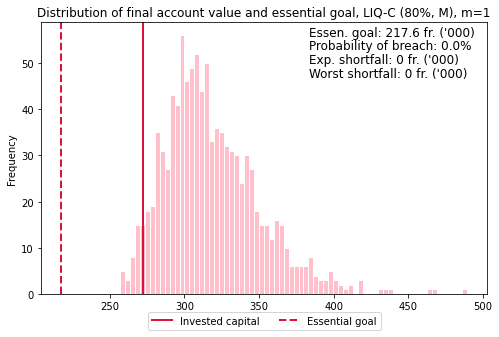

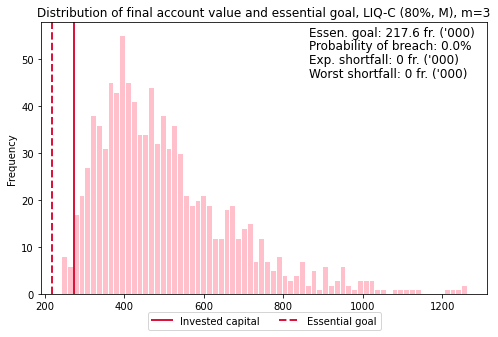

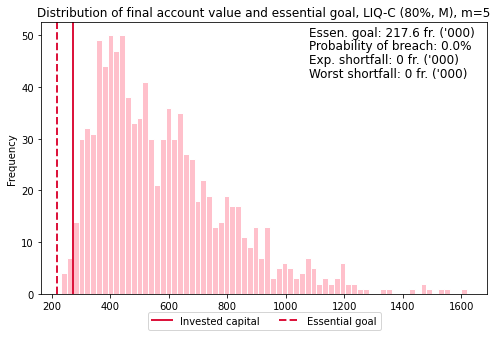

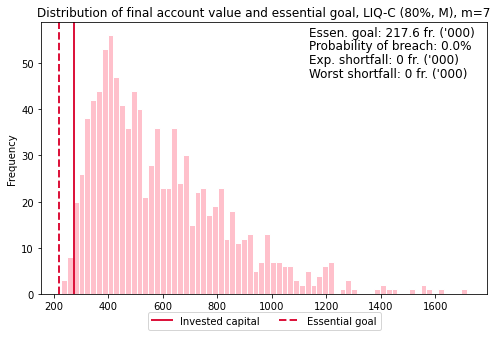

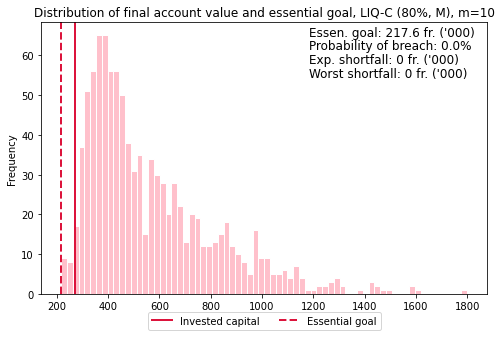

In [98]:
for m in multipliers_2:
    title = 'Distribution of final account value and essential goal, LIQ-C (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_liq_c, stats_table_liq_c, m, color, goal_zer, imp_goal, title, init_cap, ess=True)

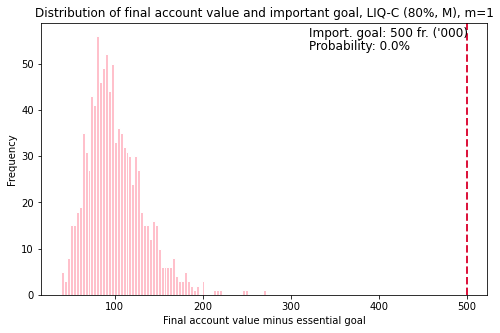

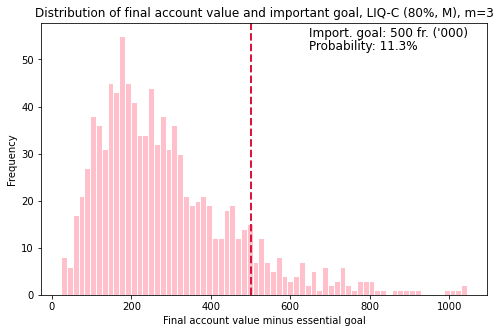

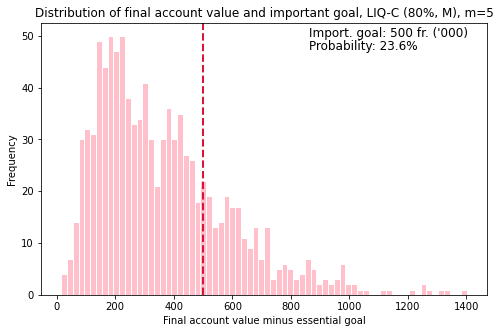

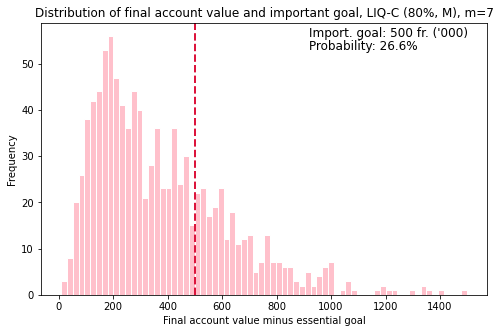

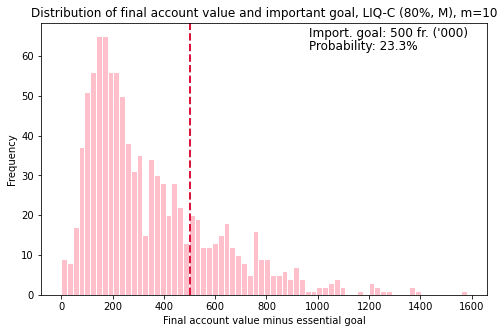

In [99]:
for m in multipliers_2:
    title = 'Distribution of final account value and important goal, LIQ-C (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_liq_c, stats_table_liq_c, m, color, goal_zer, imp_goal, title, init_cap, ess=False)

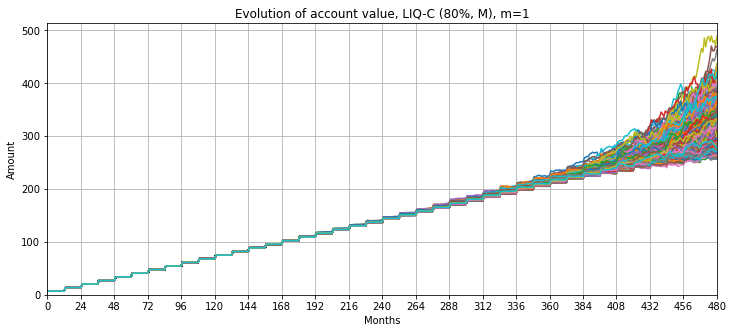

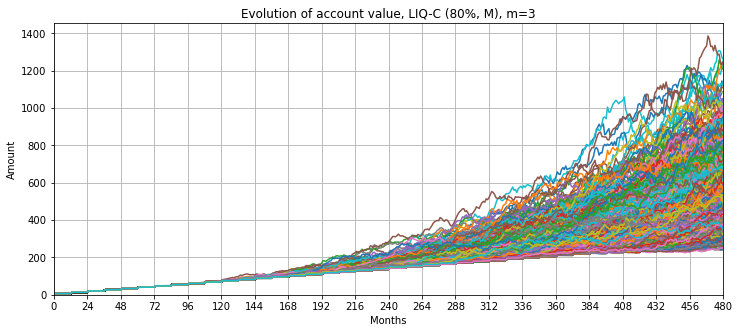

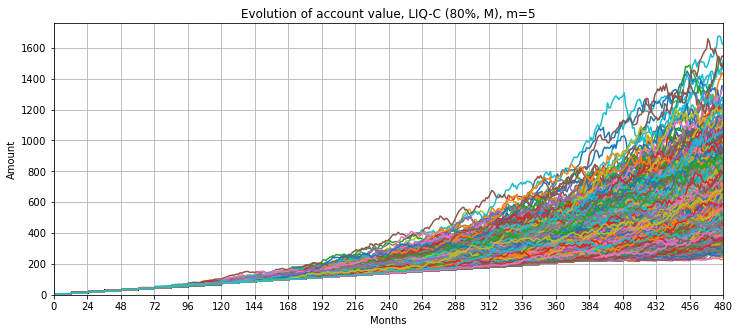

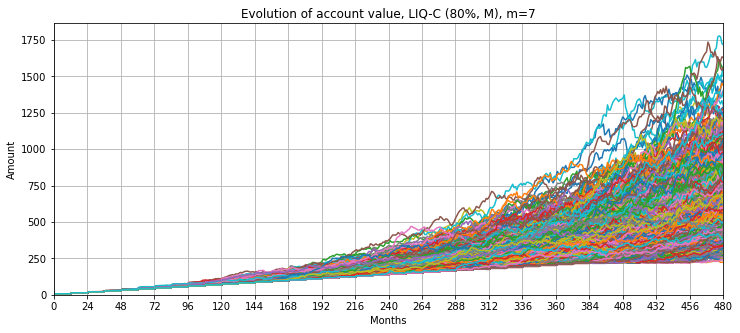

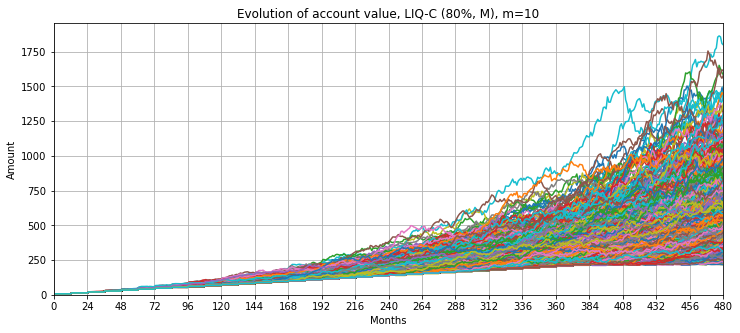

In [100]:
for m in multipliers_2:
    title = 'Evolution of account value, LIQ-C (80%, M), m=' + str(m)
    fun.plot_evolution(acc_value_liq_c, m, title) 

Constrained LIQ and saved taxes

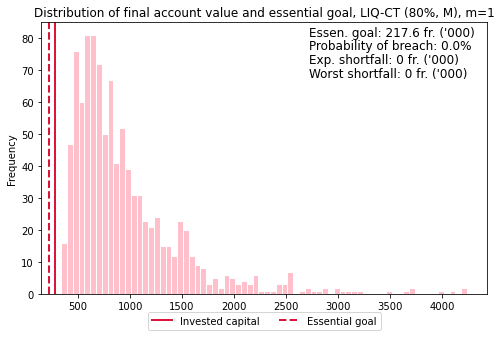

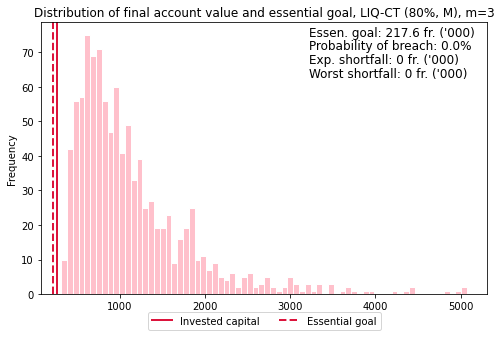

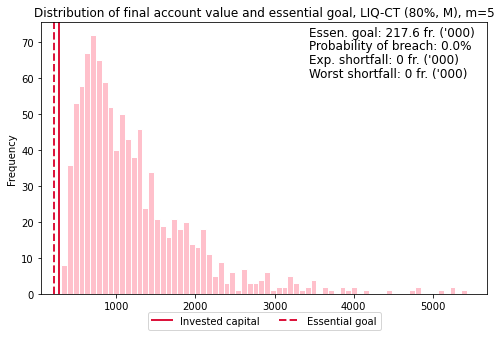

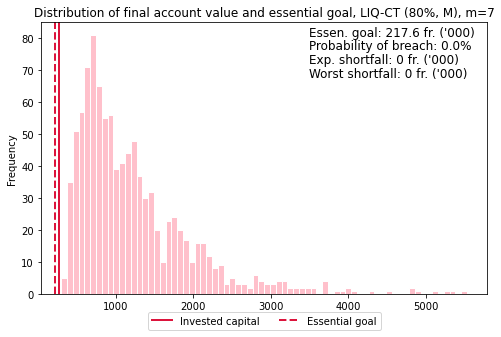

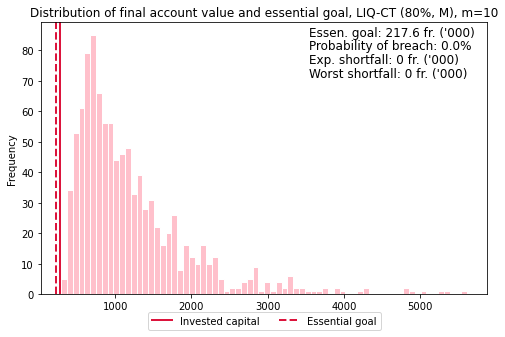

In [101]:
for m in multipliers_2:
    title = 'Distribution of final account value and essential goal, LIQ-CT (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_liq_ct, stats_table_liq_ct, m, color, goal_zer, imp_goal, title, init_cap, ess=True)

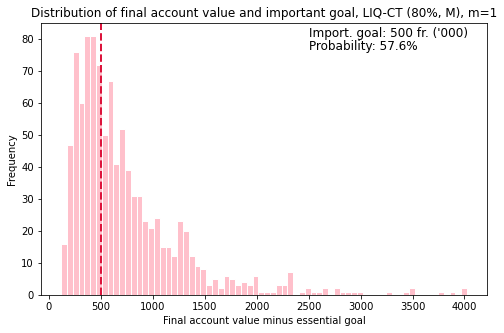

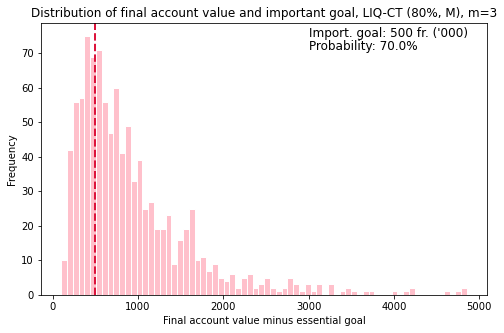

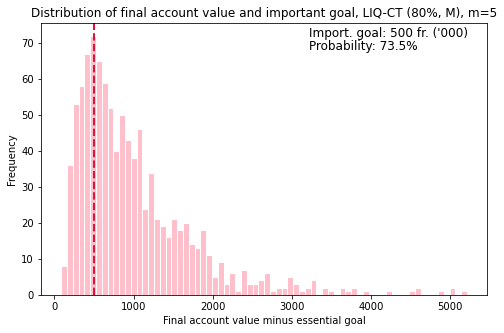

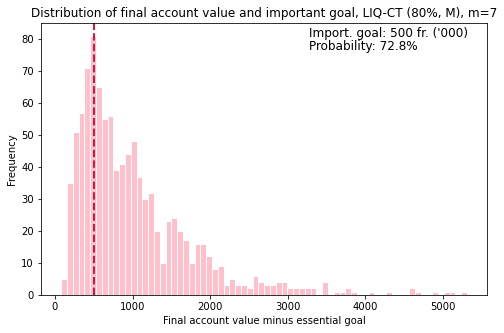

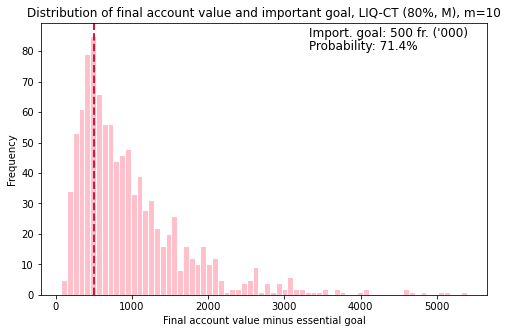

In [102]:
for m in multipliers_2:
    title = 'Distribution of final account value and important goal, LIQ-CT (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_liq_ct, stats_table_liq_ct, m, color, goal_zer, imp_goal, title, init_cap, ess=False)

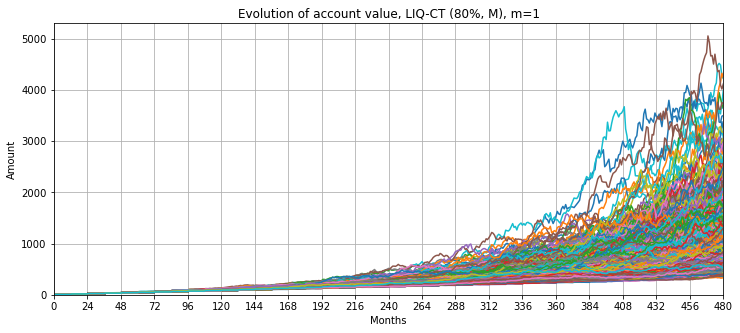

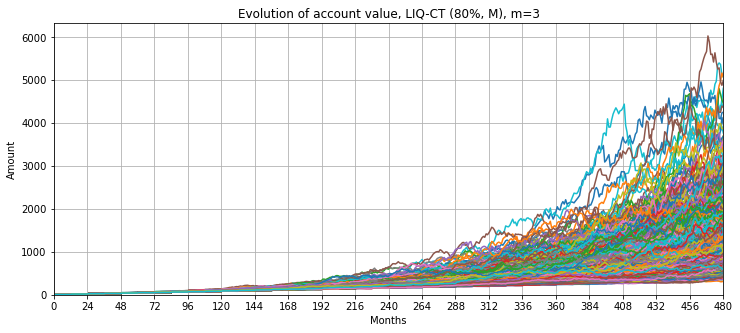

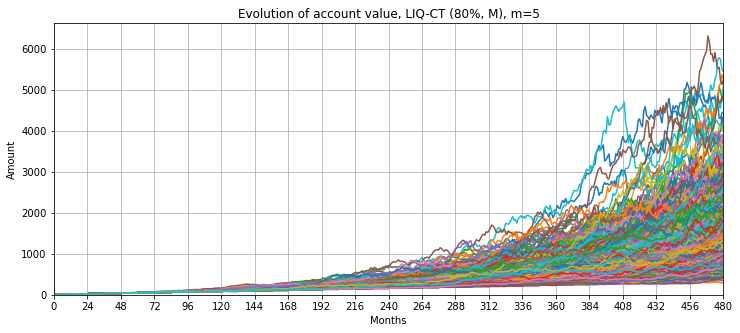

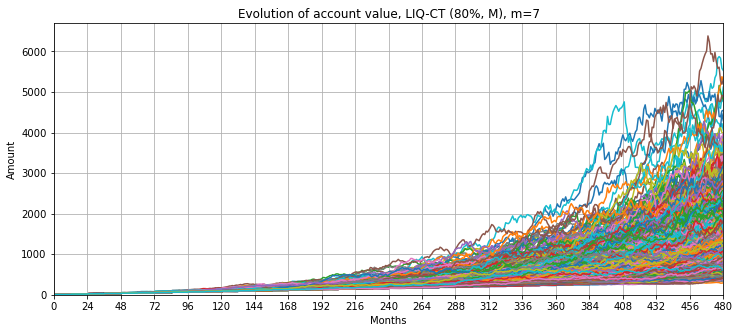

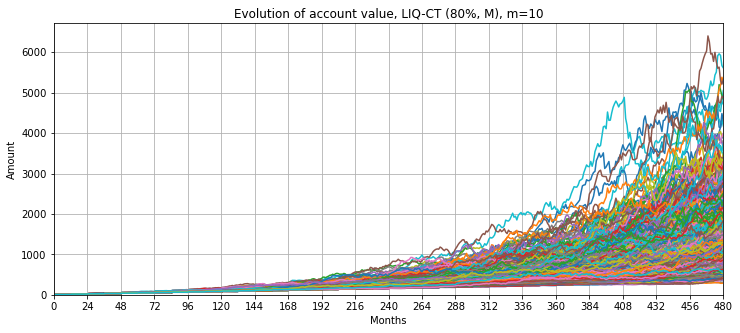

In [103]:
for m in multipliers_2:
    title = 'Evolution of account value, LIQ-CT (80%, M), m=' + str(m)
    fun.plot_evolution(acc_value_liq_ct, m, title)

INC-ZER strategies

Unconstrained INC-ZER

In [104]:
color = ['skyblue', 'b']

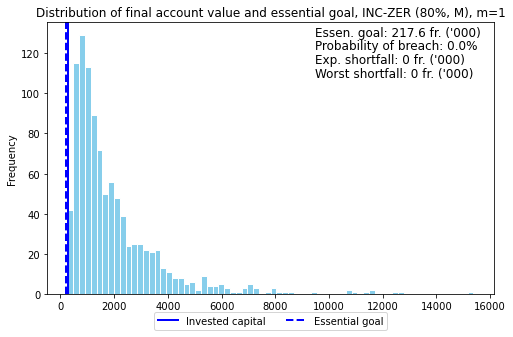

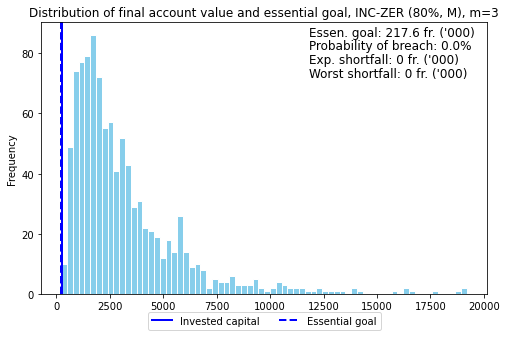

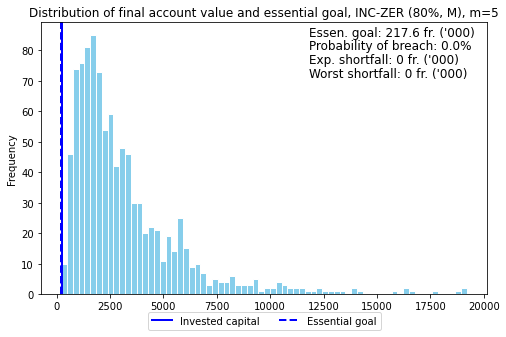

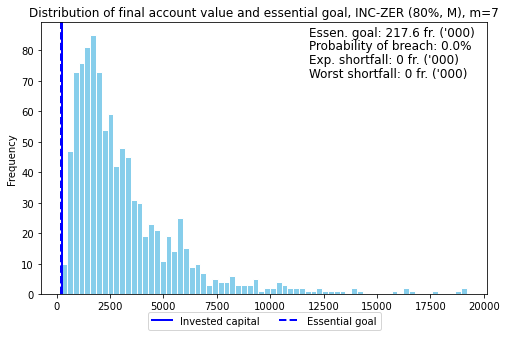

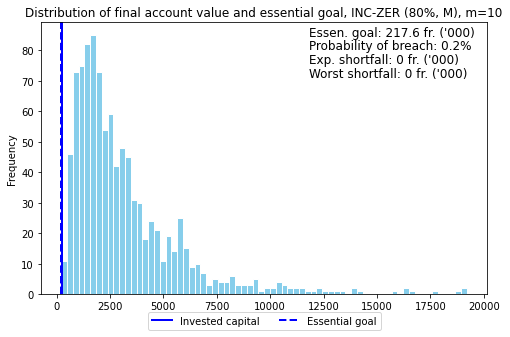

In [105]:
for m in multipliers_2:
    title = 'Distribution of final account value and essential goal, INC-ZER (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_zer, stats_table_zer, m, color, goal_zer, imp_goal, title, init_cap, ess=True)

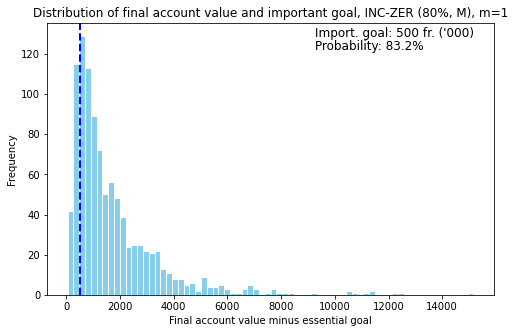

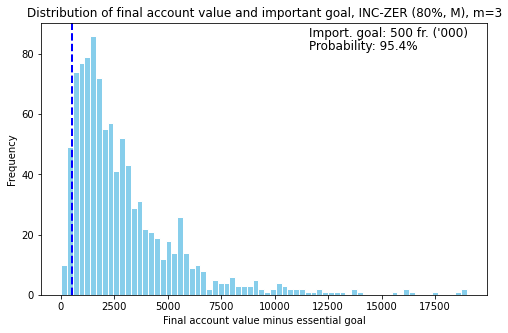

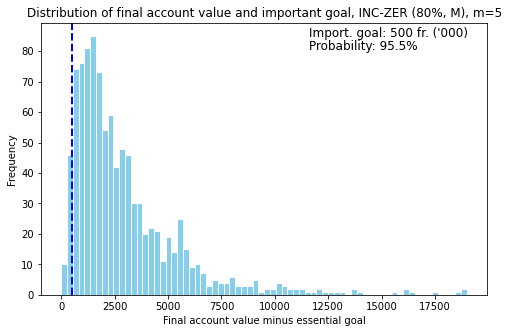

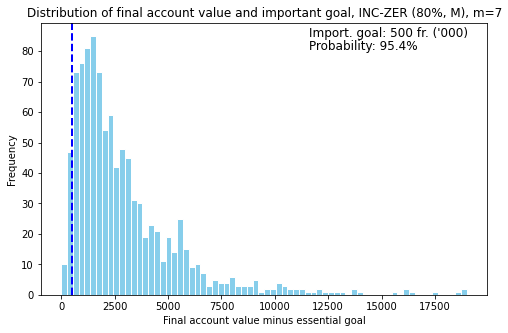

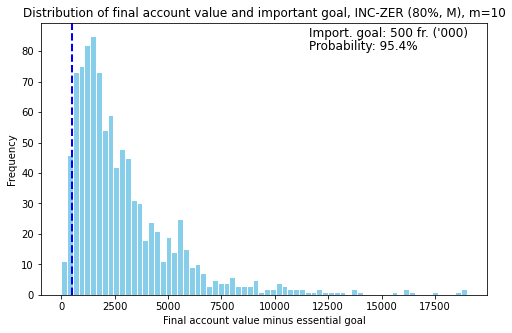

In [106]:
for m in multipliers_2:
    title = 'Distribution of final account value and important goal, INC-ZER (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_zer, stats_table_zer, m, color, goal_zer, imp_goal, title, init_cap, ess=False)

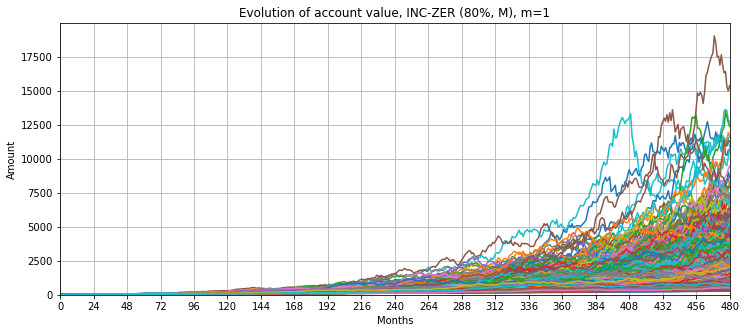

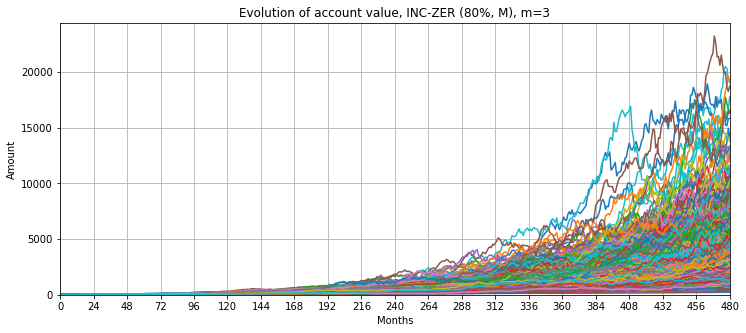

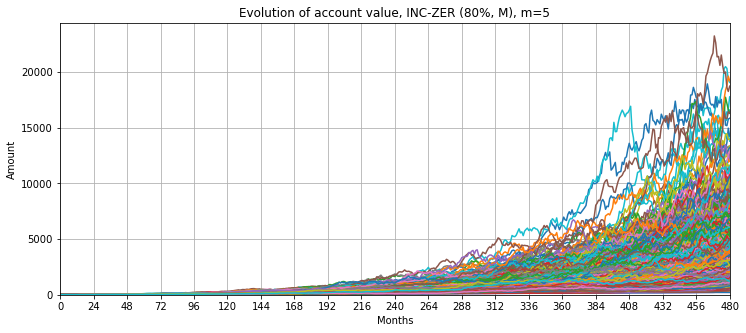

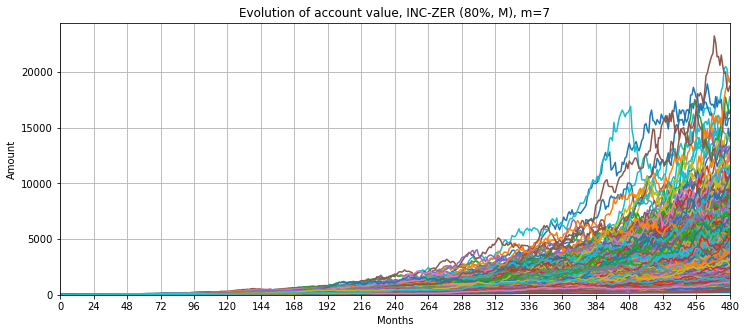

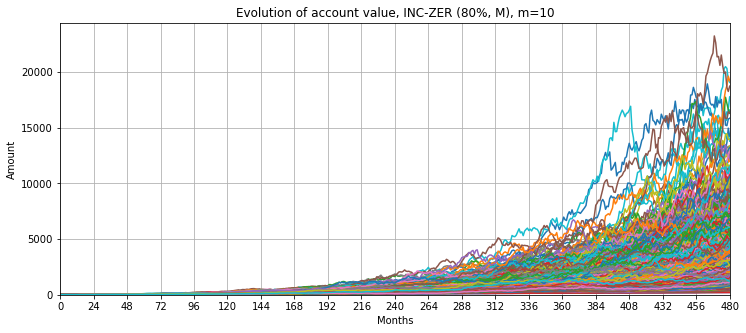

In [107]:
for m in multipliers_2:
    title = 'Evolution of account value, INC-ZER (80%, M), m=' + str(m)
    fun.plot_evolution(acc_value_zer, m, title)

Constrained INC-ZER

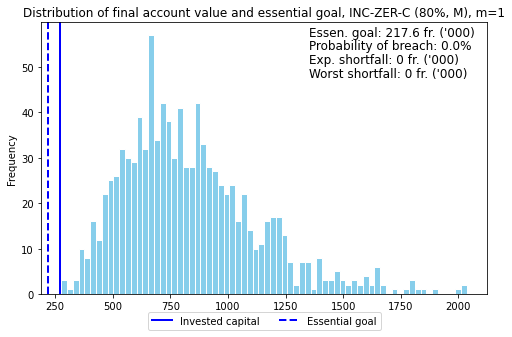

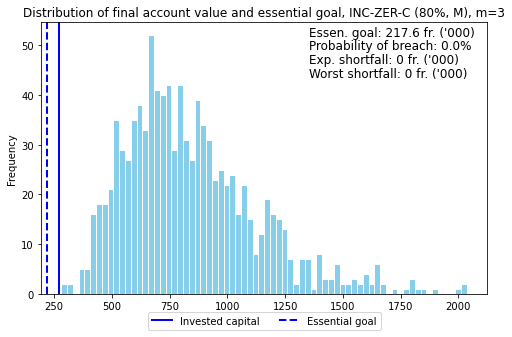

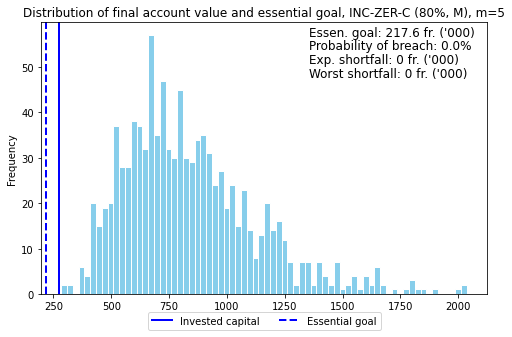

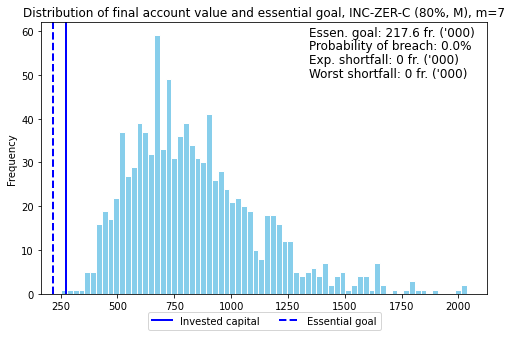

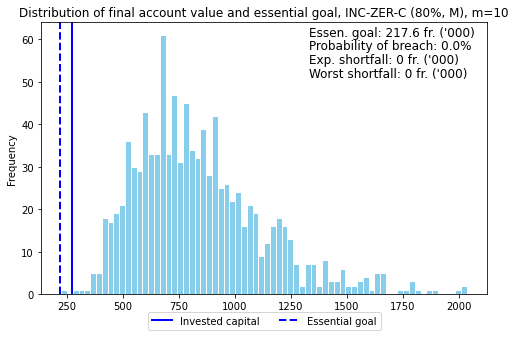

In [108]:
for m in multipliers_2:
    title = 'Distribution of final account value and essential goal, INC-ZER-C (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_zer_c, stats_table_zer_c, m, color, goal_zer, imp_goal, title, init_cap, ess=True)

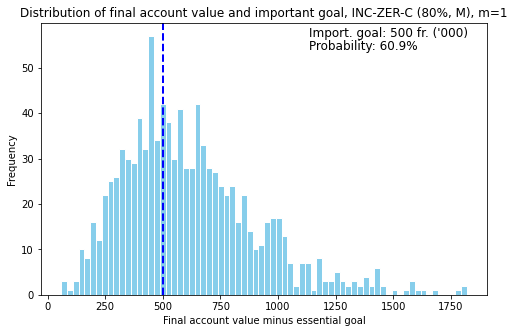

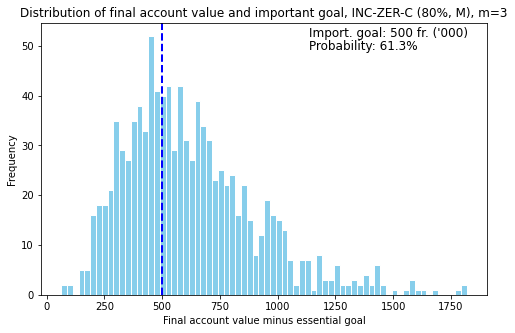

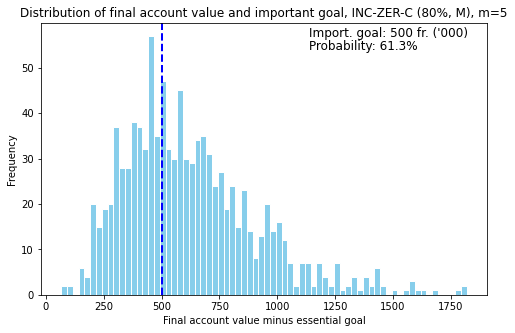

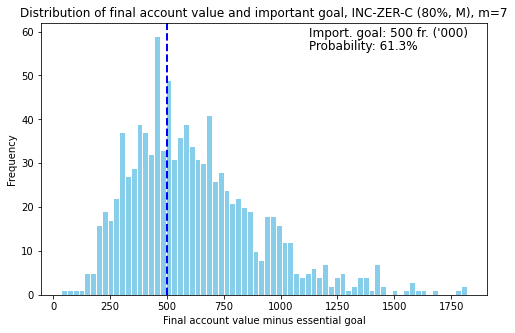

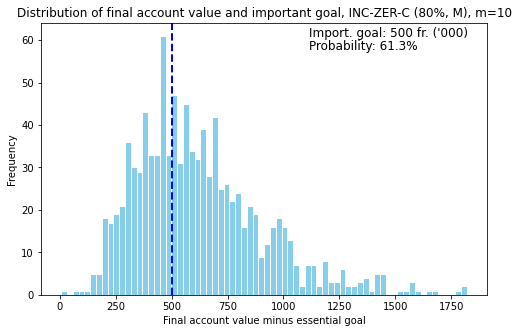

In [109]:
for m in multipliers_2:
    title = 'Distribution of final account value and important goal, INC-ZER-C (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_zer_c, stats_table_zer_c, m, color, goal_zer, imp_goal, title, init_cap, ess=False)

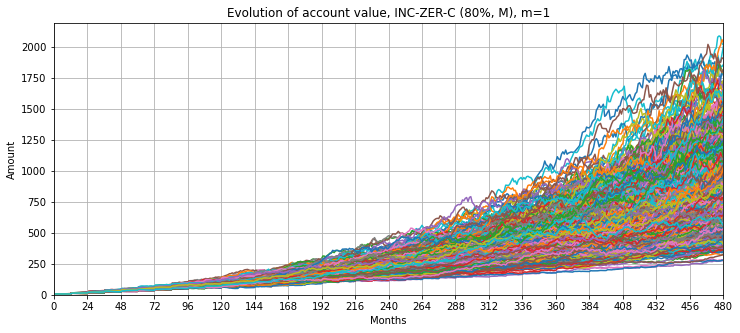

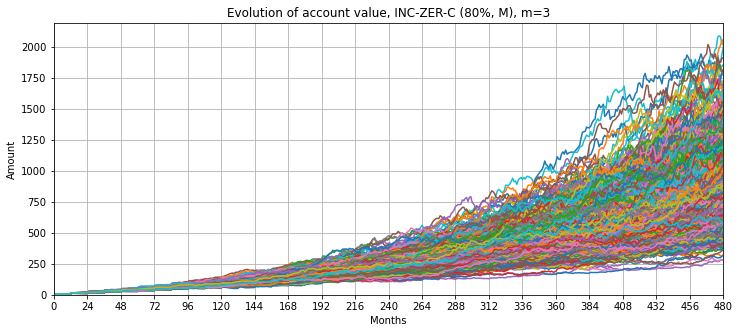

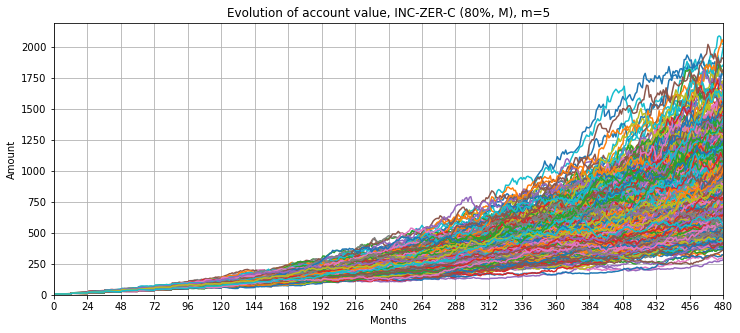

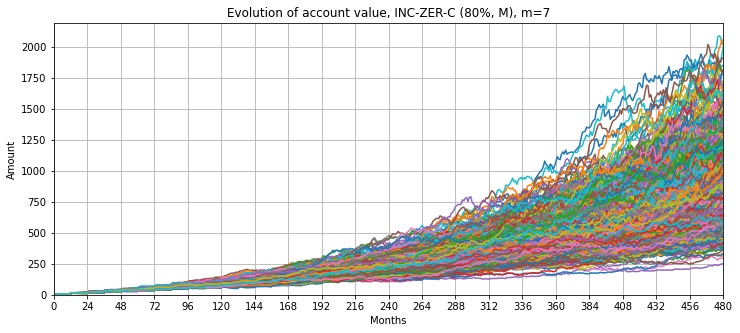

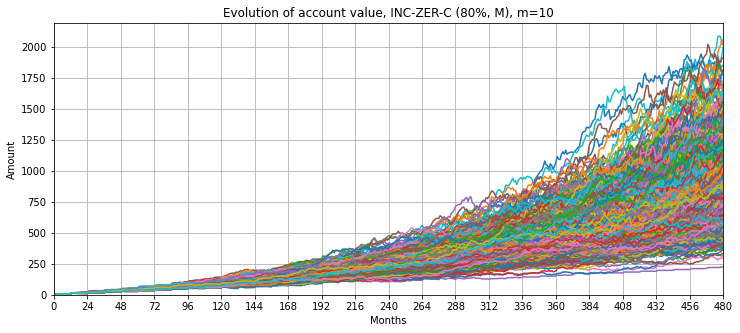

In [110]:
for m in multipliers_2:
    title = 'Evolution of account value, INC-ZER-C (80%, M), m=' + str(m)
    fun.plot_evolution(acc_value_zer_c, m, title)

Constrained INC-ZER and saved taxes

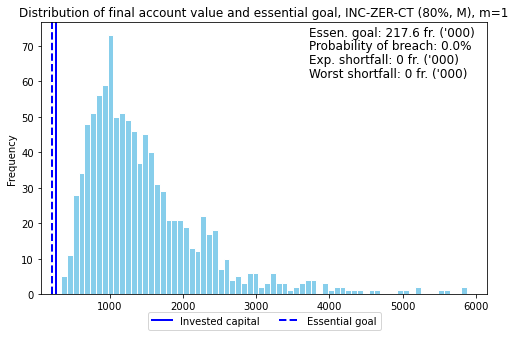

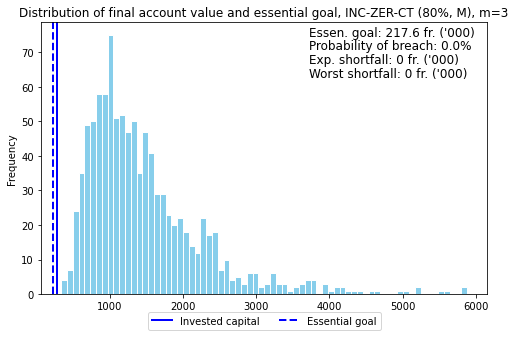

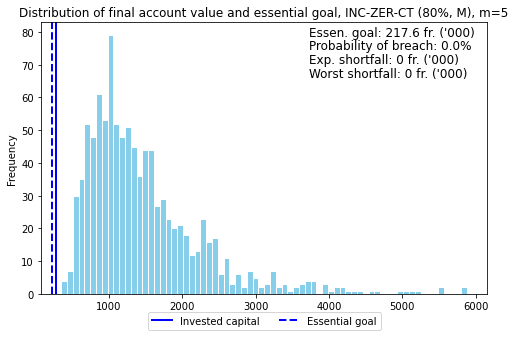

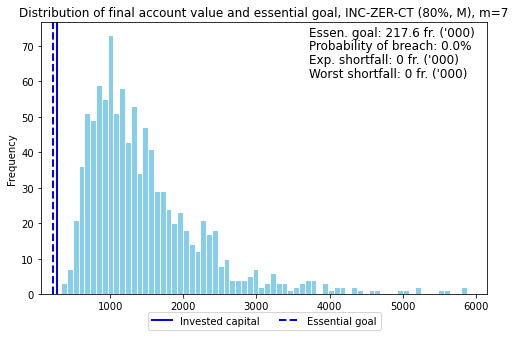

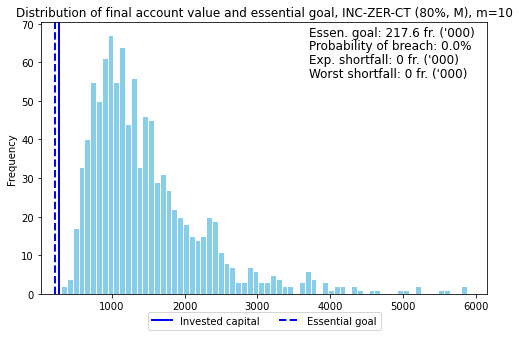

In [111]:
for m in multipliers_2:
    title = 'Distribution of final account value and essential goal, INC-ZER-CT (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_zer_ct, stats_table_zer_ct, m, color, goal_zer, imp_goal, title, init_cap, ess=True)

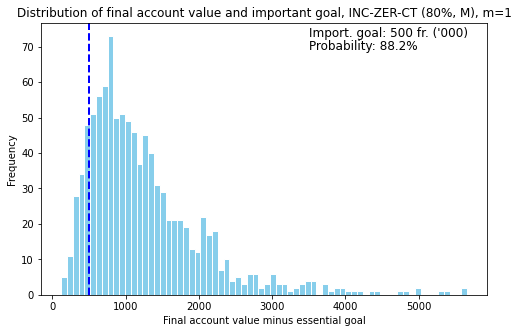

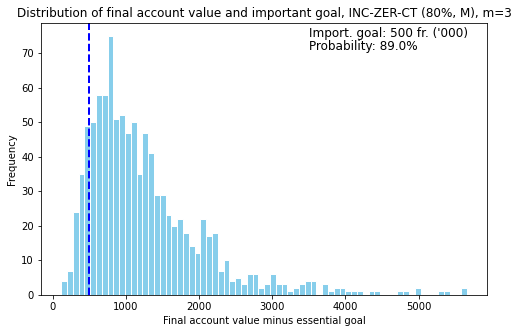

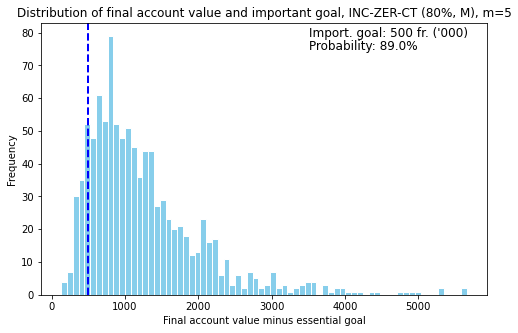

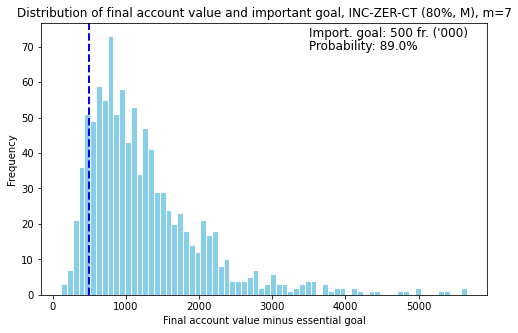

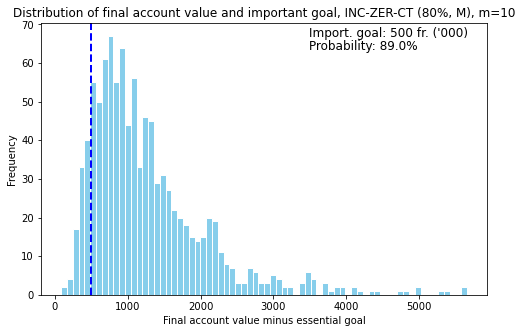

In [112]:
for m in multipliers_2:
    title = 'Distribution of final account value and important goal, INC-ZER-CT (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_zer_ct, stats_table_zer_ct, m, color, goal_zer, imp_goal, title, init_cap, ess=False)

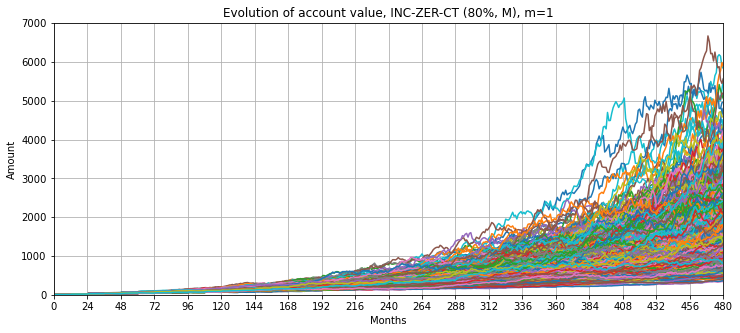

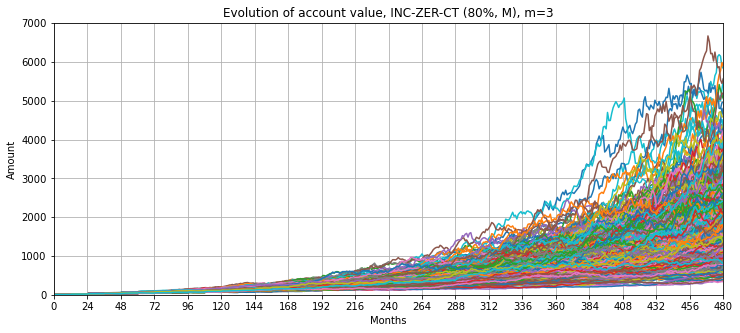

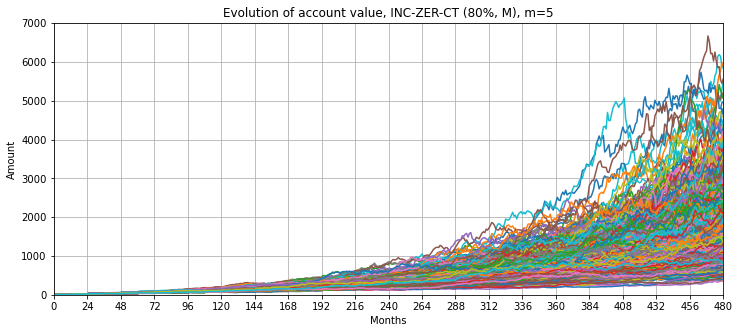

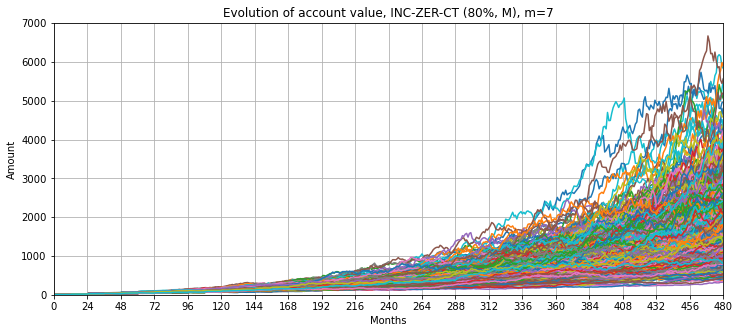

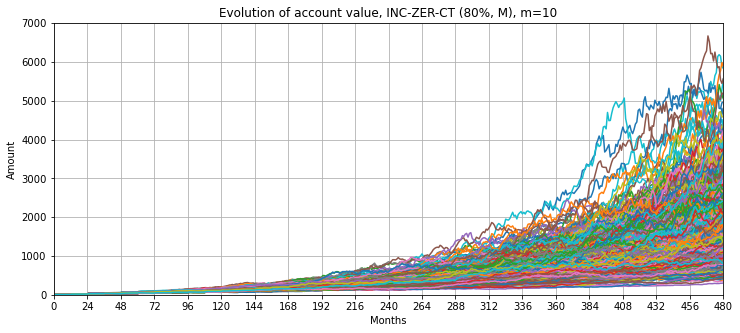

In [113]:
for m in multipliers_2:
    title = 'Evolution of account value, INC-ZER-CT (80%, M), m=' + str(m)
    fun.plot_evolution(acc_value_zer_ct, m, title)

Unconstrained INC-FWD

In [114]:
color = ['lightgreen', 'g']

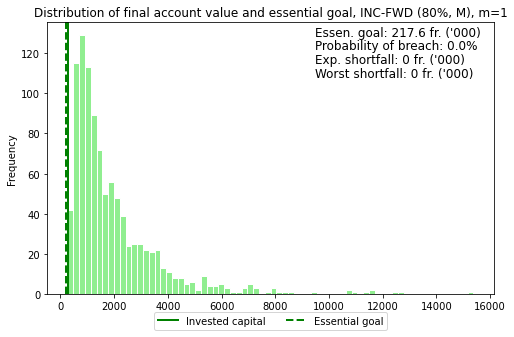

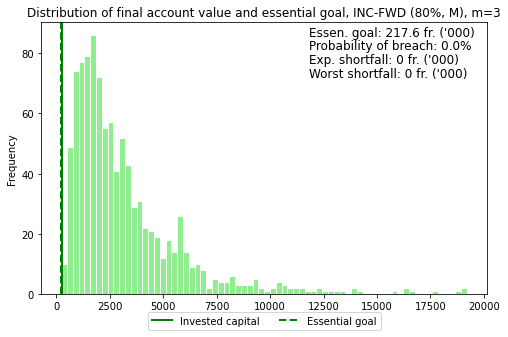

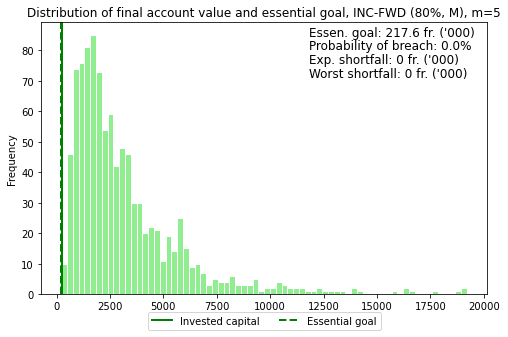

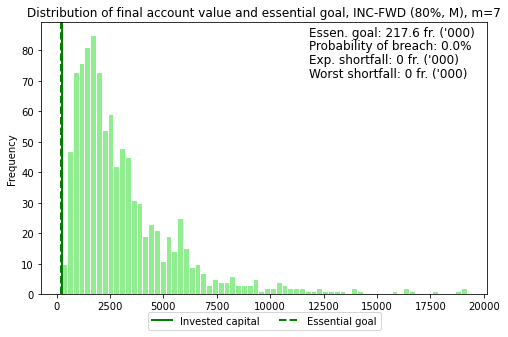

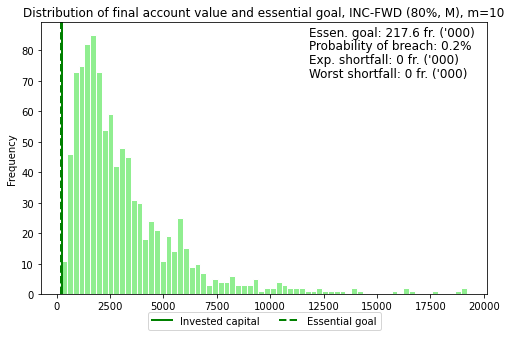

In [115]:
multipliers_2 = [1, 3, 5, 7, 10]
for m in multipliers_2:
    title = 'Distribution of final account value and essential goal, INC-FWD (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_fwd, stats_table_fwd, m, color, goal_zer, imp_goal, title, init_cap, ess=True) 

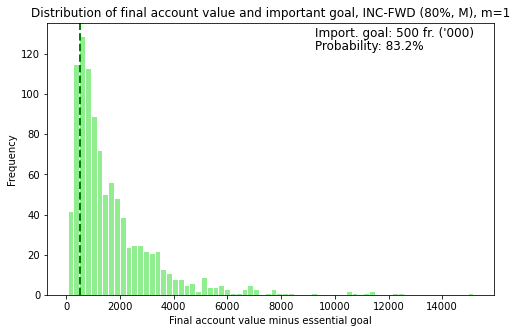

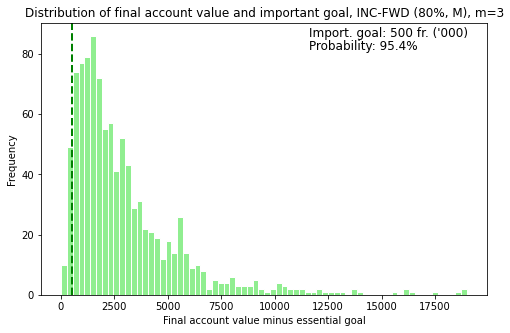

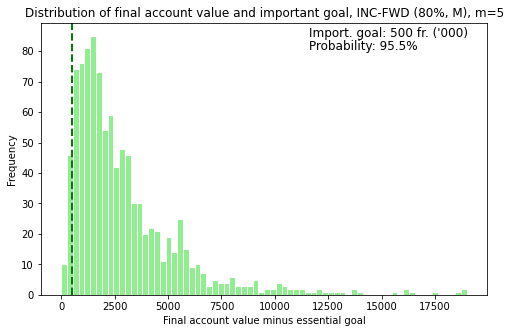

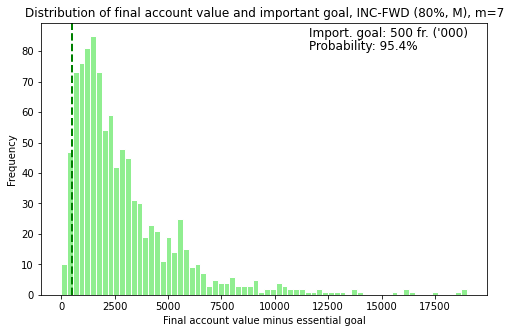

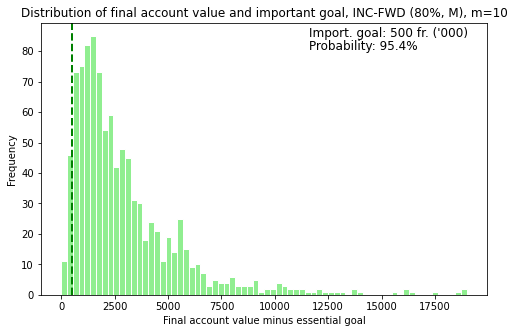

In [116]:
for m in multipliers_2:
    title = 'Distribution of final account value and important goal, INC-FWD (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_fwd, stats_table_fwd, m, color, goal_zer, imp_goal, title, init_cap, ess=False)

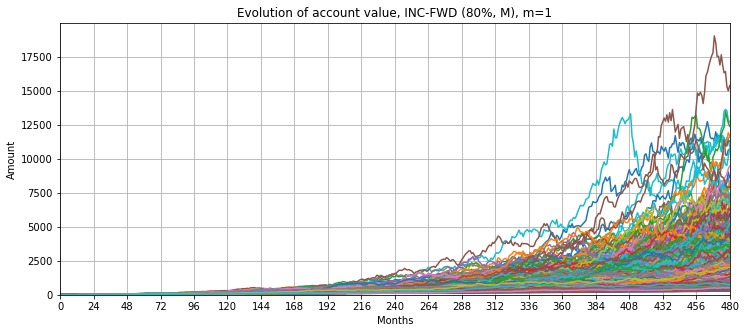

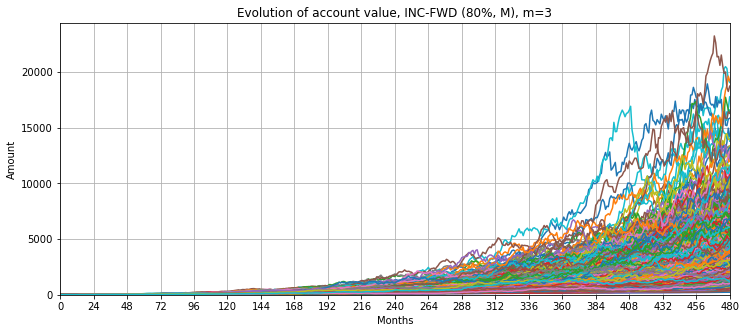

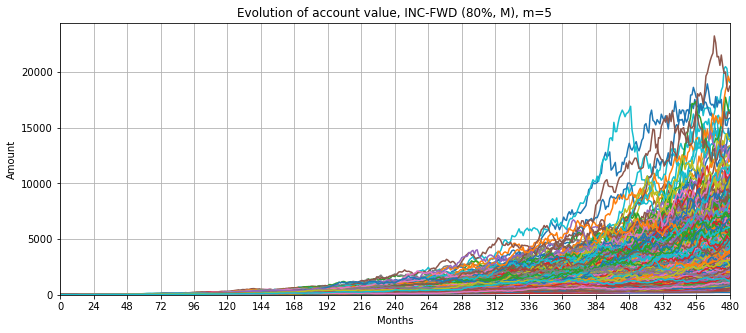

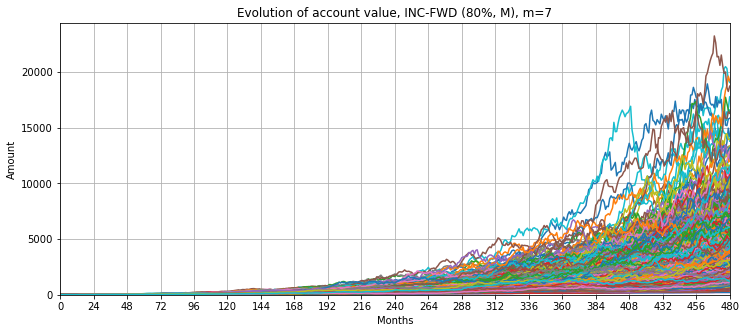

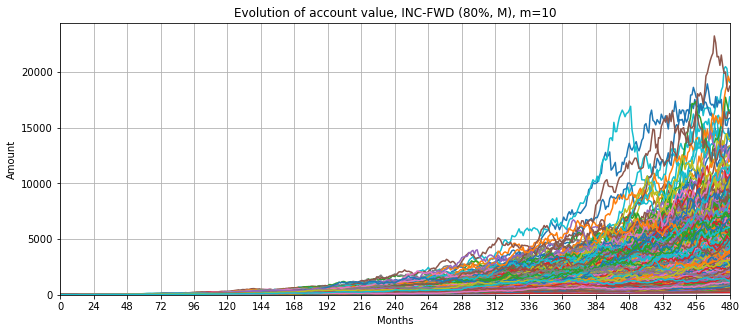

In [117]:
for m in multipliers_2:
    title = 'Evolution of account value, INC-FWD (80%, M), m=' + str(m)
    fun.plot_evolution(acc_value_fwd, m, title)

Constrained INC-FWD

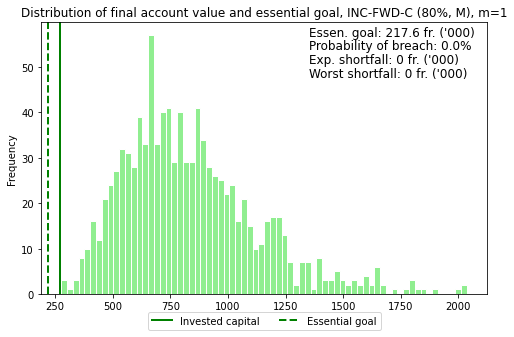

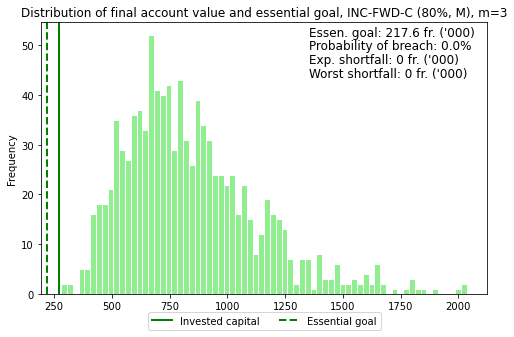

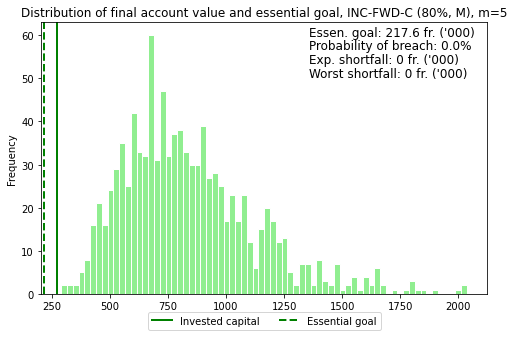

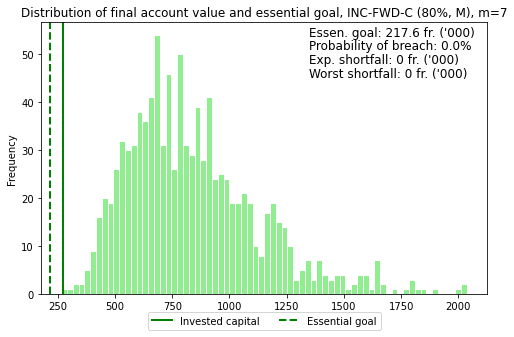

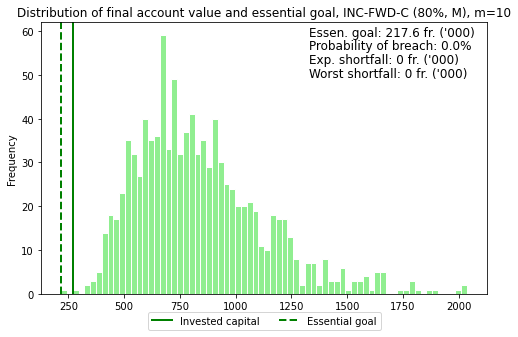

In [118]:
for m in multipliers_2:
    title = 'Distribution of final account value and essential goal, INC-FWD-C (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_fwd_c, stats_table_fwd_c, m, color, goal_zer, imp_goal, title, init_cap, ess=True)

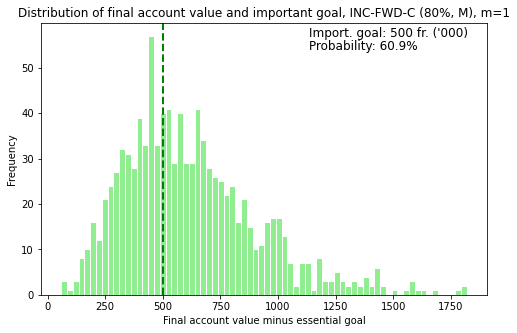

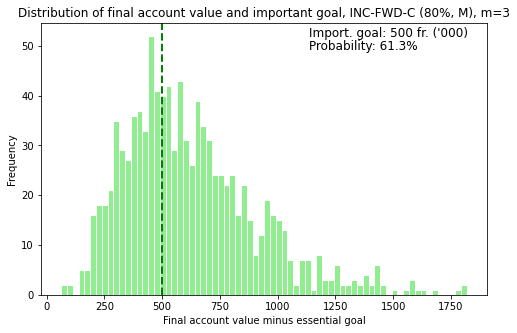

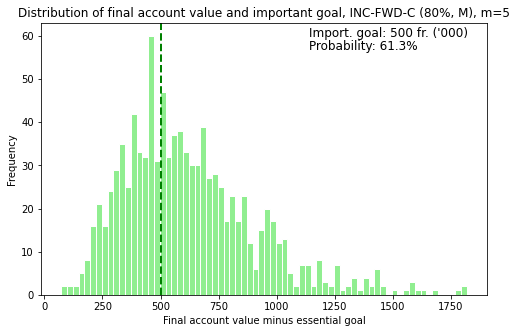

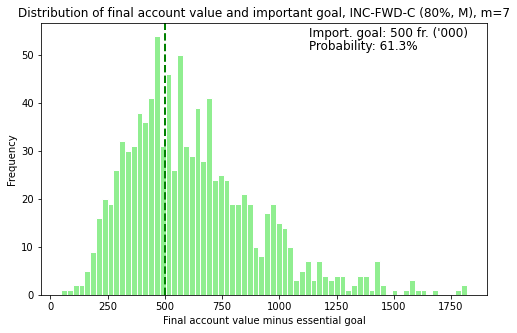

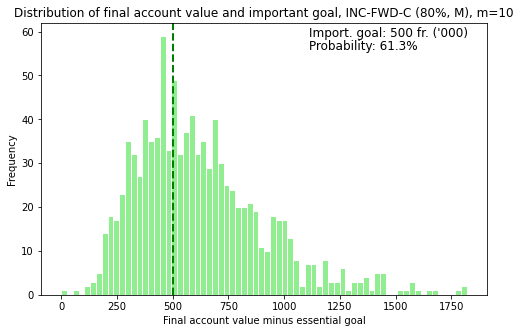

In [119]:
for m in multipliers_2:
    title = 'Distribution of final account value and important goal, INC-FWD-C (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_fwd_c, stats_table_fwd_c, m, color, goal_zer, imp_goal, title, init_cap, ess=False)

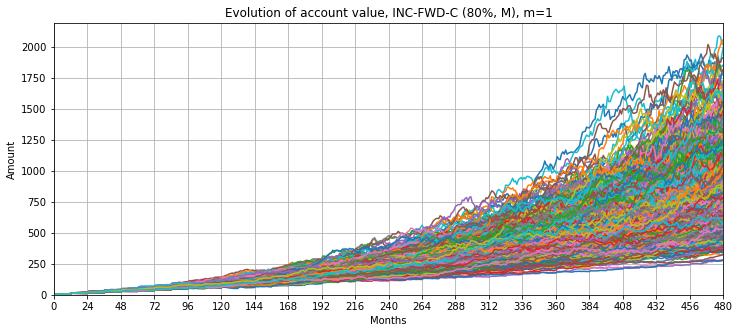

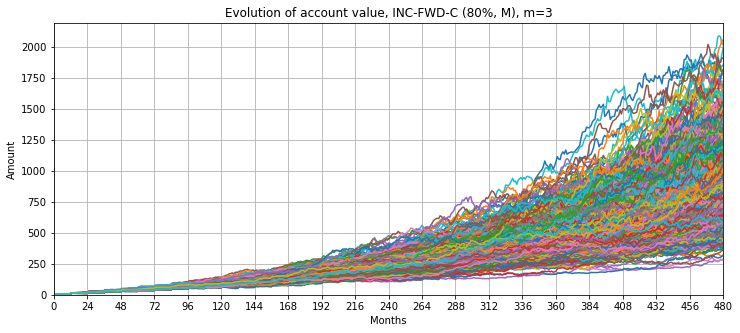

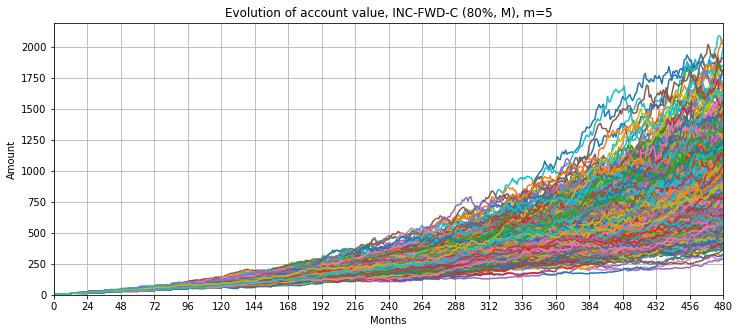

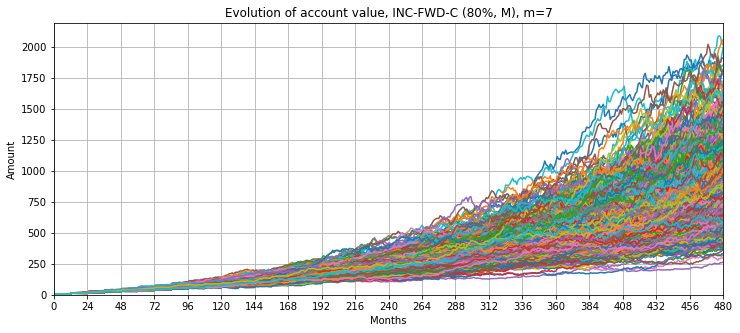

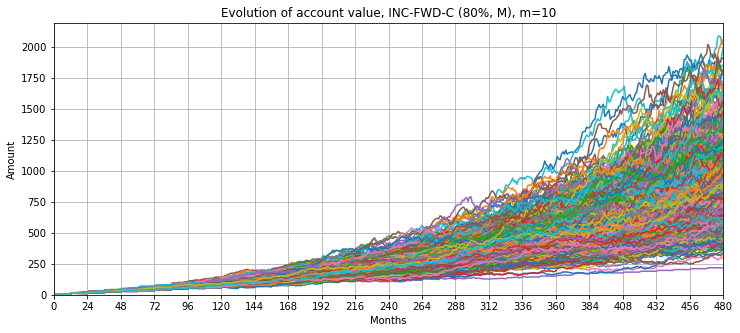

In [120]:
for m in multipliers_2:
    title = 'Evolution of account value, INC-FWD-C (80%, M), m=' + str(m)
    fun.plot_evolution(acc_value_fwd_c, m, title)

Constrained INC-FWD and saved taxes

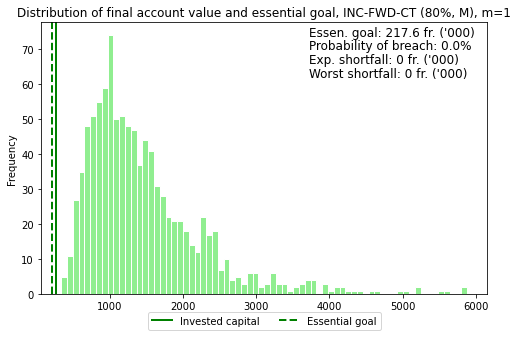

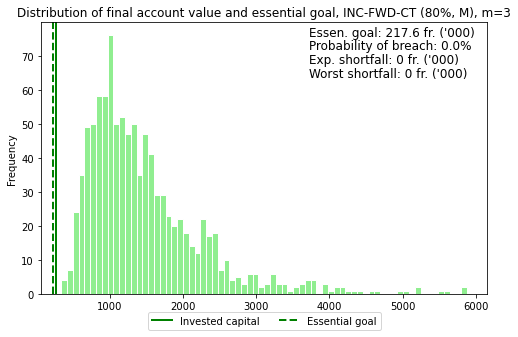

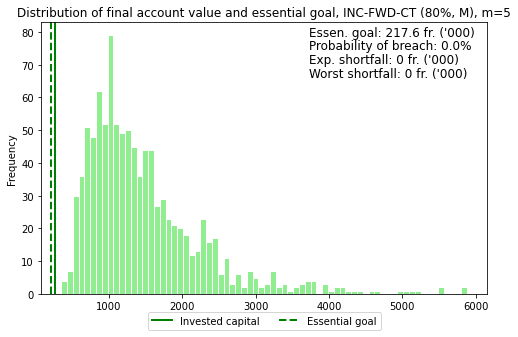

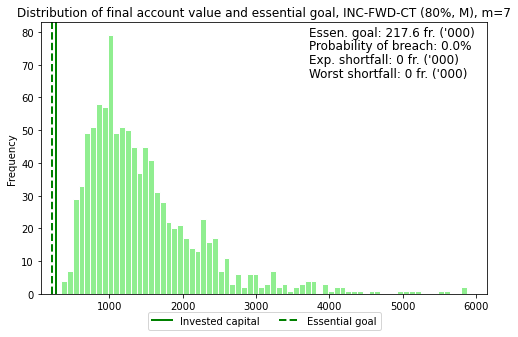

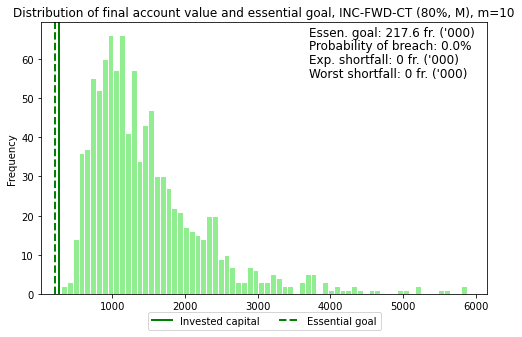

In [121]:
for m in multipliers_2:
    title = 'Distribution of final account value and essential goal, INC-FWD-CT (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_fwd_ct, stats_table_fwd_ct, m, color, goal_zer, imp_goal, title, init_cap, ess=True)

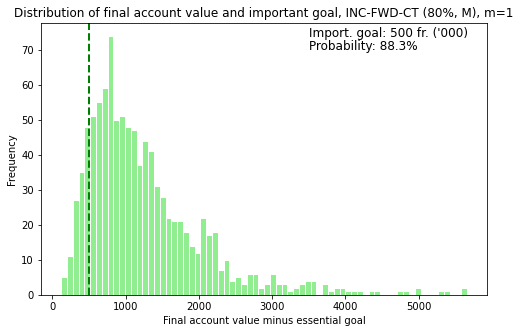

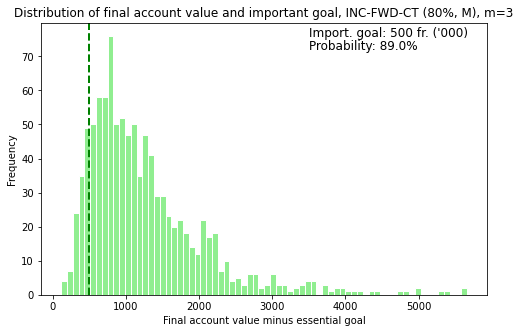

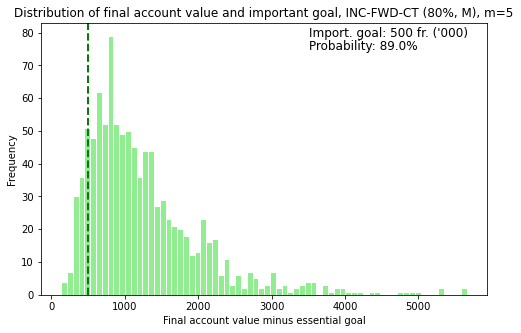

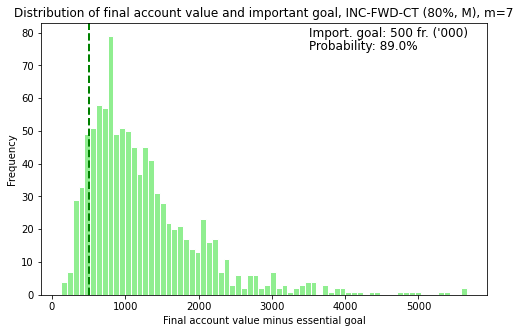

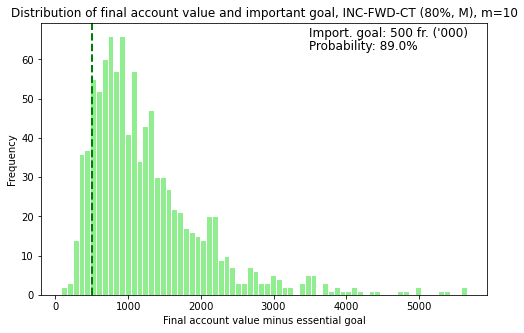

In [122]:
for m in multipliers_2:
    title = 'Distribution of final account value and important goal, INC-FWD-CT (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_fwd_ct, stats_table_fwd_ct, m, color, goal_zer, imp_goal, title, init_cap, ess=False)

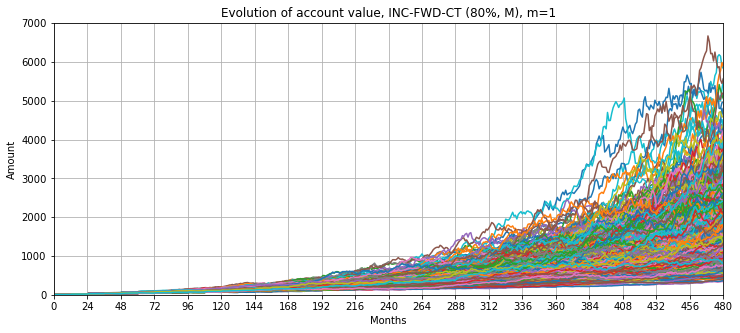

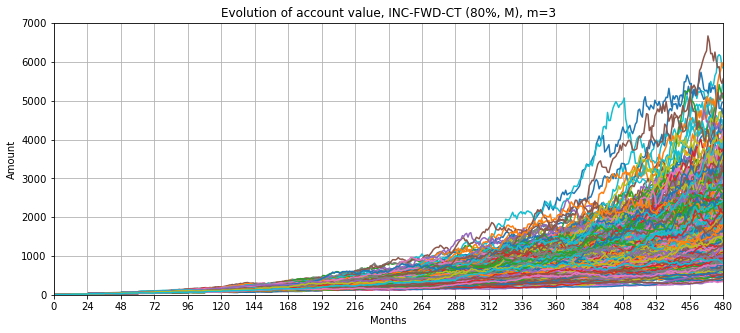

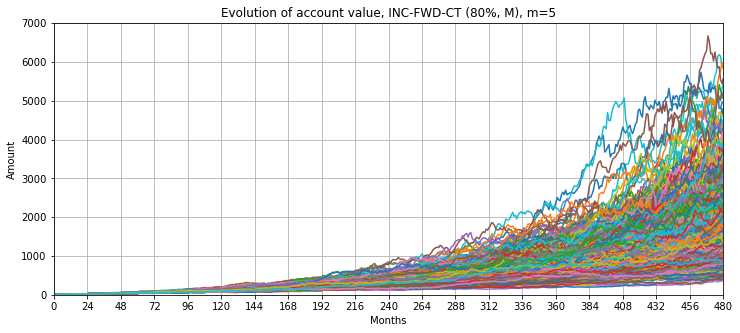

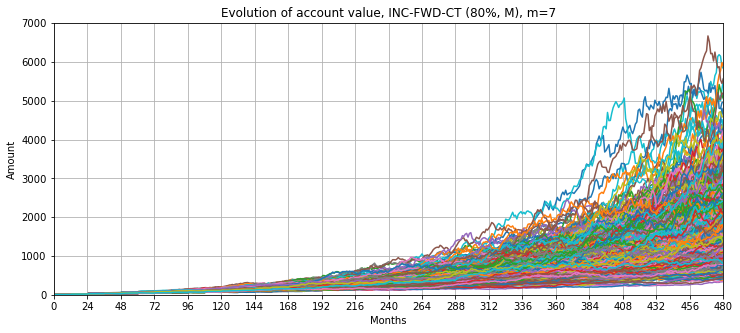

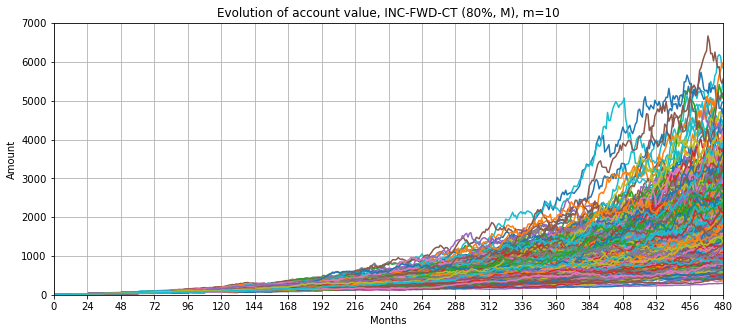

In [123]:
for m in multipliers_2:
    title = 'Evolution of account value, INC-FWD-CT (80%, M), m=' + str(m)
    fun.plot_evolution(acc_value_fwd_ct, m, title)

Unconstrained DD

In [124]:
color = ['moccasin', 'darkorange']

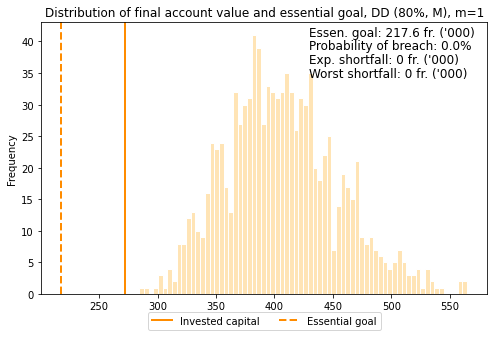

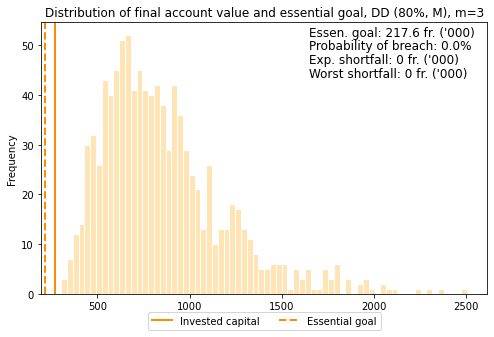

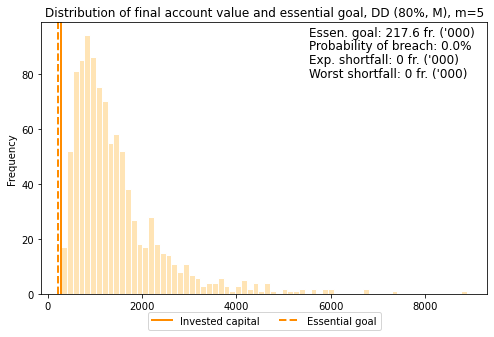

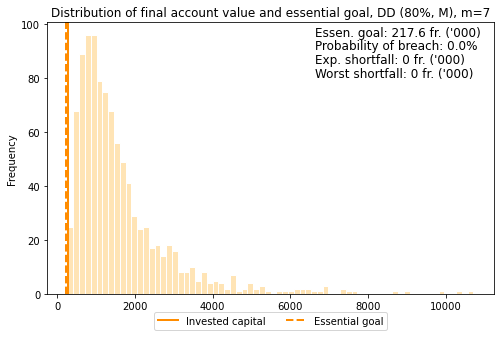

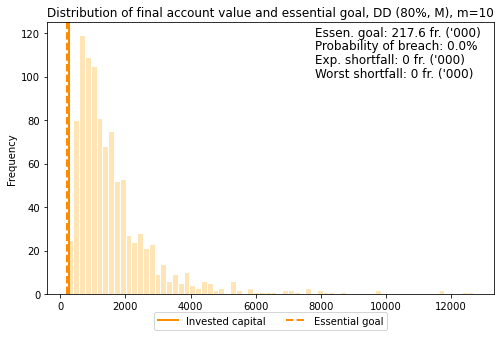

In [125]:
for m in multipliers_2:
    title = 'Distribution of final account value and essential goal, DD (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_dd, stats_table_dd, m, color, goal_zer, imp_goal, title, init_cap, ess=True)

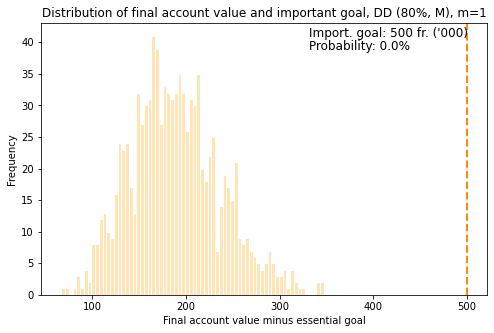

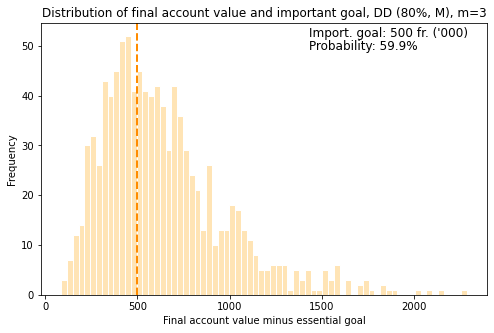

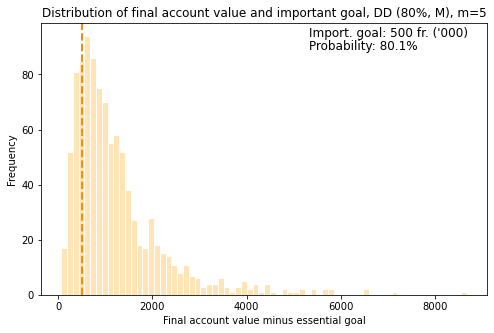

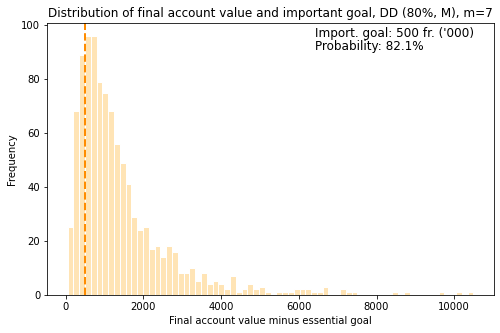

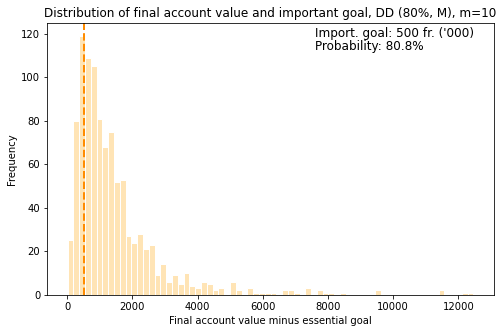

In [126]:
for m in multipliers_2:
    title = 'Distribution of final account value and important goal, DD (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_dd, stats_table_dd, m, color, goal_zer, imp_goal, title, init_cap, ess=False)

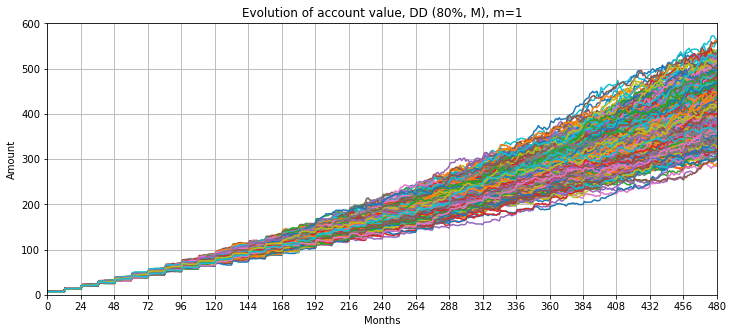

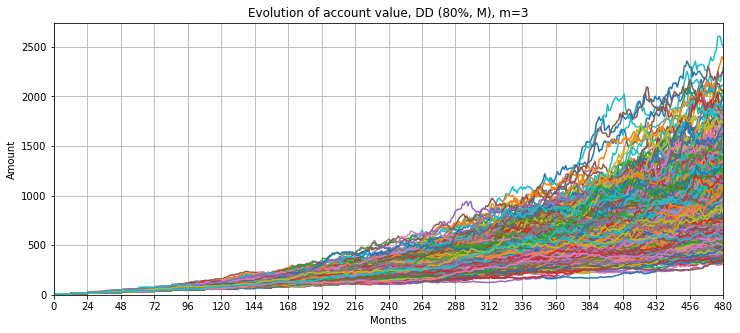

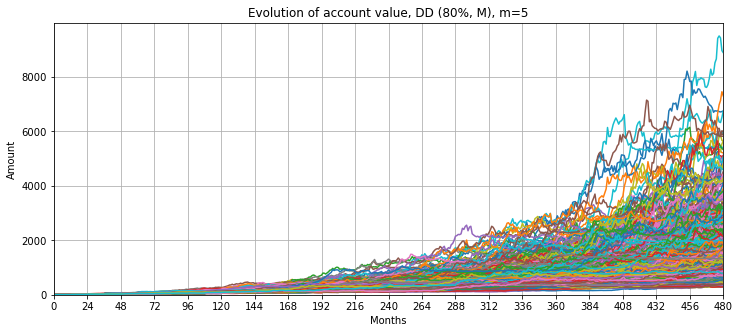

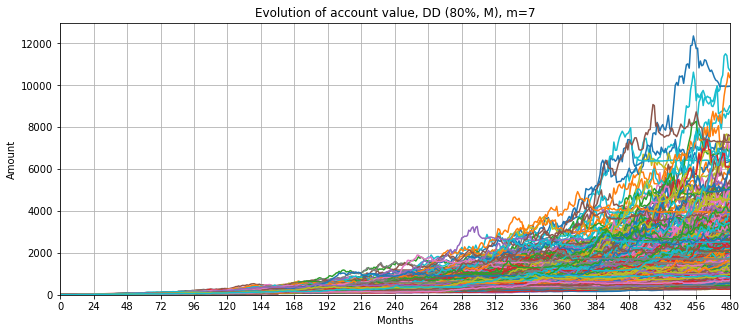

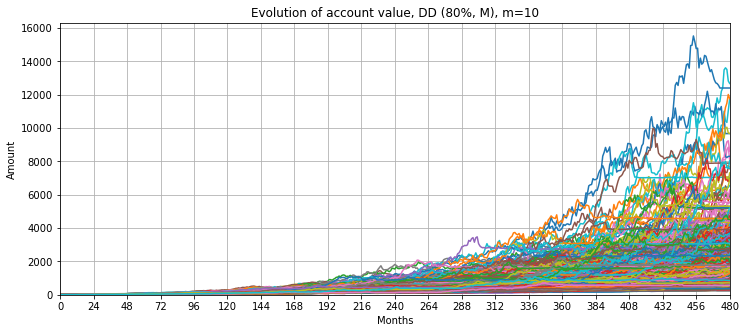

In [127]:
for m in multipliers_2:
    title = 'Evolution of account value, DD (80%, M), m=' + str(m)
    fun.plot_evolution(acc_value_dd, m, title)

Constrained DD

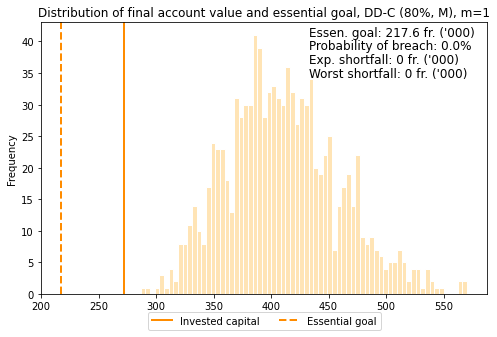

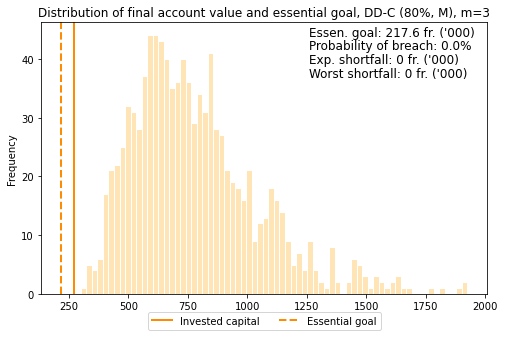

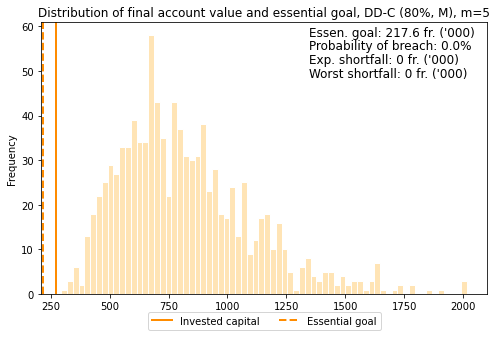

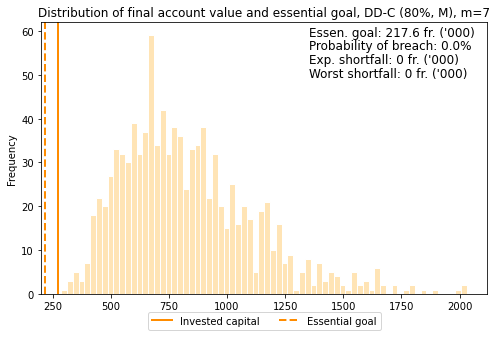

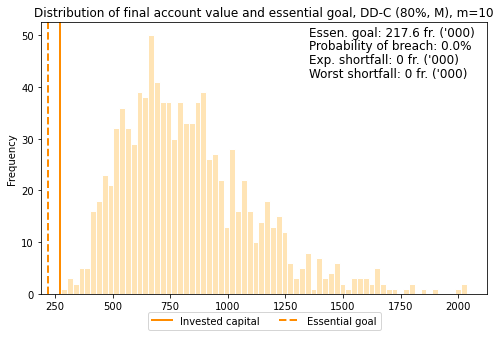

In [128]:
for m in multipliers_2:
    title = 'Distribution of final account value and essential goal, DD-C (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_dd_c, stats_table_dd_c, m, color, goal_zer, imp_goal, title, init_cap, ess=True)

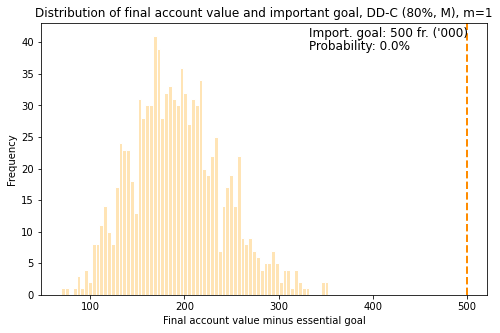

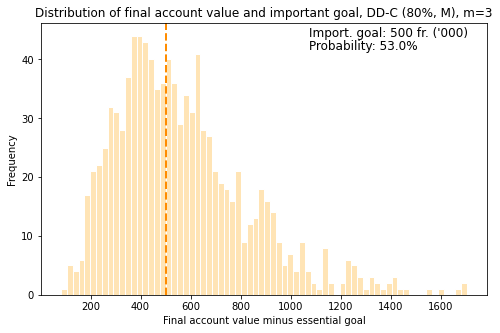

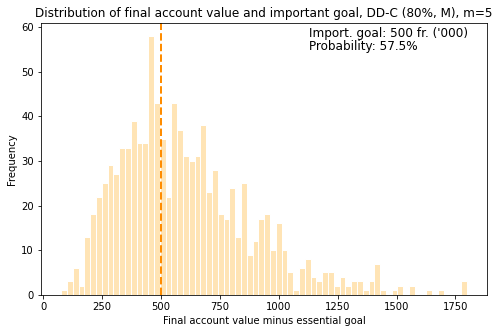

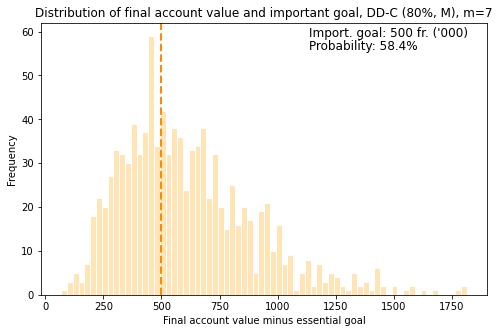

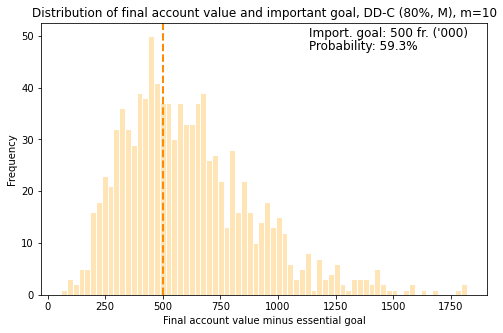

In [129]:
for m in multipliers_2:
    title = 'Distribution of final account value and important goal, DD-C (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_dd_c, stats_table_dd_c, m, color, goal_zer, imp_goal, title, init_cap, ess=False)

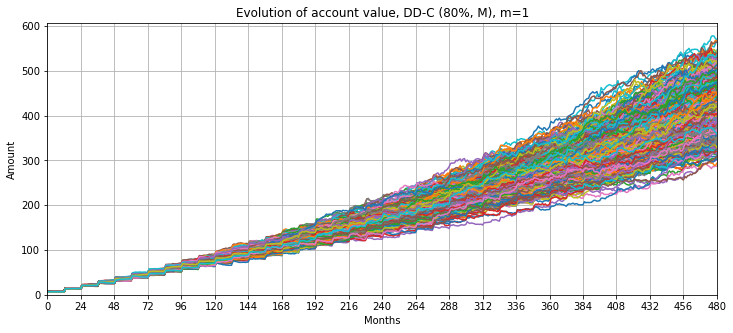

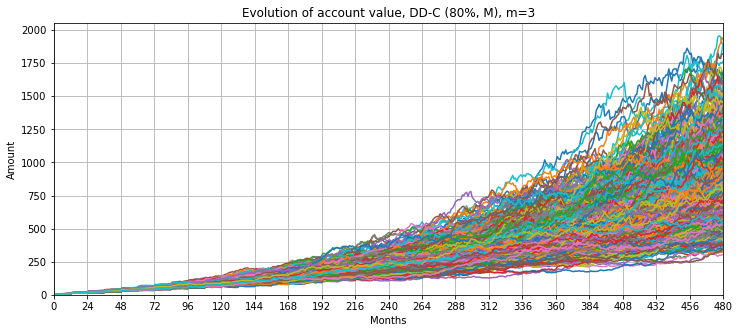

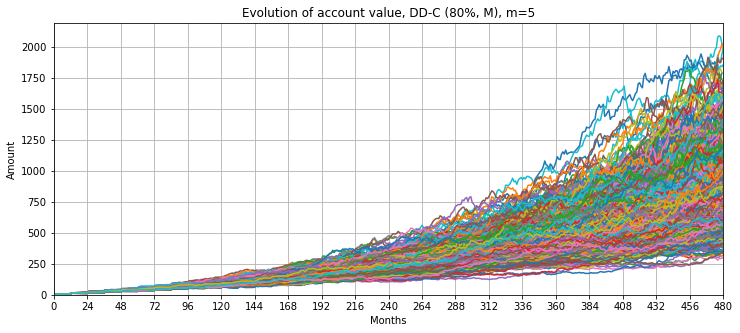

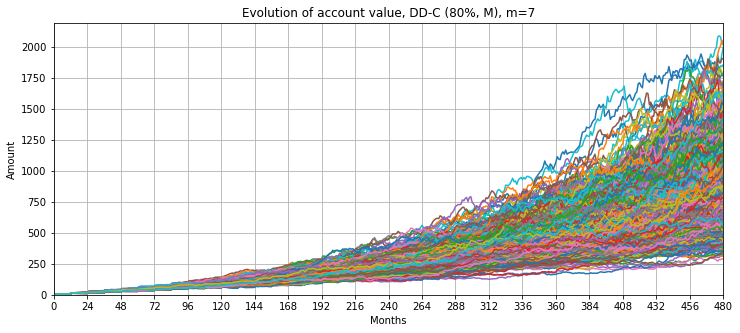

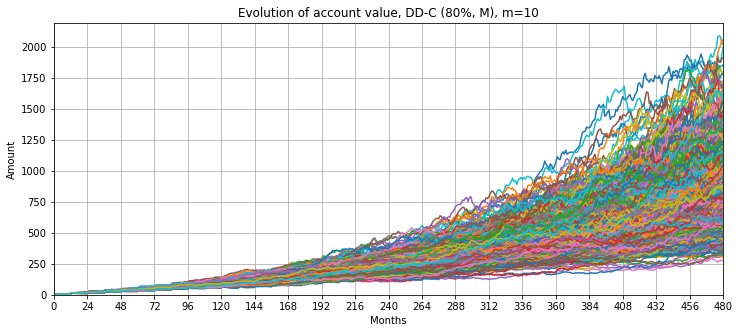

In [130]:
for m in multipliers_2:
    title = 'Evolution of account value, DD-C (80%, M), m=' + str(m)
    fun.plot_evolution(acc_value_dd_c, m, title)

Constrained DD and saved taxes

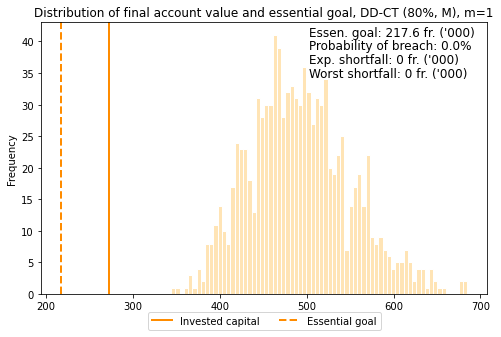

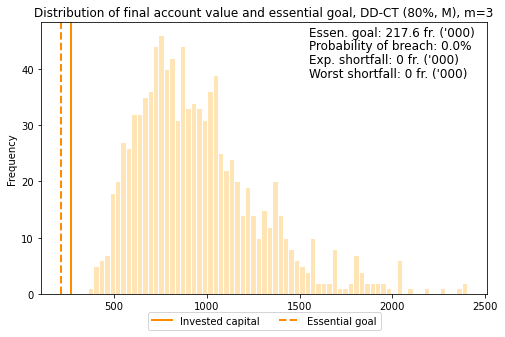

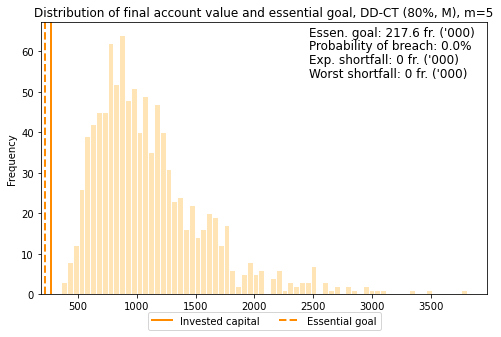

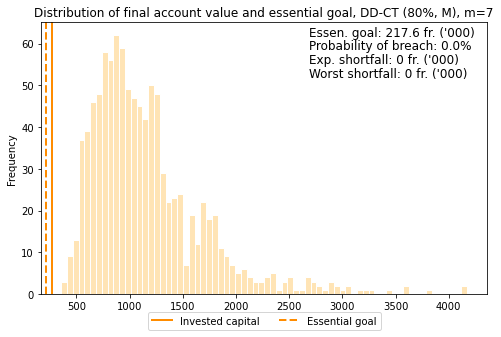

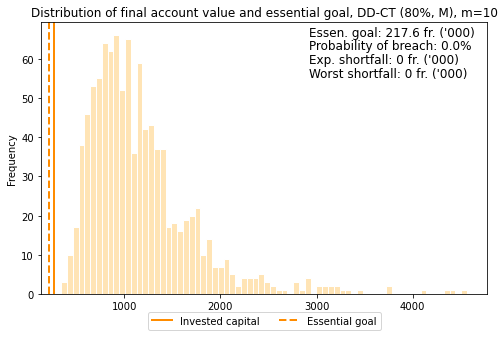

In [131]:
for m in multipliers_2:
    title = 'Distribution of final account value and essential goal, DD-CT (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_dd_ct, stats_table_dd_ct, m, color, goal_zer, imp_goal, title, init_cap, ess=True)

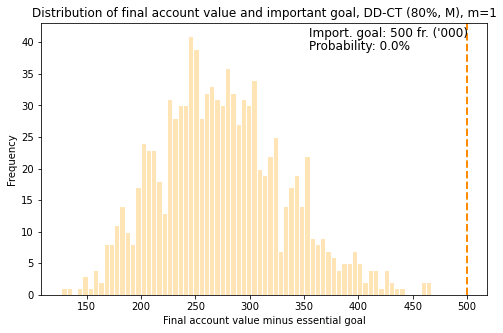

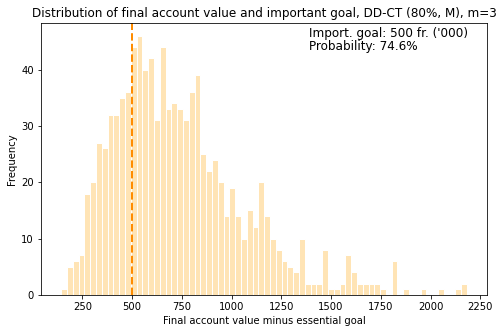

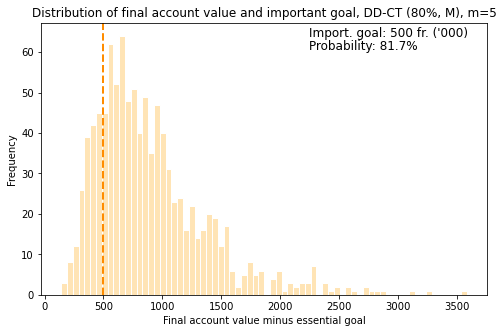

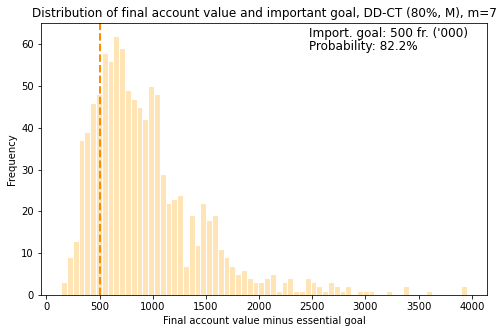

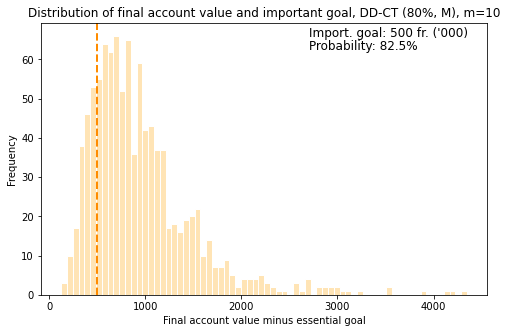

In [132]:
for m in multipliers_2:
    title = 'Distribution of final account value and important goal, DD-CT (80%, M), m=' + str(m)
    fun.plot_distribution(acc_value_dd_ct, stats_table_dd_ct, m, color, goal_zer, imp_goal, title, init_cap, ess=False)

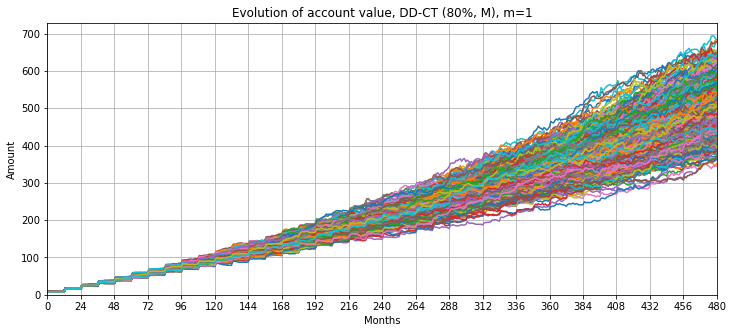

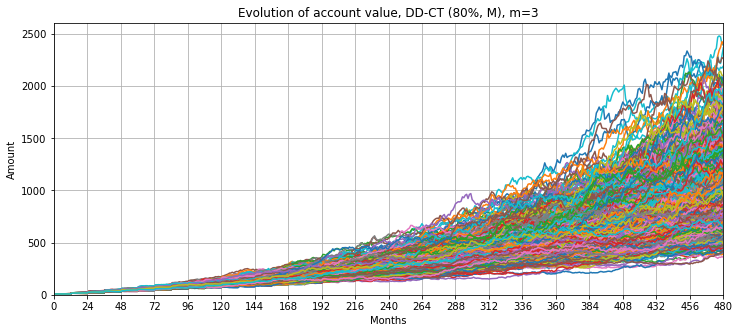

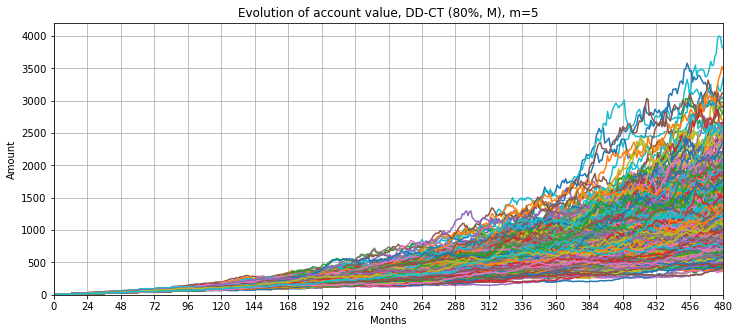

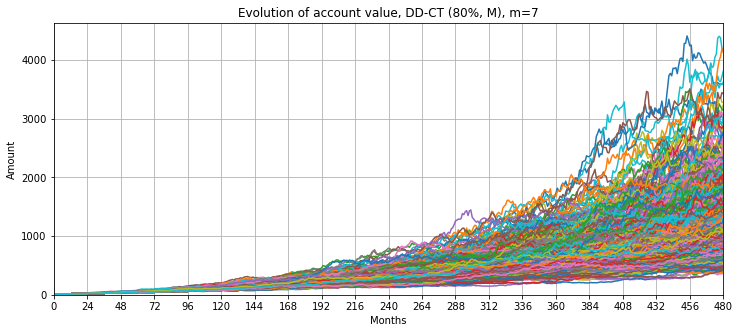

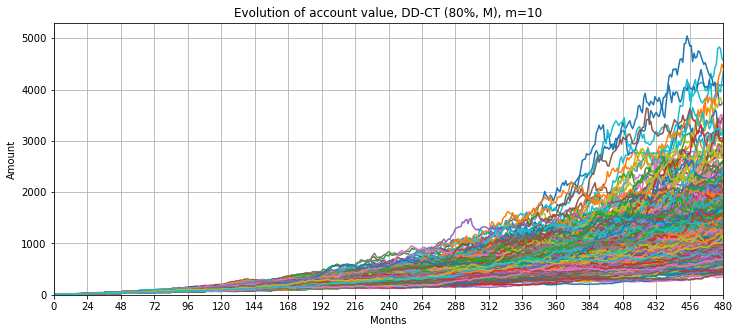

In [133]:
for m in multipliers_2:
    title = 'Evolution of account value, DD-CT (80%, M), m=' + str(m)
    fun.plot_evolution(acc_value_dd_ct, m, title)